In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

In [2]:
first_df = pd.read_csv('first_df.csv')

In [3]:
first_df.columns

Index(['Value Sales Brand', 'Average Price Brand',
       'Weighted Handling Distribution', 'Number of Items', 'promo_cut',
       'promo_bundle', 'AVERAGE PROMO PRICE', 'AVERAGE PRICE MKT',
       'SEASONALITY MARKET', 'LOCKDOWN', 'DISTRIBUTED SAMPLES (.000)',
       'ONLINE REVIEWS', 'ONLINE RATINGS', 'Positive Opinions',
       'Negative Opinions', 'NUMBER OF STORIES IN FREE-SEEDING',
       'NUMBER OF INFLUENCERS INVOLVED', 'GRP TV 20''', 'GRP TV 10''',
       'INVESTMENTS TV', 'INVESTMENTS PRINT', 'digital_investments',
       'digital_impressions', 'tv_grp', 'competitors_grp', 'total_editors',
       'total_totem', 'events_seasonal', 'grp_erosion',
       'Sales Value Growth (%)', 'season_Fall', 'season_Spring',
       'season_Summer', 'season_Winter'],
      dtype='object')

In [4]:
first_df

,Value Sales Brand,Average Price Brand,Weighted Handling Distribution,Number of Items,promo_cut,promo_bundle,AVERAGE PROMO PRICE,AVERAGE PRICE MKT,SEASONALITY MARKET,LOCKDOWN,...,competitors_grp,total_editors,total_totem,events_seasonal,grp_erosion,Sales Value Growth (%),season_Fall,season_Spring,season_Summer,season_Winter
0,10121.342133,13.663993,0.498359,11.0,903.954730,0.0,9.941495,19.356821,0.817907,0.0,...,52.429821,2.0,0.000000,0.0,245.639542,0.000000,0,0,0,1
1,9878.054460,13.663993,0.498359,11.0,883.070937,0.0,9.941495,18.614709,1.031365,0.0,...,43.282679,4.0,193.000000,0.0,-43.282679,-2.403710,0,0,0,1
2,9687.164515,13.663993,0.519654,11.0,848.388721,0.0,9.941495,18.363933,1.018538,0.0,...,75.381143,4.0,193.000000,0.0,115.264326,-1.932465,0,0,0,1
3,10229.404469,13.762076,0.542164,11.0,903.954730,0.0,9.941495,18.331977,1.102858,0.0,...,66.045357,0.0,193.000000,0.0,114.610112,5.597509,0,0,0,1
4,9905.274717,12.648761,0.543184,11.0,1093.598078,0.0,9.941495,19.834410,1.123541,0.0,...,67.279000,0.0,436.416667,0.0,-67.279000,-3.168608,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,27260.953905,14.445653,0.650278,17.0,3306.116622,0.0,8.904765,19.494722,1.245215,0.0,...,11.197857,4.0,0.000000,1.0,-11.197857,1.877143,1,0,0,0
204,24764.265113,14.518840,0.656968,17.0,3043.975098,0.0,9.556374,19.209027,1.164946,0.0,...,23.410000,2.0,0.000000,0.0,-23.410000,-9.158479,1,0,0,0
205,29020.518704,14.634750,0.671173,17.0,3808.353965,0.0,9.540101,19.520369,1.575507,0.0,...,7.735000,0.0,0.000000,0.0,-7.735000,17.187078,0,0,0,1
206,37064.926435,14.420265,0.676526,16.0,4558.889402,0.0,9.147896,19.078066,1.939300,0.0,...,0.232143,3.0,0.000000,1.0,-0.232143,27.719724,0,0,0,1


In [5]:
first_df = first_df.fillna(0)

In [6]:
first_df['promo'] = first_df['promo_cut']+first_df['promo_bundle']
first_df = first_df.drop(['promo_cut', 'promo_bundle'], axis = 1)

In [7]:
def check_high_correlation(corr_matrix, threshold=0.85):
    
    # Initialize an empty list to store the results
    highly_correlated_pairs = []

    # Iterate through the correlation matrix
    for i in range(len(corr_matrix.columns)):
        for j in range(i + 1, len(corr_matrix.columns)):
            # Get the correlation value
            corr_value = corr_matrix.iloc[i, j]
            if abs(corr_value) > threshold:
                # If the correlation is above the threshold, print the variable names and correlation
                var1 = corr_matrix.columns[i]
                var2 = corr_matrix.columns[j]
                highly_correlated_pairs.append((var1, var2, corr_value))
                print(f"High correlation between {var1} and {var2}: {corr_value:.4f}")

    return highly_correlated_pairs

In [8]:
#First dataset
corr_matrix = first_df.corr()
check_high_correlation(corr_matrix, threshold=0.8)
# Check for high correlations
high_corr_pairs = check_high_correlation(corr_matrix, threshold=0.8)

High correlation between Value Sales Brand and promo: 0.9011
High correlation between Average Price Brand and Weighted Handling Distribution: 0.8214
High correlation between NUMBER OF STORIES IN FREE-SEEDING and NUMBER OF INFLUENCERS INVOLVED: 0.9952
High correlation between GRP TV 20'' and INVESTMENTS TV: 0.9051
High correlation between GRP TV 20'' and tv_grp: 0.9762
High correlation between GRP TV 20'' and grp_erosion: 0.9447
High correlation between INVESTMENTS TV and tv_grp: 0.9340
High correlation between INVESTMENTS TV and grp_erosion: 0.8923
High correlation between digital_investments and digital_impressions: 0.9194
High correlation between tv_grp and grp_erosion: 0.9711
High correlation between Value Sales Brand and promo: 0.9011
High correlation between Average Price Brand and Weighted Handling Distribution: 0.8214
High correlation between NUMBER OF STORIES IN FREE-SEEDING and NUMBER OF INFLUENCERS INVOLVED: 0.9952
High correlation between GRP TV 20'' and INVESTMENTS TV: 0.90

In [9]:
first_df = first_df.drop([ 'NUMBER OF STORIES IN FREE-SEEDING', 
                          'digital_impressions', 'tv_grp', 'Average Price Brand', 'grp_erosion'], axis = 1)

In [10]:
#First dataset
corr_matrix = first_df.corr()
check_high_correlation(corr_matrix, threshold=0.85)
# Check for high correlations
high_corr_pairs = check_high_correlation(corr_matrix, threshold=0.85)

High correlation between Value Sales Brand and promo: 0.9011
High correlation between GRP TV 20'' and INVESTMENTS TV: 0.9051
High correlation between Value Sales Brand and promo: 0.9011
High correlation between GRP TV 20'' and INVESTMENTS TV: 0.9051


In [11]:
first_df = first_df.drop(['season_Fall'], axis = 1)

In [12]:
first_df.columns

Index(['Value Sales Brand', 'Weighted Handling Distribution',
       'Number of Items', 'AVERAGE PROMO PRICE', 'AVERAGE PRICE MKT',
       'SEASONALITY MARKET', 'LOCKDOWN', 'DISTRIBUTED SAMPLES (.000)',
       'ONLINE REVIEWS', 'ONLINE RATINGS', 'Positive Opinions',
       'Negative Opinions', 'NUMBER OF INFLUENCERS INVOLVED', 'GRP TV 20''',
       'GRP TV 10''', 'INVESTMENTS TV', 'INVESTMENTS PRINT',
       'digital_investments', 'competitors_grp', 'total_editors',
       'total_totem', 'events_seasonal', 'Sales Value Growth (%)',
       'season_Spring', 'season_Summer', 'season_Winter', 'promo'],
      dtype='object')

## Model Building

In [14]:
import pandas as pd
import numpy as np
from sklearn.linear_model import BayesianRidge, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import RFE
from sklearn.exceptions import ConvergenceWarning
import warnings
from yellowbrick.regressor import ResidualsPlot

# Suppress convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Define the regression function
def perform_regression(X_train: pd.DataFrame, X_test: pd.DataFrame, y_train: pd.Series, 
                       model_type: str = 'OLS', simple: bool = True, alpha: float = 1.0,
                       tune_hyperparameters: bool = False, cv: int = 5, feature_selection: bool = True):

    model = None
    y_pred = None
    y_train_pred = None

    # Standardize features if needed
    if model_type in ['BayesianRidge', 'Lasso', 'Ridge']:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        X_train = pd.DataFrame(X_train_scaled, index=X_train.index, columns=X_train.columns)
        X_test = pd.DataFrame(X_test_scaled, index=X_test.index, columns=X_test.columns)

    if model_type == 'OLS':
        # Add a constant to the features for OLS regression
        X_train_const = sm.add_constant(X_train)
        X_test_const = sm.add_constant(X_test)

        # Initialize and fit the model
        model = sm.OLS(y_train, X_train_const)
        results = model.fit()
        y_pred = results.predict(X_test_const)
        y_train_pred = results.predict(X_train_const)

        # Print the summary
        if simple:
            print(results.summary())
        else:
            # Get the p-values of the features
            p_values = results.pvalues

            # Get the features with p-value less than 0.05
            significant_features = p_values[p_values < 0.05].index

            # Perform regression again with the significant features
            X_train_significant = X_train_const[significant_features]
            X_test_significant = X_test_const[significant_features]

            # Initialize and fit the model
            model = sm.OLS(y_train, X_train_significant)
            results = model.fit()

            # Print the summary
            print(results.summary())

            # Make predictions
            y_pred = results.predict(X_test_significant)
            y_train_pred = results.predict(X_train_significant)

    elif model_type == 'BayesianRidge':
        model = BayesianRidge()
        if tune_hyperparameters:
            param_grid = {'alpha_1': [1e-6, 1e-4, 1e-2, 1e0], 'alpha_2': [1e-6, 1e-4, 1e-2, 1e0]}
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Coefficients interpretation
        coef = model.coef_
        selected_features = X_train.columns[np.abs(coef) > 1e-5]
        X_train_selected = sm.add_constant(X_train[selected_features])
        results = sm.OLS(y_train, X_train_selected).fit()
        print(results.summary())

    elif model_type == 'RandomForest':
        model = RandomForestRegressor(n_estimators=1000, random_state=42)
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'max_features': ['auto', 'sqrt', 'log2'],
                'max_depth': [None, 10, 20, 30],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Feature importance
        importance = model.feature_importances_
        sorted_idx = np.argsort(importance)
        plt.barh(X_train.columns[sorted_idx], importance[sorted_idx])
        plt.xlabel("Random Forest Feature Importance")
        plt.show()

    elif model_type == 'GBM':
        model = GradientBoostingRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.05],
                'max_depth': [3, 5, 7],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Feature importance
        importance = model.feature_importances_
        sorted_idx = np.argsort(importance)
        plt.barh(X_train.columns[sorted_idx], importance[sorted_idx])
        plt.xlabel("GBM Feature Importance")
        plt.show()

    elif model_type == 'XGBoost':
        model = XGBRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.2],
                'max_depth': [3, 5, 7],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Feature importance with SHAP
        explainer = shap.Explainer(model, X_train)
        shap_values = explainer(X_train)
        shap.summary_plot(shap_values, X_train, plot_type="bar")

    elif model_type == 'Lasso':
        lasso = Lasso(alpha=alpha, max_iter=10000)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(lasso, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            lasso = grid.best_estimator_
        else:
            lasso.fit(X_train, y_train)
        
        y_pred = lasso.predict(X_test)
        y_train_pred = lasso.predict(X_train)

        # Select features with non-zero coefficients
        selected_features = X_train.columns[lasso.coef_ != 0]
        print("Selected features:", selected_features)

        # Use OLS for interpretability
        X_train_selected = sm.add_constant(X_train[selected_features])
        X_test_selected = sm.add_constant(X_test[selected_features])
    
        ols_model = sm.OLS(y_train, X_train_selected)
        ols_results = ols_model.fit()
        print(ols_results.summary())
        y_pred = ols_results.predict(X_test_selected)
        y_train_pred = ols_results.predict(X_train_selected)

    elif model_type == 'Ridge':
        ridge = Ridge(alpha=alpha)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(ridge, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            ridge = grid.best_estimator_
        else:
            ridge.fit(X_train, y_train)
        
        y_pred = ridge.predict(X_test)
        y_train_pred = ridge.predict(X_train)

        # Select features with coefficients above a certain threshold
        threshold = 1e-5  # Define a threshold for significance
        selected_features = X_train.columns[np.abs(ridge.coef_) > threshold]
        print("Selected features for Ridge:", selected_features)
    
        # Use OLS for interpretability
        X_train_selected = sm.add_constant(X_train[selected_features])
        X_test_selected = sm.add_constant(X_test[selected_features])
    
        ols_model = sm.OLS(y_train, X_train_selected)
        ols_results = ols_model.fit()
        print(ols_results.summary())
        y_pred = ols_results.predict(X_test_selected)
        y_train_pred = ols_results.predict(X_train_selected)
    
    else:
        raise ValueError(f"Unsupported model type: {model_type}")

    # Cross-Validation (Optional)
    if model_type not in ['OLS'] and not simple:
        cv_scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='r2')
        print(f"Cross-Validation R2 Score: {np.mean(cv_scores)} ± {np.std(cv_scores)}")

    # Calculate and print R2 scores
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_pred)
    print(f"R2 Score (Train): {r2_train}")
    print(f"R2 Score (Test): {r2_test}")

    return model, y_pred


## Residuals analyses

In [16]:
# Define functions for residual analysis and plotting
def calculate_mse(y_test, y_pred):
    """Calculate and return the mean squared error."""
    error = mean_squared_error(y_test, y_pred)
    return error

def calculate_residuals(y_test, y_pred):
    """Calculate and return the residuals."""
    residuals = y_test - y_pred
    return residuals

def plot_qq(residuals):
    """Plot the Q-Q plot of the residuals."""
    stats.probplot(residuals, dist="norm", plot=plt)
    plt.title("Normal Q-Q Plot")
    plt.show()

def plot_actual_vs_predicted_scatter(y_test, y_pred):
    """Plot the actual vs predicted values."""
    plt.scatter(y_test, y_pred)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', lw=2)
    plt.xlabel("Actual")
    plt.ylabel("Predicted")
    plt.title("Actual vs Predicted")
    plt.show()

def plot_residuals_histogram(residuals):
    """Plot the residuals histogram."""
    sns.histplot(residuals, kde=True)
    plt.title("Residuals Histogram")
    plt.show()

def plot_actual_vs_predicted(y_test, y_pred):
    """Plot the actual vs predicted values."""
    plt.figure(figsize=(13, 6))
    plt.scatter(range(len(y_test)), y_test, color='blue', label='Actual')
    plt.scatter(range(len(y_pred)), y_pred, color='red', label='Predicted')
    plt.title("Actual vs Predicted")
    plt.xlabel("Index of Samples")
    plt.ylabel("Values")
    plt.legend()
    plt.show()

    plt.figure(figsize=(13, 6))
    plt.plot(range(len(y_test)), y_test, color='blue', label='Actual')
    plt.plot(range(len(y_pred)), y_pred, color='red', label='Predicted')
    plt.title("Actual vs Predicted")
    plt.xlabel("Index of Samples")
    plt.ylabel("Values")
    plt.legend()
    plt.show()

    plt.figure(figsize=(13, 6))
    plt.plot(range(len(y_test)), y_test, color='blue')
    plt.plot(range(len(y_pred)), y_pred, color='red')
    plt.scatter(range(len(y_test)), y_test, color='blue', label='Actual')
    plt.scatter(range(len(y_pred)), y_pred, color='red', label='Predicted')
    plt.title("Actual vs Predicted")
    plt.xlabel("Index of Samples")
    plt.ylabel("Values")
    plt.legend()
    plt.show()

def plot_residuals_scatter(y_test, residuals):
    """Plot the residuals scatter plot."""
    plt.scatter(y_test, residuals, color='blue')
    plt.plot([y_test.min(), y_test.max()], [0, 0], color='red', linestyle='--', lw=2)
    plt.title("Residuals Scatter Plot")
    plt.xlabel("Actual")
    plt.ylabel("Residuals")
    plt.show()

def analysis_of_residuals(y_test, y_pred):
    """Perform analysis of residuals."""
    # Calculate residuals
    residuals = y_test - y_pred

    # Calculate mean squared error
    mse = mean_squared_error(y_test, y_pred)
    print(f"Mean Squared Error: {mse}")

    # Plot Q-Q plot
    print("\nQ-Q Plot:")
    plot_qq(residuals)

    # Plot actual vs predicted
    print("\nActual vs Predicted:")
    plot_actual_vs_predicted(y_test, y_pred)

   # print("\nActual vs Predicted Scatter:")
   # plot_actual_vs_predicted_scatter(y_test, y_pred)

    # Plot residuals scatter plot
    print("\nResiduals Scatter Plot:")
    plot_residuals_scatter(y_test, residuals)

    # Plot residuals histogram
    print("\nResiduals Histogram:")
    plot_residuals_histogram(residuals)


# X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.2, random_state=42)
# model, y_pred = perform_regression(X_train, X_test, y_train, model_type='Lasso')
# print(f"R2 Score: {r2_score(y_test, y_pred)}")
# print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")

## Log lag adstock transformation

In [18]:
import pandas as pd
import numpy as np
from scipy.stats import skew, kurtosis

def analyze_and_transform_features(df):
    # Create a copy of the original DataFrame
    df_log = df.copy()
    
    # Iterate over each feature in the DataFrame
    features = df_log.columns
    columns_to_drop = []

    for feature in features:
        # Calculate skewness and kurtosis for the feature
        feature_skewness = skew(df_log[feature])
        feature_kurtosis = kurtosis(df_log[feature])
        
        # Check if the feature needs transformation
        needs_transformation = abs(feature_skewness) > 1 or feature_kurtosis > 3
        
        if needs_transformation:
            print(f"Feature: {feature}")
            print(f"Skewness: {feature_skewness}")
            print(f"Kurtosis: {feature_kurtosis}")
            print(f"Feature '{feature}' needs transformation due to skewness or kurtosis.")
            
            # Apply log transformation
            log_feature = np.log(df_log[feature] + 1)  # Add 1 to avoid log(0)
            new_feature_name = f"{feature}_log"
            df_log[new_feature_name] = log_feature
            
            # Mark the original feature for dropping
            columns_to_drop.append(feature)

    # Drop the original columns that were transformed
    df_log.drop(columns=columns_to_drop, inplace=True)

    # Return the transformed DataFrame
    return df_log

In [19]:
# Reorder columns to place 'Brand Value' first
columns = ['Value Sales Brand'] + [col for col in first_df.columns if col != 'Value Sales Brand']
first_df = first_df[columns]

# Display the new order of columns
print(first_df.columns)

Index(['Value Sales Brand', 'Weighted Handling Distribution',
       'Number of Items', 'AVERAGE PROMO PRICE', 'AVERAGE PRICE MKT',
       'SEASONALITY MARKET', 'LOCKDOWN', 'DISTRIBUTED SAMPLES (.000)',
       'ONLINE REVIEWS', 'ONLINE RATINGS', 'Positive Opinions',
       'Negative Opinions', 'NUMBER OF INFLUENCERS INVOLVED', 'GRP TV 20''',
       'GRP TV 10''', 'INVESTMENTS TV', 'INVESTMENTS PRINT',
       'digital_investments', 'competitors_grp', 'total_editors',
       'total_totem', 'events_seasonal', 'Sales Value Growth (%)',
       'season_Spring', 'season_Summer', 'season_Winter', 'promo'],
      dtype='object')


## Models

In [21]:
dfcopy = first_df.copy()

In [22]:
df_lagged = first_df.copy()

In [23]:
df_lag_ads = df_lagged.copy()

In [24]:
df_log = analyze_and_transform_features(dfcopy)

Feature: SEASONALITY MARKET
Skewness: 2.3363107067459192
Kurtosis: 8.457071912475717
Feature 'SEASONALITY MARKET' needs transformation due to skewness or kurtosis.
Feature: LOCKDOWN
Skewness: 3.17542648054294
Kurtosis: 8.08333333333334
Feature 'LOCKDOWN' needs transformation due to skewness or kurtosis.
Feature: DISTRIBUTED SAMPLES (.000)
Skewness: 1.1828113563974076
Kurtosis: 1.2423407072032653
Feature 'DISTRIBUTED SAMPLES (.000)' needs transformation due to skewness or kurtosis.
Feature: Positive Opinions
Skewness: 4.254692863022814
Kurtosis: 20.61510411667964
Feature 'Positive Opinions' needs transformation due to skewness or kurtosis.
Feature: Negative Opinions
Skewness: 1.0869706255143496
Kurtosis: 1.4576084482885632
Feature 'Negative Opinions' needs transformation due to skewness or kurtosis.
Feature: NUMBER OF INFLUENCERS INVOLVED
Skewness: 7.166641379384534
Kurtosis: 53.833942064435114
Feature 'NUMBER OF INFLUENCERS INVOLVED' needs transformation due to skewness or kurtosis.
Fe

In [25]:
import pandas as pd

# Assume 'df_lag_ads' is your DataFrame

# Lagging the variables by 1 week starting from the second column
lag = 1
for col in df_lag_ads.columns[1:]:  # Start from the second column
    df_lag_ads[col + '_lag'] = df_lag_ads[col].shift(lag)

# Keeping the first column and dropping the original columns except the first one
df_lag_ads = df_lag_ads[[df_lag_ads.columns[0]] + [col for col in df_lag_ads.columns if col.endswith('_lag')]]
df_lag_ads = df_lag_ads.dropna().reset_index(drop=True)

# Implementing the adstock effect
window_adstock = 10
rate_adstock = 0.5

for var in df_lag_ads.columns[1:]:  # Apply adstock starting from the second column
    df_lag_ads[var + '_halo'] = df_lag_ads[var]
    for i in range(1, window_adstock + 1):
        df_lag_ads[var + '_halo'] += df_lag_ads[var].shift(i).fillna(0) * rate_adstock ** i

# Keeping the first column and dropping the intermediate columns after applying adstock
df_lag_ads = df_lag_ads[[df_lag_ads.columns[0]] + [col for col in df_lag_ads.columns if col.endswith('_halo')]]
df_lag_ads = df_lag_ads.dropna().reset_index(drop=True)

df_lag_ads

,Value Sales Brand,Weighted Handling Distribution_lag_halo,Number of Items_lag_halo,AVERAGE PROMO PRICE_lag_halo,AVERAGE PRICE MKT_lag_halo,SEASONALITY MARKET_lag_halo,LOCKDOWN_lag_halo,DISTRIBUTED SAMPLES (.000)_lag_halo,ONLINE REVIEWS_lag_halo,ONLINE RATINGS_lag_halo,...,digital_investments_lag_halo,competitors_grp_lag_halo,total_editors_lag_halo,total_totem_lag_halo,events_seasonal_lag_halo,Sales Value Growth (%)_lag_halo,season_Spring_lag_halo,season_Summer_lag_halo,season_Winter_lag_halo,promo_lag_halo
0,9878.054460,0.498359,11.000000,9.941495,19.356821,0.817907,0.0,24.200000,6069.000000,4.673429,...,3.093619,52.429821,2.000000,0.000000,0.000,0.000000,0.0,0.0,1.0000,903.954730
1,9687.164515,0.747539,16.500000,14.912243,28.293120,1.440319,0.0,36.300000,9331.500000,6.991437,...,4.513379,69.497589,5.000000,193.000000,0.000,-2.403710,0.0,0.0,1.5000,1335.048301
2,10229.404469,0.893423,19.250000,17.397617,32.510493,1.738697,0.0,42.350000,11231.750000,8.152449,...,5.057851,110.129937,6.500000,289.500000,0.000,-3.134320,0.0,0.0,1.7500,1515.912872
3,9905.274717,0.988876,20.625000,18.640304,34.587224,1.972207,0.0,45.375000,12405.875000,8.729784,...,5.250544,121.110326,3.250000,337.750000,0.000,4.030350,0.0,0.0,1.8750,1661.911166
4,8771.515226,1.037622,21.312500,19.261647,37.128022,2.109645,0.0,45.187500,13286.937500,9.018380,...,6.915278,127.834163,1.625000,605.291667,0.000,-1.153433,0.0,0.0,1.9375,1924.553661
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,27260.953905,1.393898,29.375000,21.349424,43.376205,2.197550,0.0,30.189268,63552.392117,9.287615,...,38.863812,72.982423,10.960938,0.546973,0.000,4.689805,0.0,0.0,0.0000,6900.955714
203,24764.265113,1.346872,31.680664,19.574692,41.171997,2.343568,0.0,29.509194,62542.757760,9.268390,...,31.574089,47.655926,9.479492,0.268945,1.000,4.222410,0.0,0.0,0.0000,6755.523074
204,29020.518704,1.330056,32.832031,19.338805,39.784076,2.336291,0.0,29.169158,62417.179150,9.275206,...,25.322670,47.216149,6.738281,0.129932,0.500,-7.043400,0.0,0.0,0.0000,6420.774875
205,37064.926435,1.335853,33.408203,19.205016,39.401463,2.743205,0.0,42.059139,63010.026698,9.280095,...,29.313987,31.325849,3.367188,0.060425,0.250,13.662776,0.0,0.0,1.0000,7017.697952


In [26]:
df_lag_ads_log = analyze_and_transform_features(df_lag_ads)

Feature: Weighted Handling Distribution_lag_halo
Skewness: -1.2404908466925995
Kurtosis: 3.099042631906788
Feature 'Weighted Handling Distribution_lag_halo' needs transformation due to skewness or kurtosis.
Feature: Number of Items_lag_halo
Skewness: -1.5643297987275069
Kurtosis: 3.2235833314709197
Feature 'Number of Items_lag_halo' needs transformation due to skewness or kurtosis.
Feature: AVERAGE PRICE MKT_lag_halo
Skewness: -1.8125253933845504
Kurtosis: 12.958292179159583
Feature 'AVERAGE PRICE MKT_lag_halo' needs transformation due to skewness or kurtosis.
Feature: SEASONALITY MARKET_lag_halo
Skewness: 1.2348379024091498
Kurtosis: 4.658021682065351
Feature 'SEASONALITY MARKET_lag_halo' needs transformation due to skewness or kurtosis.
Feature: LOCKDOWN_lag_halo
Skewness: 3.1544780123642107
Kurtosis: 8.175730737247298
Feature 'LOCKDOWN_lag_halo' needs transformation due to skewness or kurtosis.
Feature: DISTRIBUTED SAMPLES (.000)_lag_halo
Skewness: 1.0761258269311755
Kurtosis: 1.383

### OLS

#### lag adstock

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.923
Model:                            OLS   Adj. R-squared:                  0.908
Method:                 Least Squares   F-statistic:                     63.54
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           4.38e-64
Time:                        00:23:35   Log-Likelihood:                -1465.4
No. Observations:                 165   AIC:                             2985.
Df Residuals:                     138   BIC:                             3069.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

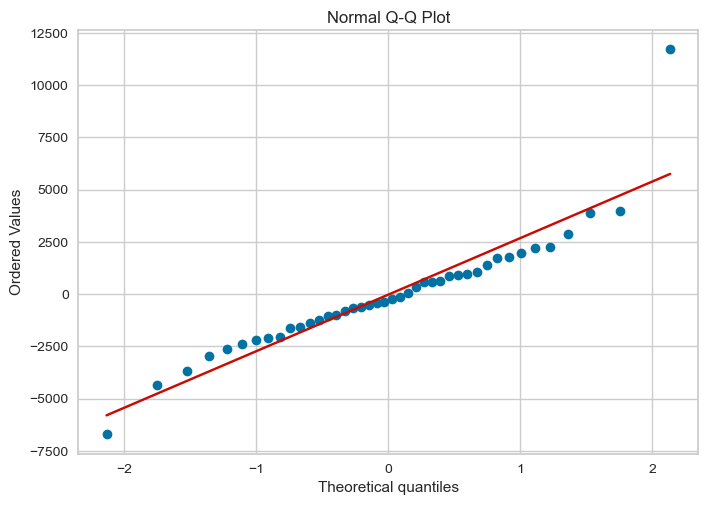


Actual vs Predicted:


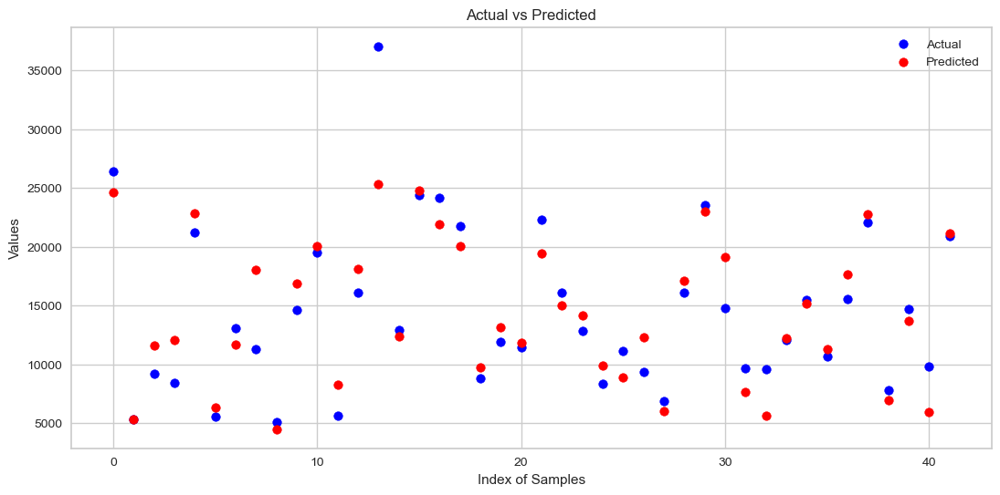

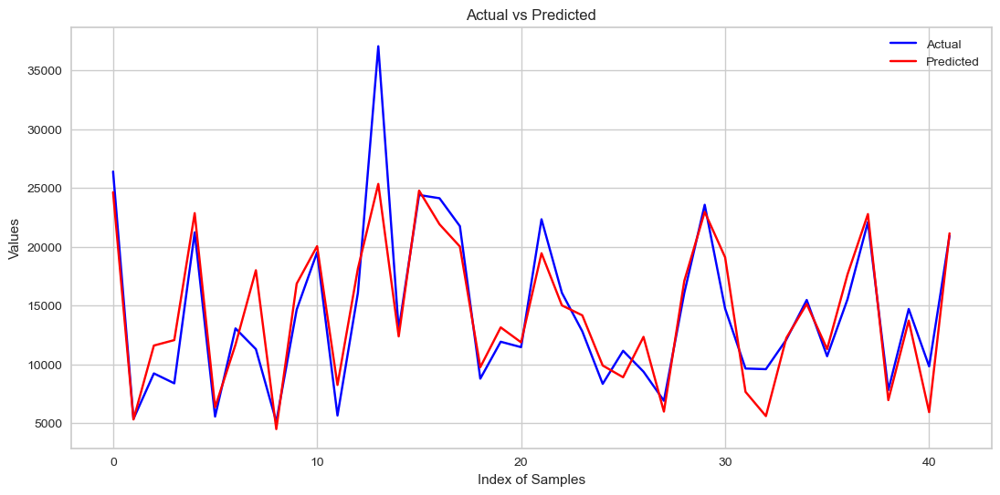

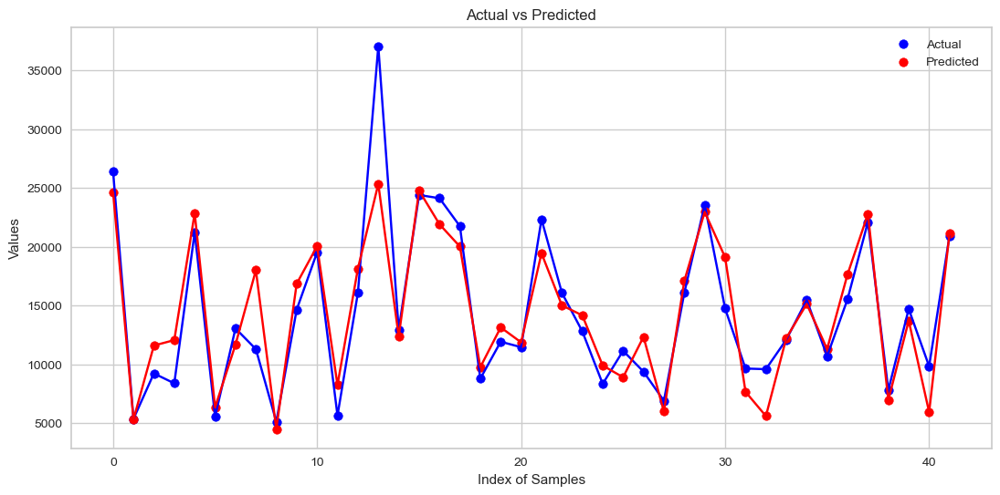


Residuals Scatter Plot:


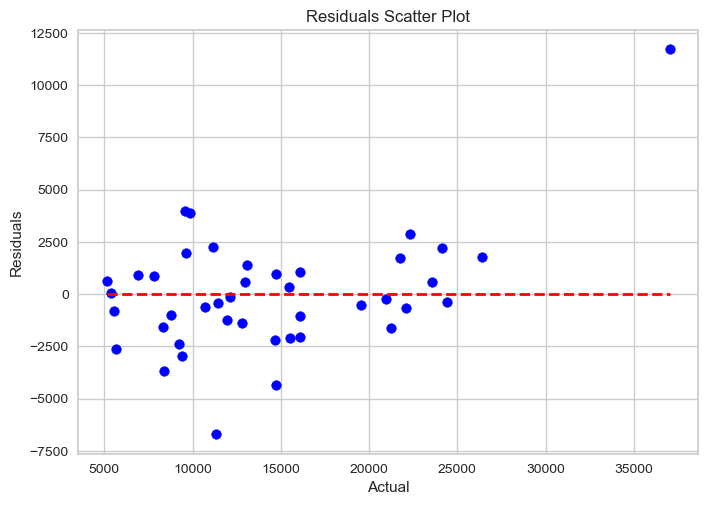


Residuals Histogram:


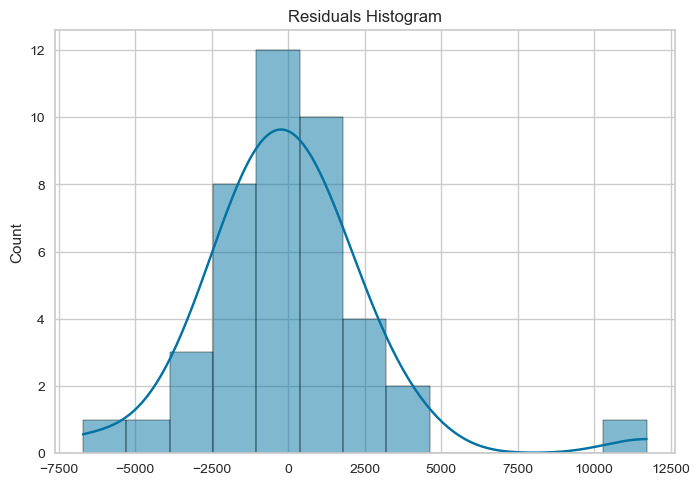

In [38]:
# Assuming dframe1 is your dataframe
X = df_lag_ads.drop(['Value Sales Brand'], axis=1)
y = df_lag_ads['Value Sales Brand']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='OLS', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.920
Model:                            OLS   Adj. R-squared:                  0.909
Method:                 Least Squares   F-statistic:                     83.07
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.06e-68
Time:                        00:23:35   Log-Likelihood:                -1468.2
No. Observations:                 165   AIC:                             2978.
Df Residuals:                     144   BIC:                             3044.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

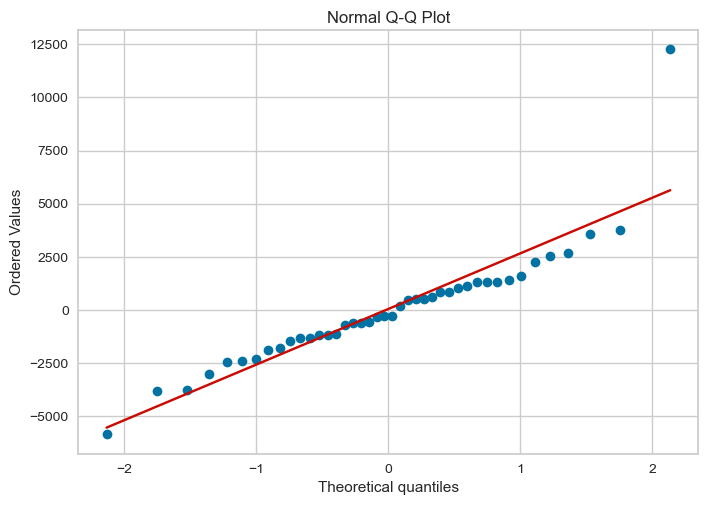


Actual vs Predicted:


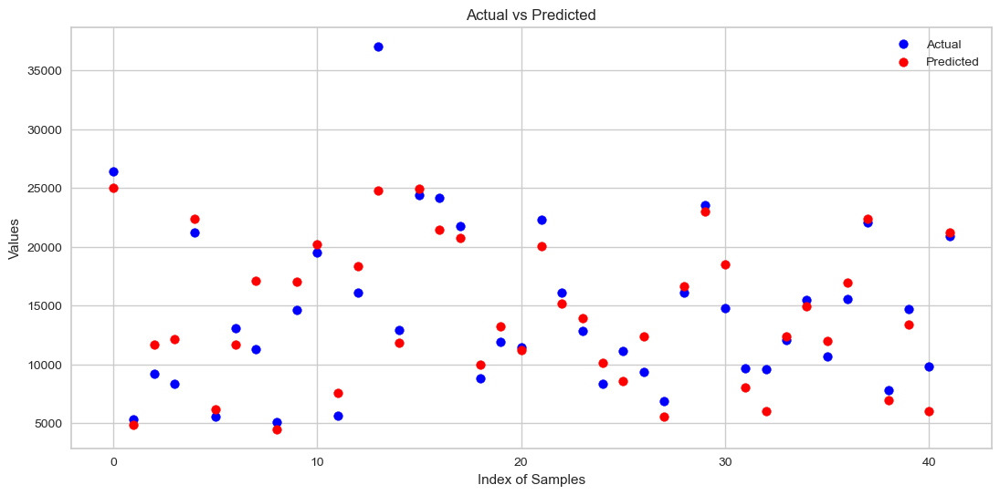

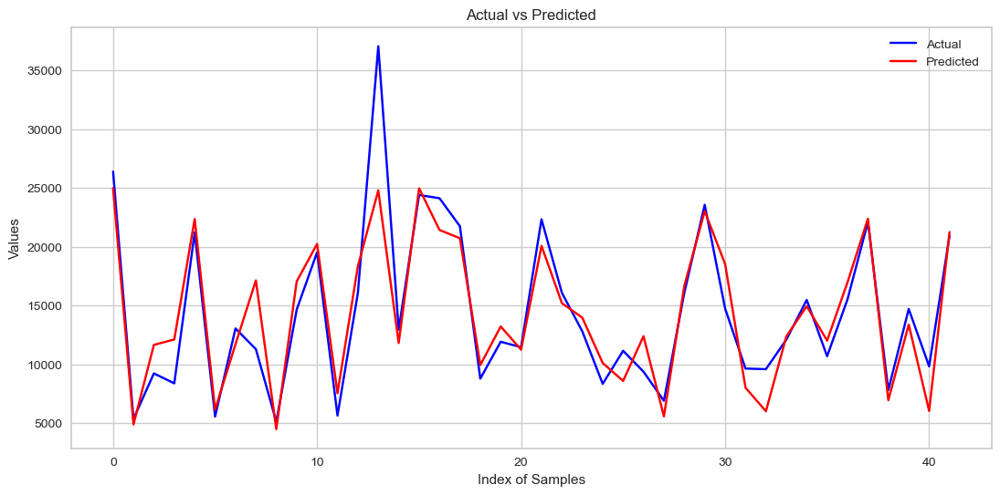

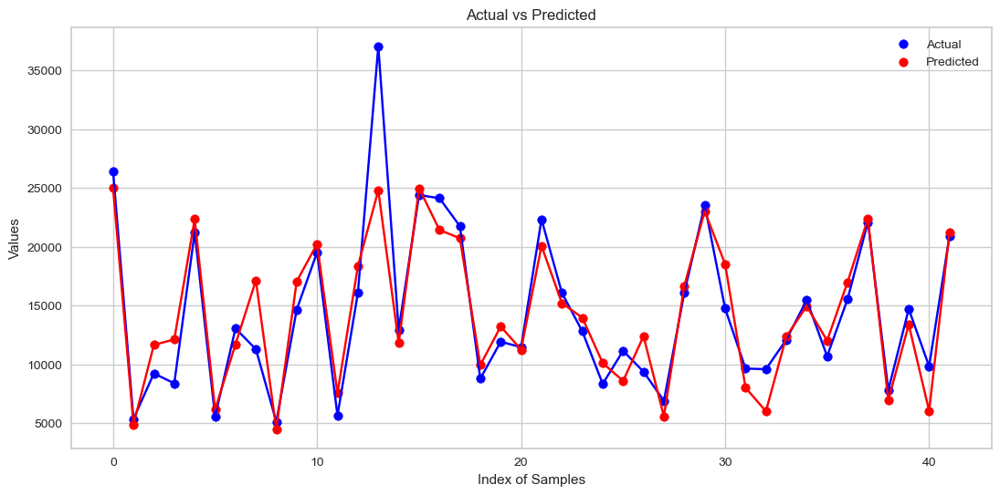


Residuals Scatter Plot:


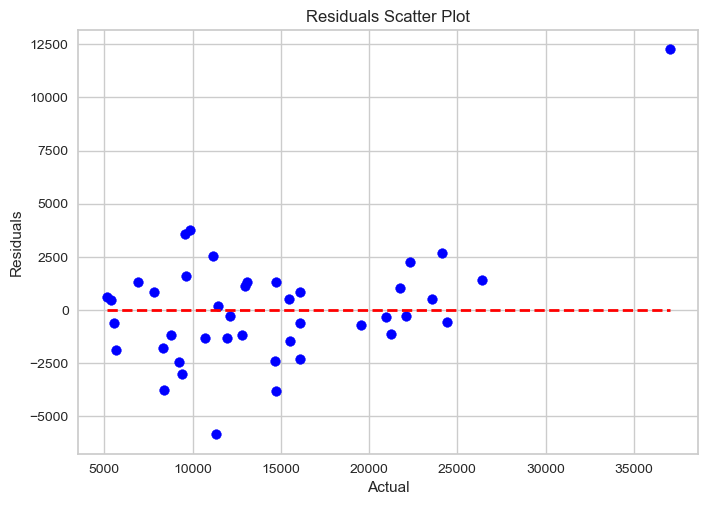


Residuals Histogram:


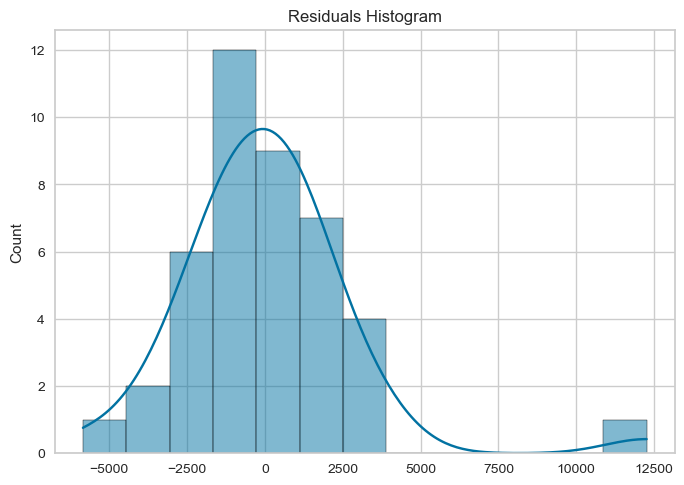

In [39]:
# Assuming dframe1 is your dataframe
X1 = X.drop(['Number of Items_lag_halo', 'ONLINE RATINGS_lag_halo', 'Negative Opinions_lag_halo', 
             'INVESTMENTS TV_lag_halo', 'total_totem_lag_halo', 'events_seasonal_lag_halo'], axis=1)
y1 = y

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='OLS', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.918
Model:                            OLS   Adj. R-squared:                  0.908
Method:                 Least Squares   F-statistic:                     96.67
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           9.20e-71
Time:                        00:23:36   Log-Likelihood:                -1470.6
No. Observations:                 165   AIC:                             2977.
Df Residuals:                     147   BIC:                             3033.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

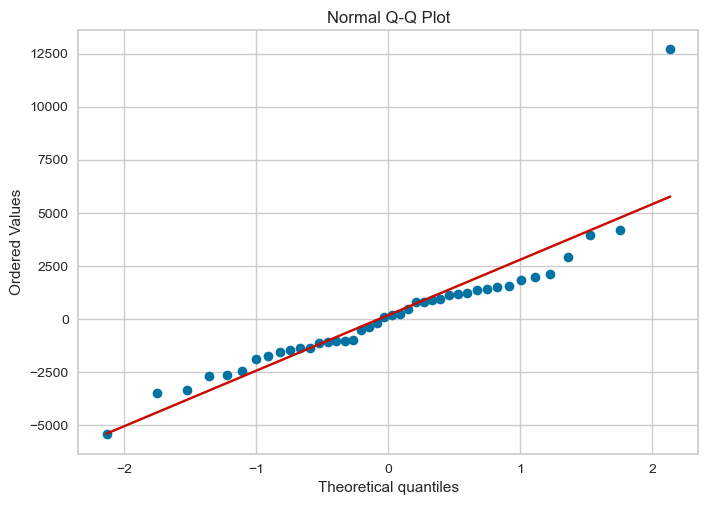


Actual vs Predicted:


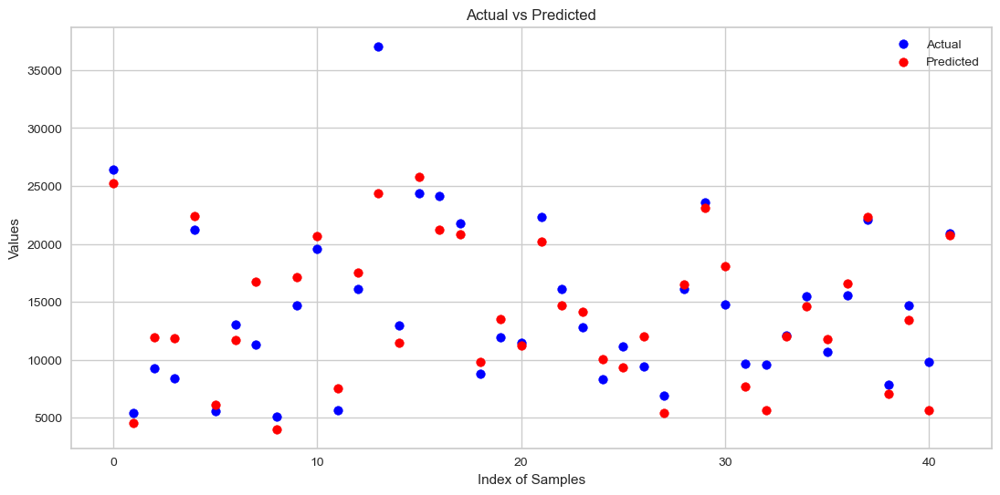

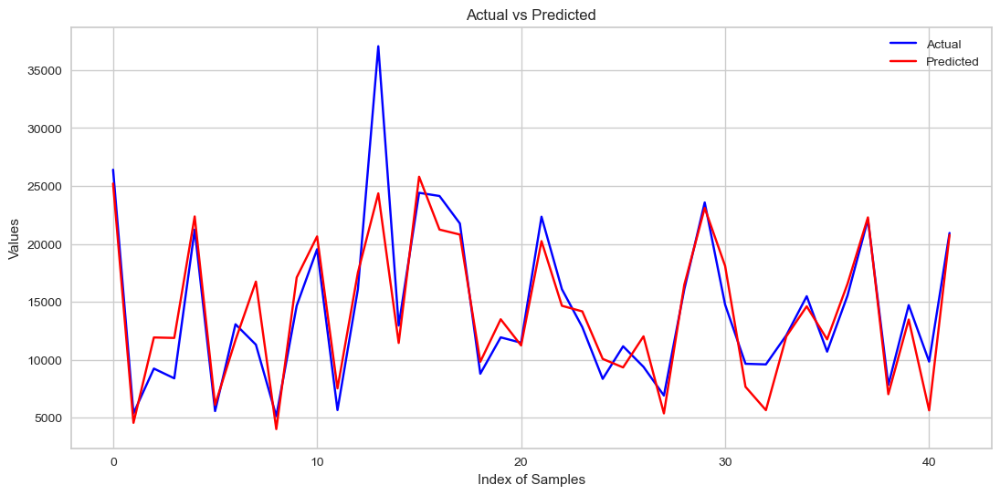

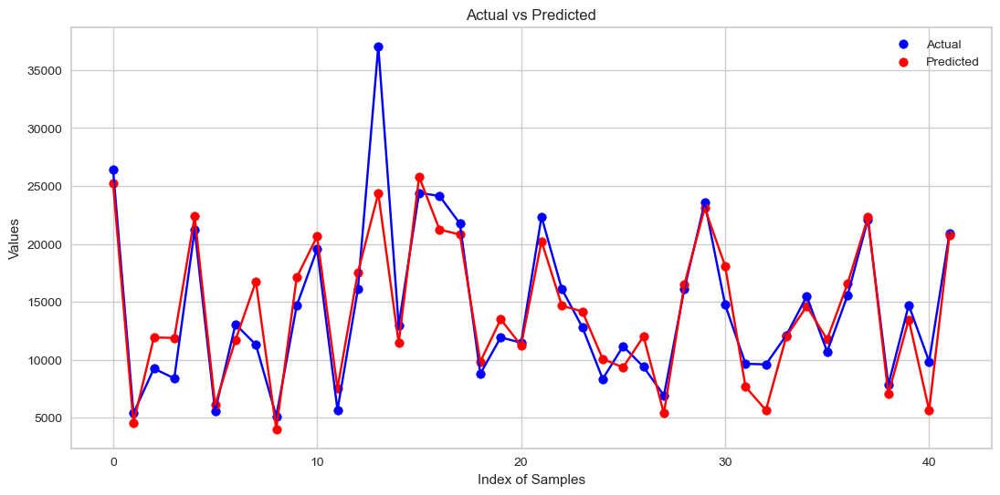


Residuals Scatter Plot:


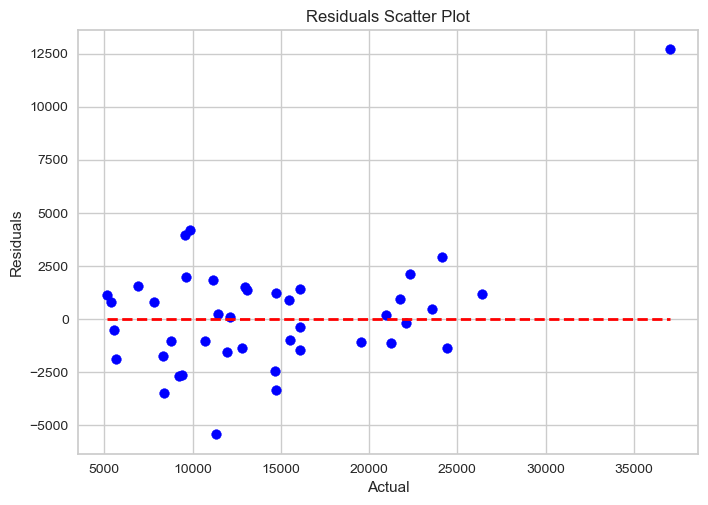


Residuals Histogram:


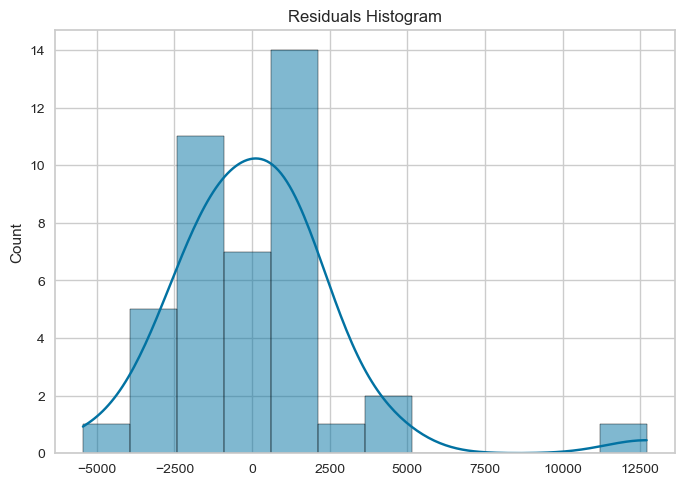

In [40]:
# Assuming dframe1 is your dataframe
X2 = X1.drop(['competitors_grp_lag_halo', 'ONLINE REVIEWS_lag_halo', 'DISTRIBUTED SAMPLES (.000)_lag_halo'], axis=1)
y2 = y1

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='OLS', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.907
Method:                 Least Squares   F-statistic:                     101.2
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           3.76e-71
Time:                        00:23:36   Log-Likelihood:                -1472.2
No. Observations:                 165   AIC:                             2978.
Df Residuals:                     148   BIC:                             3031.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

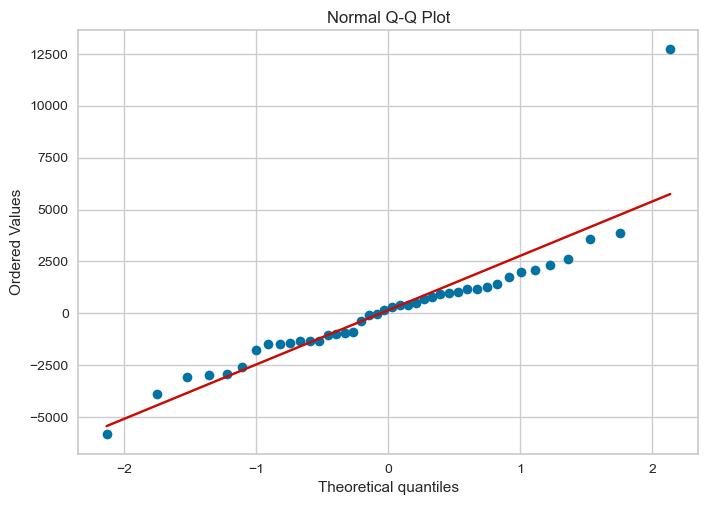


Actual vs Predicted:


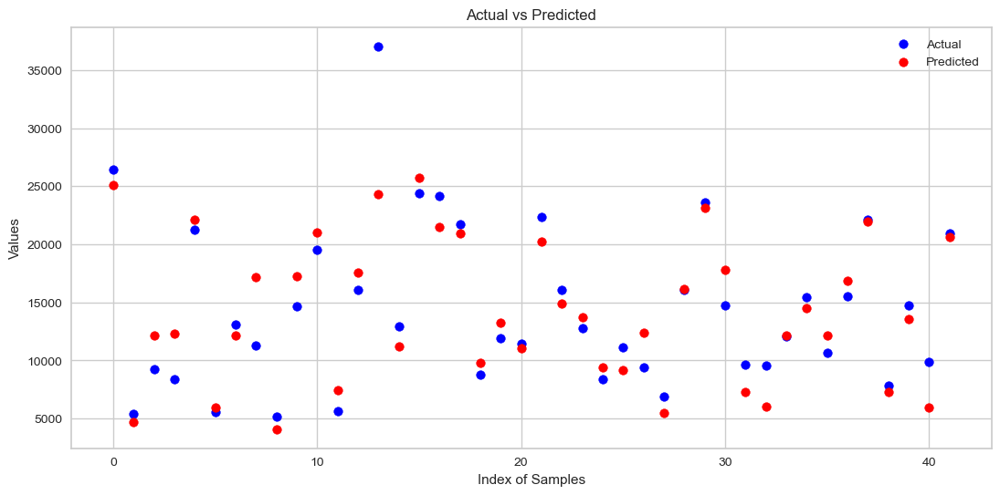

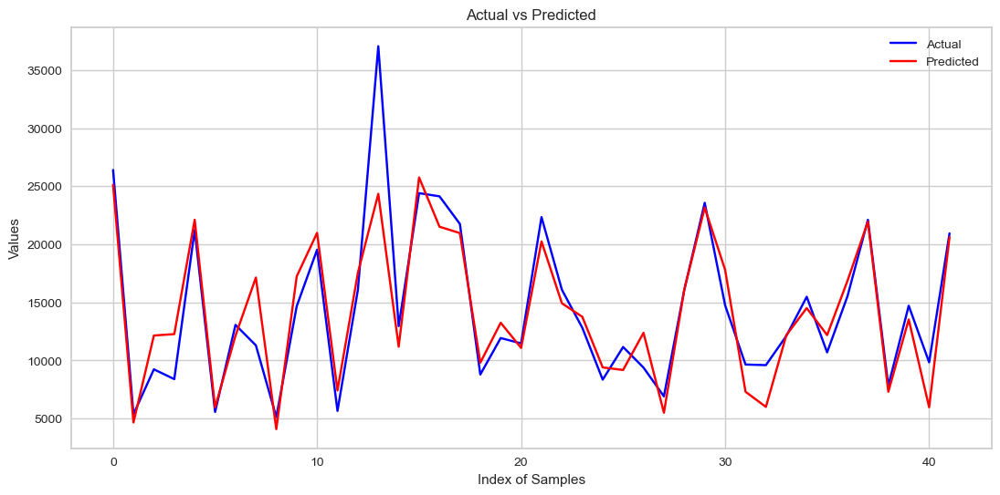

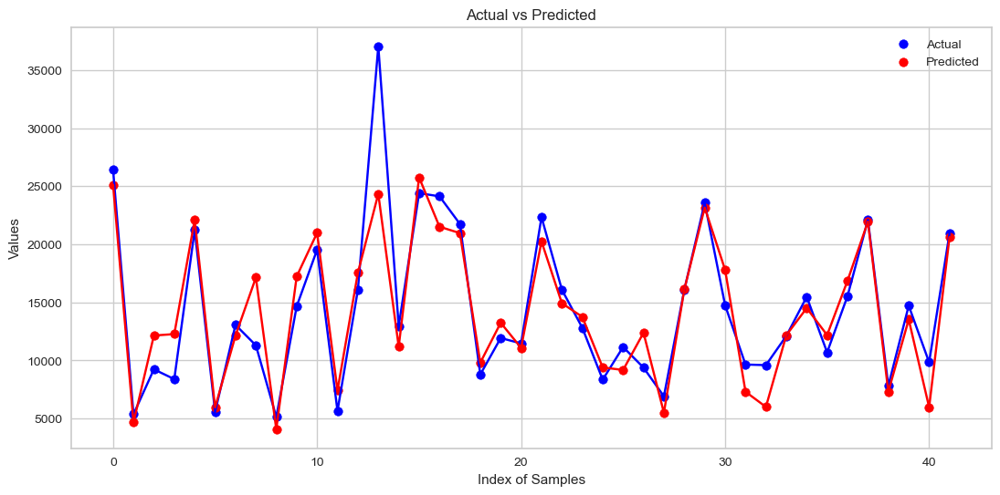


Residuals Scatter Plot:


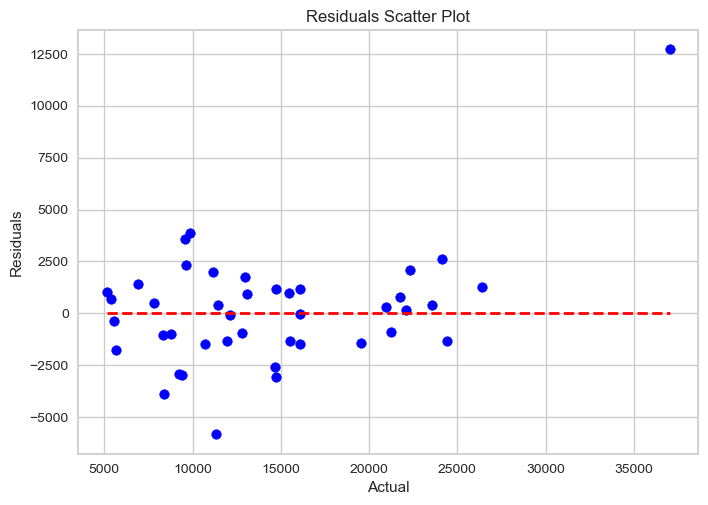


Residuals Histogram:


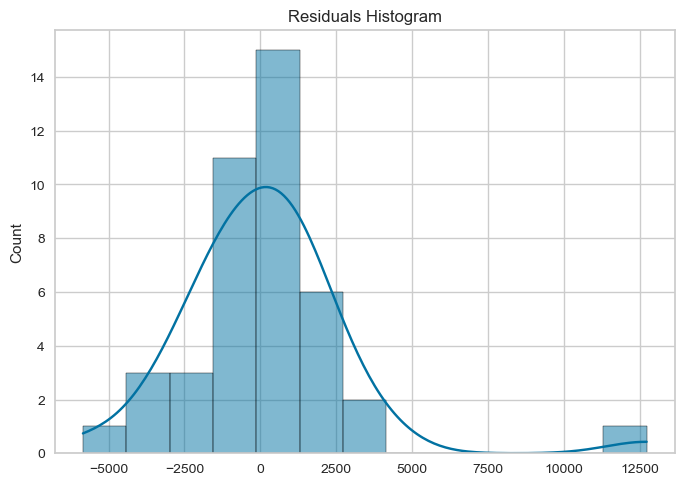

In [41]:
# Assuming dframe1 is your dataframe
X3 = X2.drop(['digital_investments_lag_halo'], axis=1)
y3 = y2

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X3, y3, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='OLS', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.915
Model:                            OLS   Adj. R-squared:                  0.906
Method:                 Least Squares   F-statistic:                     106.9
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.06e-71
Time:                        00:23:37   Log-Likelihood:                -1473.4
No. Observations:                 165   AIC:                             2979.
Df Residuals:                     149   BIC:                             3029.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

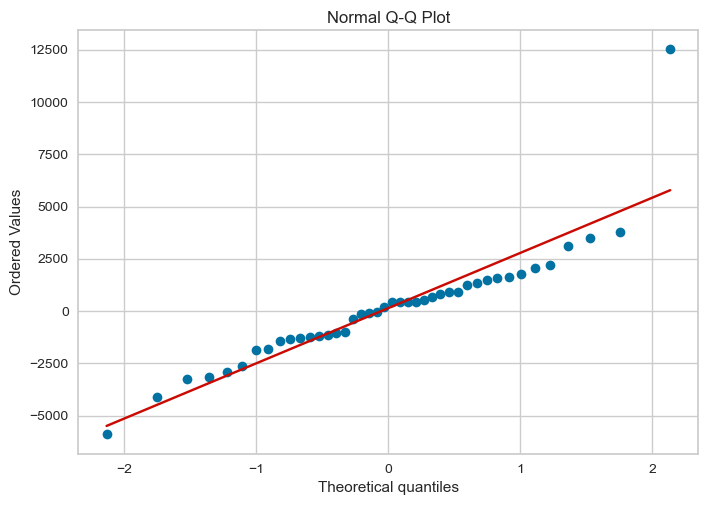


Actual vs Predicted:


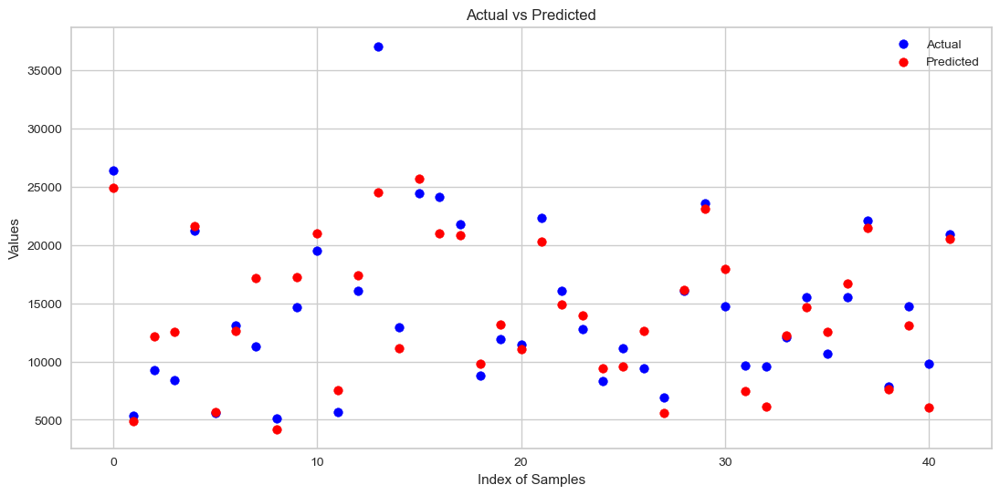

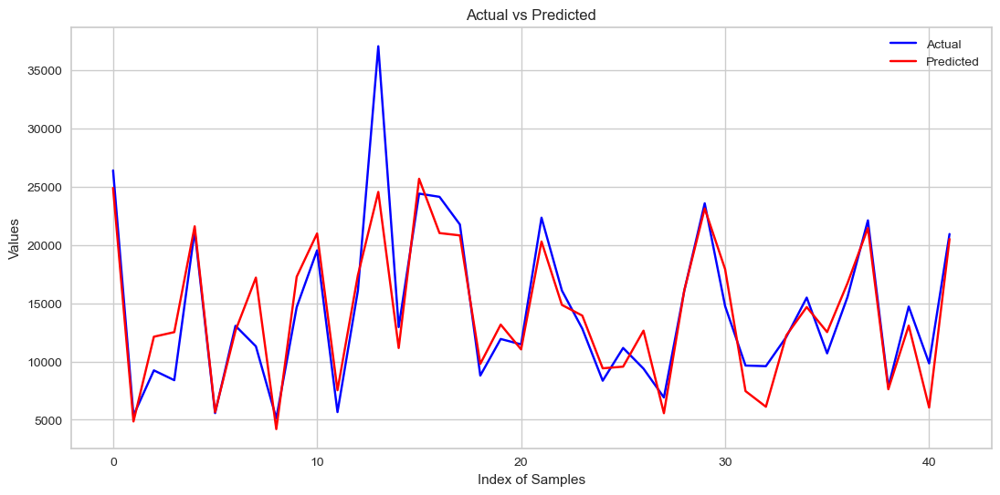

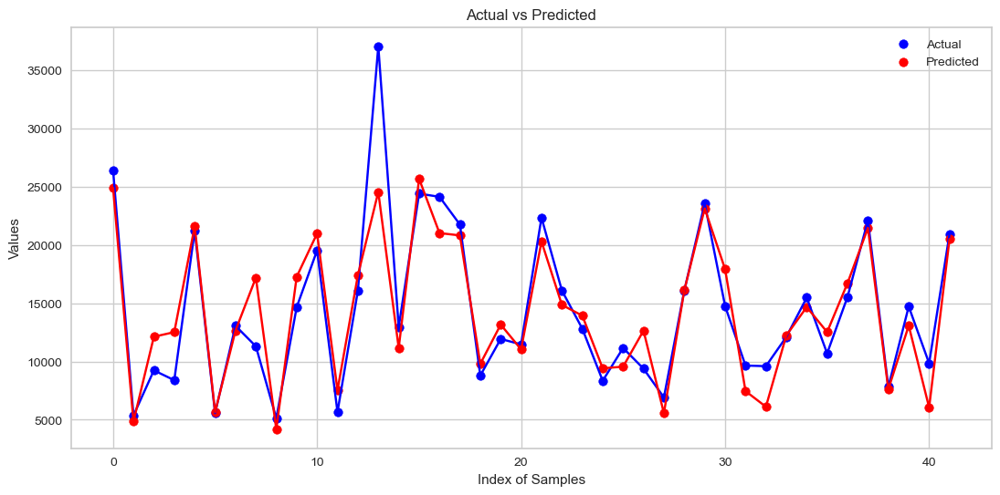


Residuals Scatter Plot:


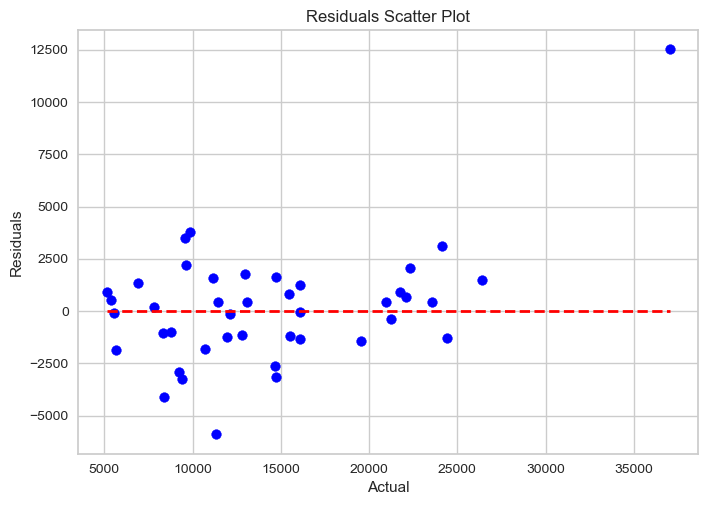


Residuals Histogram:


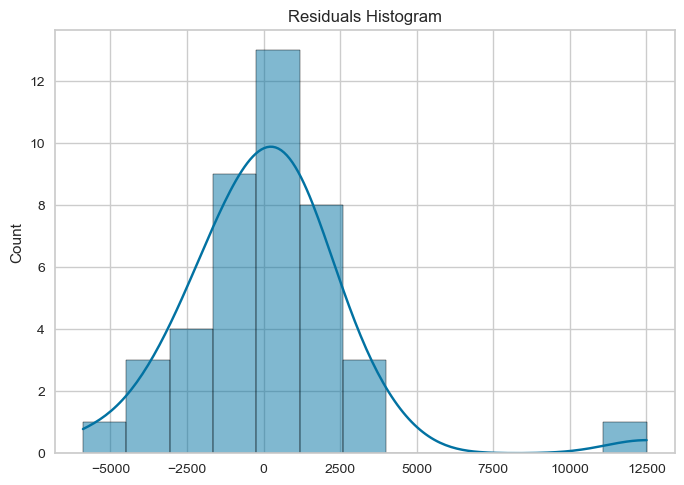

In [42]:
# Assuming dframe1 is your dataframe
X4 = X3.drop(['season_Winter_lag_halo'], axis=1)
y4 = y3

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X4, y4, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='OLS', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

### BayesianRidge

#### lag adstock

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.923
Model:                            OLS   Adj. R-squared:                  0.908
Method:                 Least Squares   F-statistic:                     63.54
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           4.38e-64
Time:                        00:23:43   Log-Likelihood:                -1465.4
No. Observations:                 165   AIC:                             2985.
Df Residuals:                     138   BIC:                             3069.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

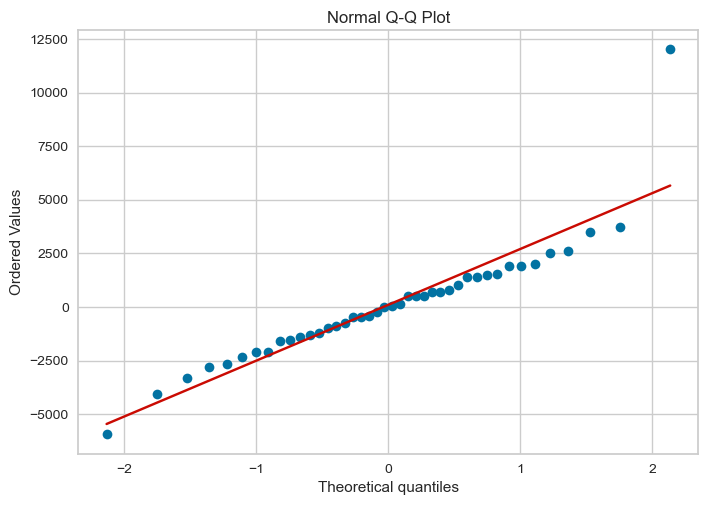


Actual vs Predicted:


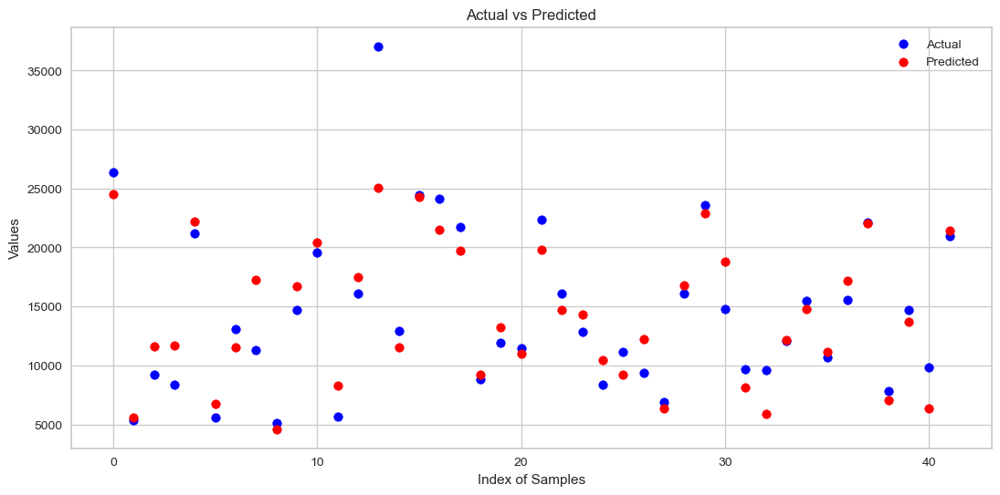

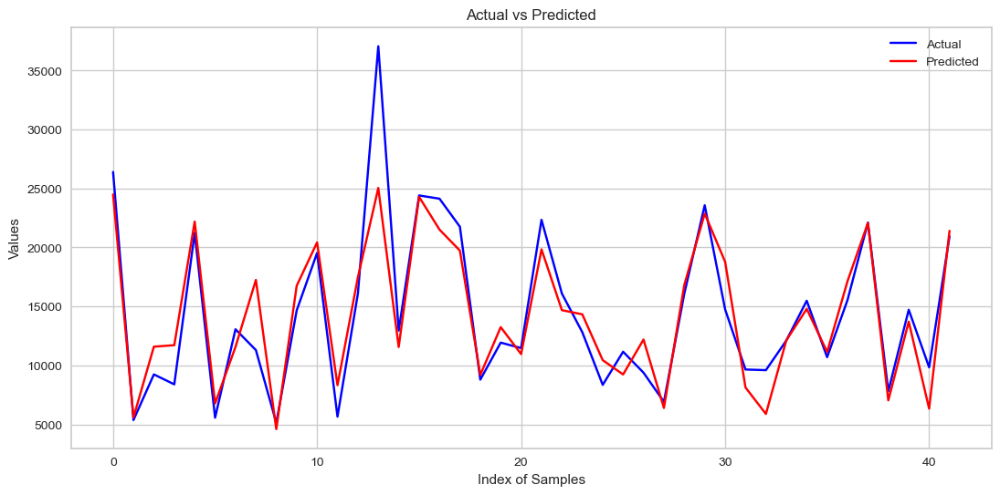

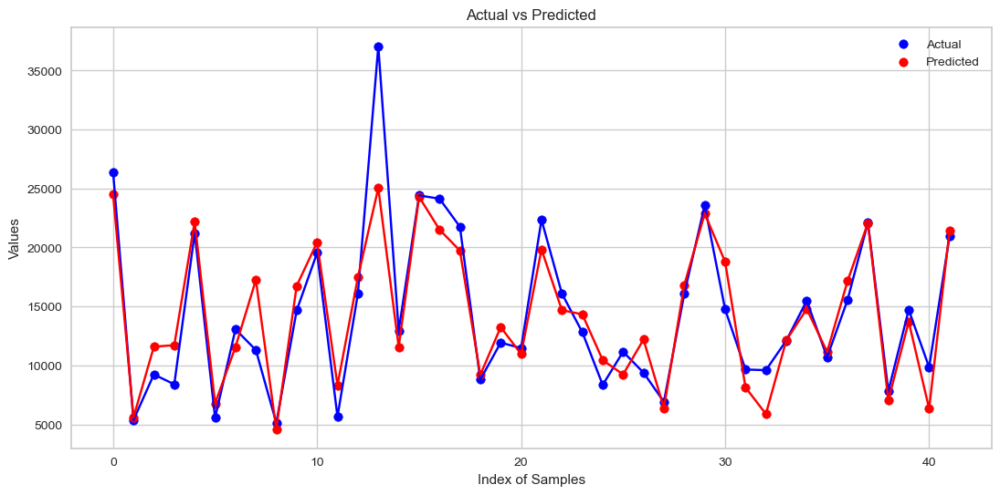


Residuals Scatter Plot:


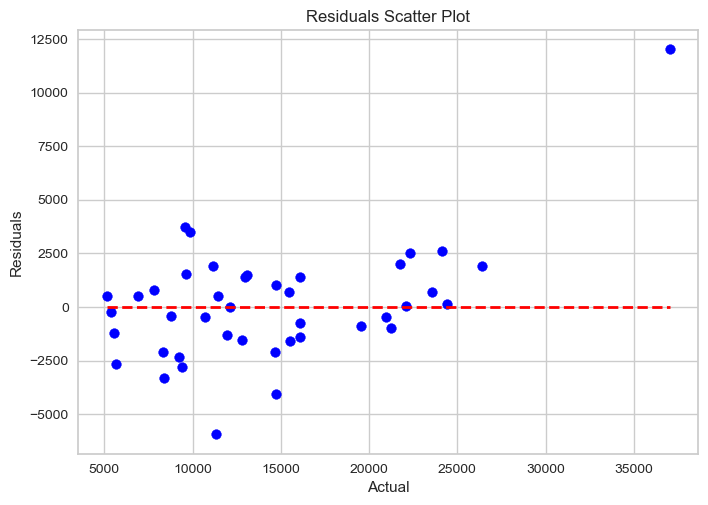


Residuals Histogram:


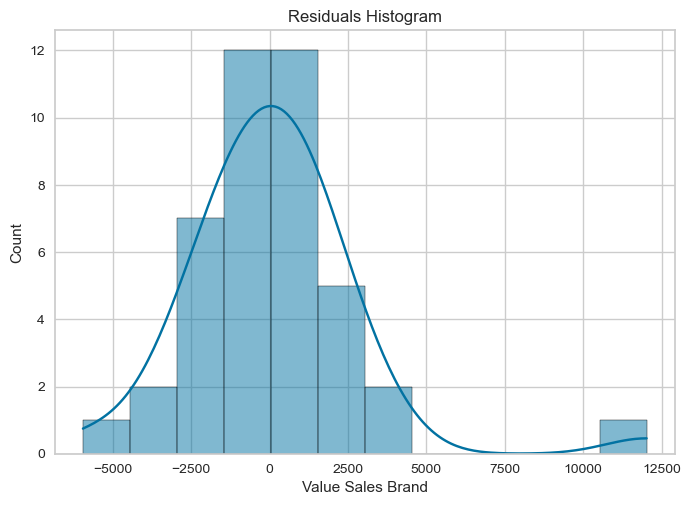

In [59]:
# Assuming dframe1 is your dataframe
X = df_lag_ads.drop(['Value Sales Brand'], axis=1)
y = df_lag_ads['Value Sales Brand']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.889
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     101.6
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           3.49e-66
Time:                        00:23:43   Log-Likelihood:                -1495.3
No. Observations:                 165   AIC:                             3017.
Df Residuals:                     152   BIC:                             3057.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

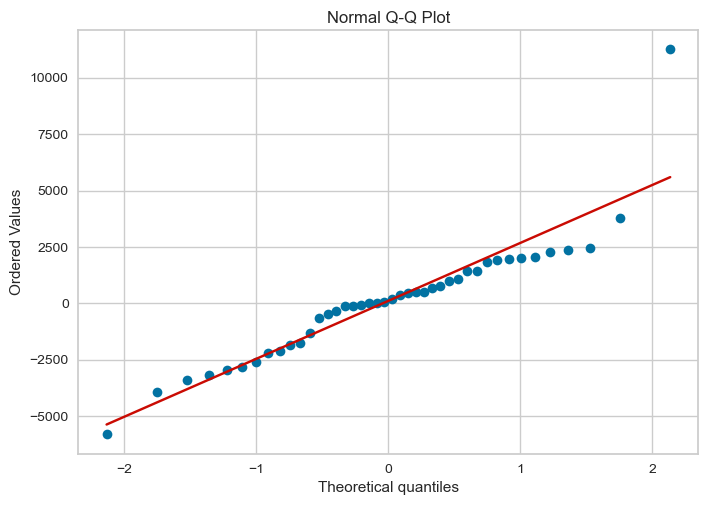


Actual vs Predicted:


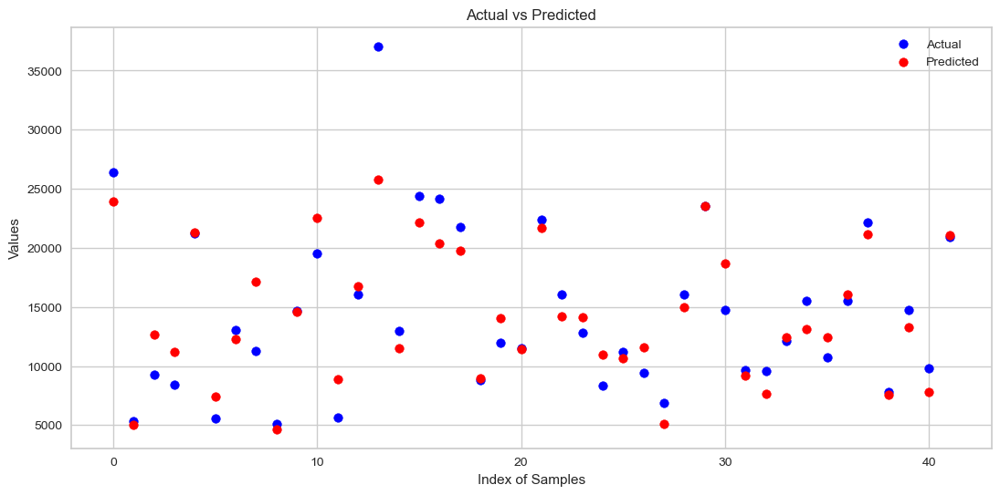

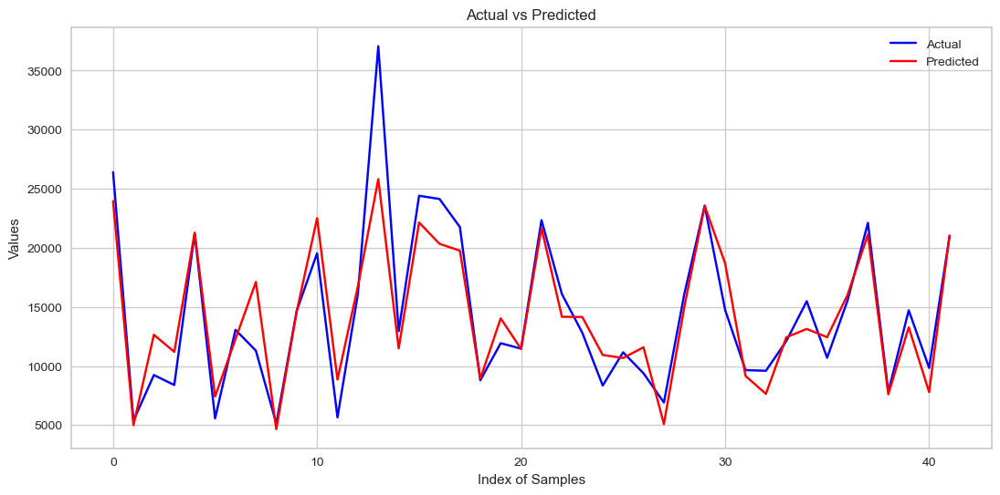

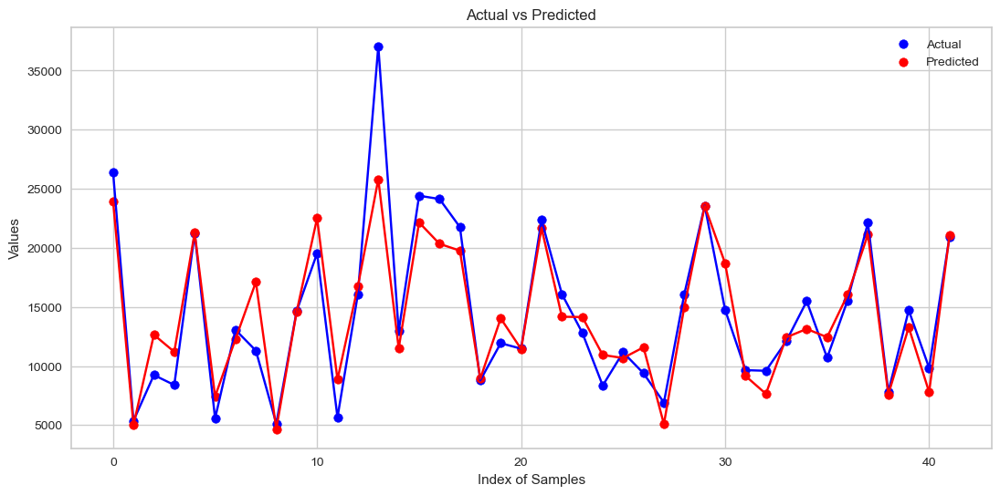


Residuals Scatter Plot:


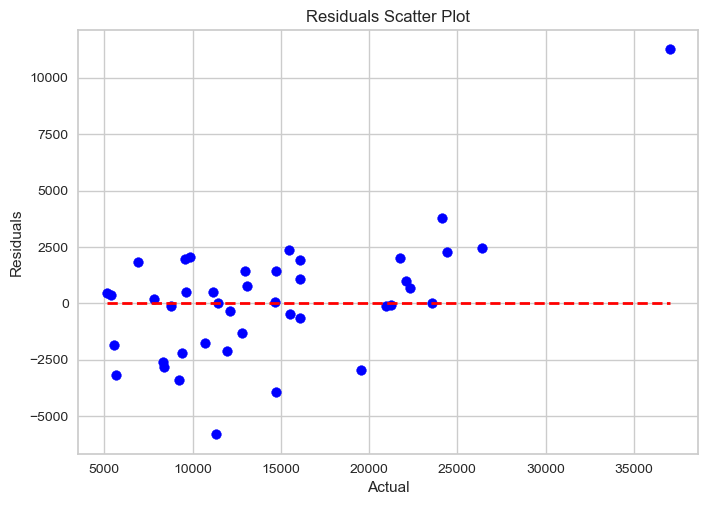


Residuals Histogram:


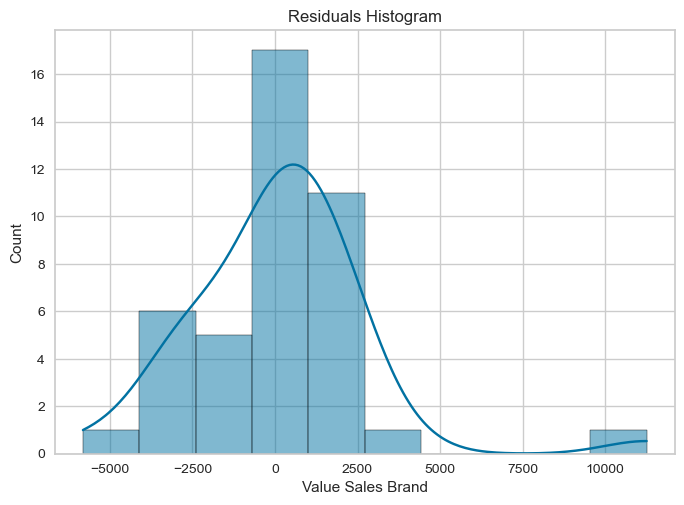

In [60]:
# Assuming dframe1 is your dataframe
X1 = X.drop([    'Number of Items_lag_halo',
    'AVERAGE PRICE MKT_lag_halo',
    'SEASONALITY MARKET_lag_halo',
    'DISTRIBUTED SAMPLES (.000)_lag_halo',
    'ONLINE REVIEWS_lag_halo',
    'ONLINE RATINGS_lag_halo',
    'Negative Opinions_lag_halo',
    'digital_investments_lag_halo',
    'competitors_grp_lag_halo',
    'total_editors_lag_halo',
    'total_totem_lag_halo',
    'events_seasonal_lag_halo',
    'season_Spring_lag_halo','INVESTMENTS TV_lag_halo'], axis=1)
y1 = y

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.887
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     134.9
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.22e-68
Time:                        00:23:44   Log-Likelihood:                -1497.1
No. Observations:                 165   AIC:                             3014.
Df Residuals:                     155   BIC:                             3045.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

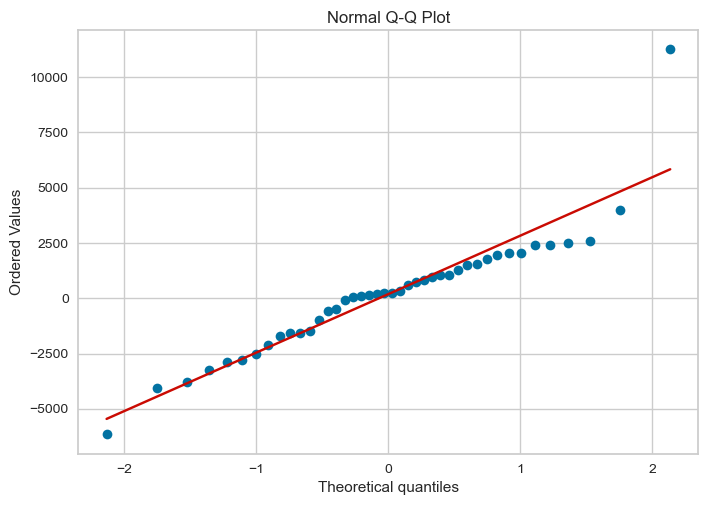


Actual vs Predicted:


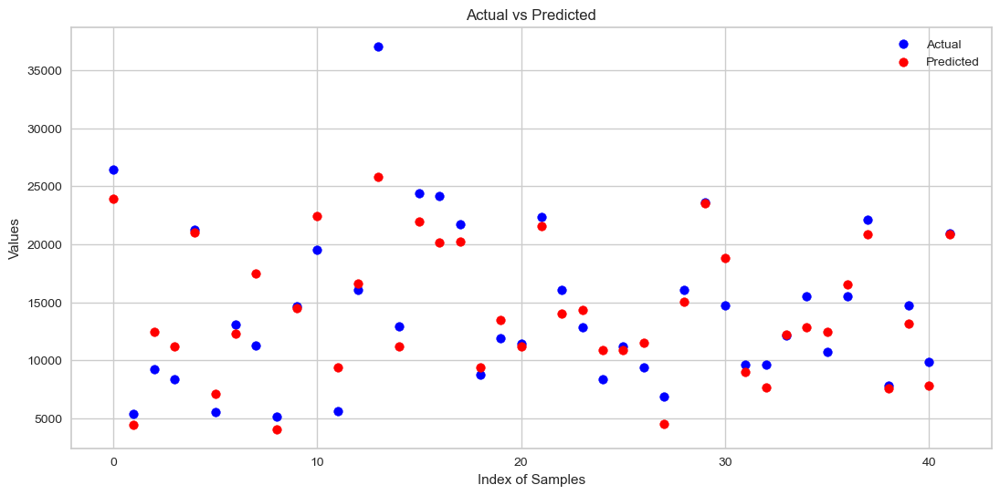

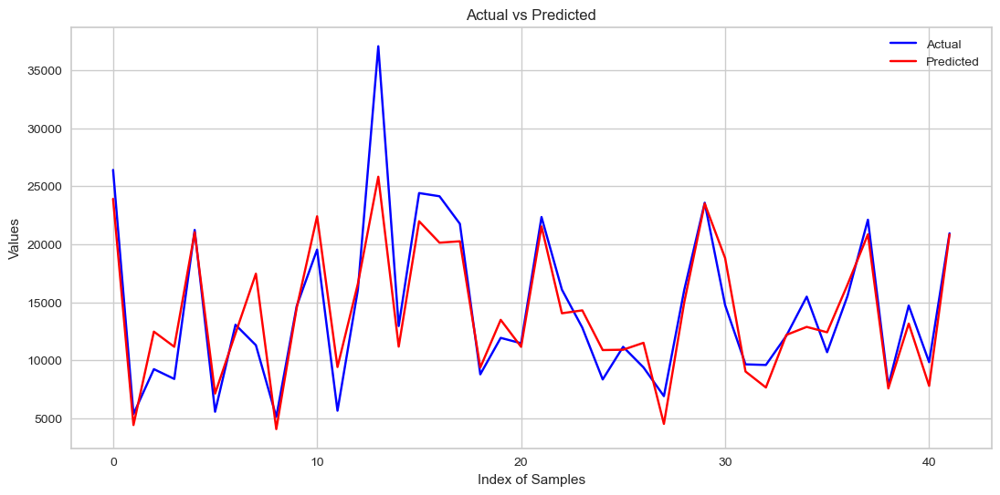

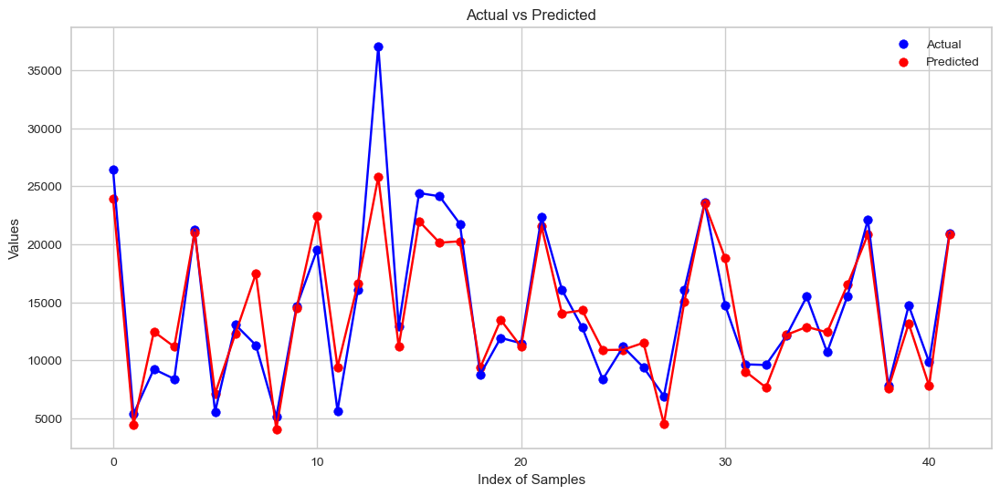


Residuals Scatter Plot:


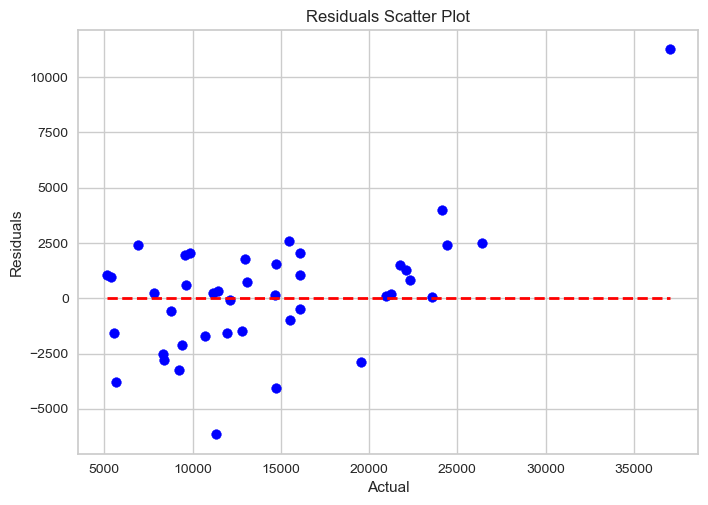


Residuals Histogram:


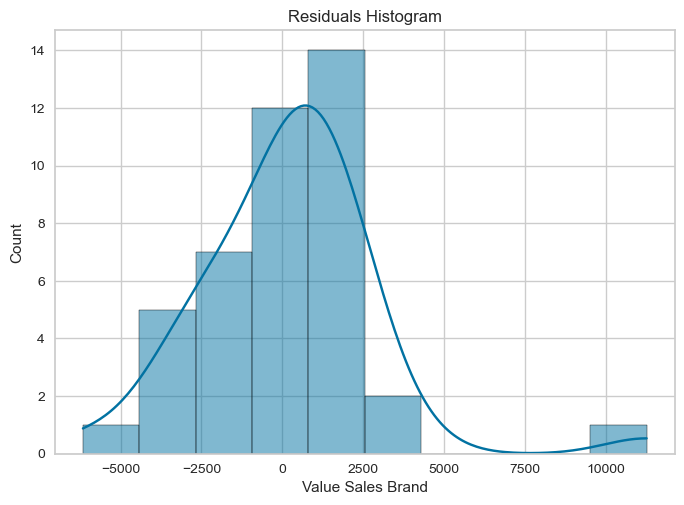

In [61]:
# Assuming dframe1 is your dataframe

X2 = X1.drop(['LOCKDOWN_lag_halo', 'season_Summer_lag_halo', 'season_Winter_lag_halo'], axis=1)
y2 = y1

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

### Ridge

#### lag ads

Selected features for Ridge: Index(['Weighted Handling Distribution_lag_halo', 'Number of Items_lag_halo',
       'AVERAGE PROMO PRICE_lag_halo', 'AVERAGE PRICE MKT_lag_halo',
       'SEASONALITY MARKET_lag_halo', 'LOCKDOWN_lag_halo',
       'DISTRIBUTED SAMPLES (.000)_lag_halo', 'ONLINE REVIEWS_lag_halo',
       'ONLINE RATINGS_lag_halo', 'Positive Opinions_lag_halo',
       'Negative Opinions_lag_halo', 'NUMBER OF INFLUENCERS INVOLVED_lag_halo',
       'GRP TV 20''_lag_halo', 'GRP TV 10''_lag_halo',
       'INVESTMENTS TV_lag_halo', 'INVESTMENTS PRINT_lag_halo',
       'digital_investments_lag_halo', 'competitors_grp_lag_halo',
       'total_editors_lag_halo', 'total_totem_lag_halo',
       'events_seasonal_lag_halo', 'Sales Value Growth (%)_lag_halo',
       'season_Spring_lag_halo', 'season_Summer_lag_halo',
       'season_Winter_lag_halo', 'promo_lag_halo'],
      dtype='object')
                            OLS Regression Results                            
Dep. Variable:      Val

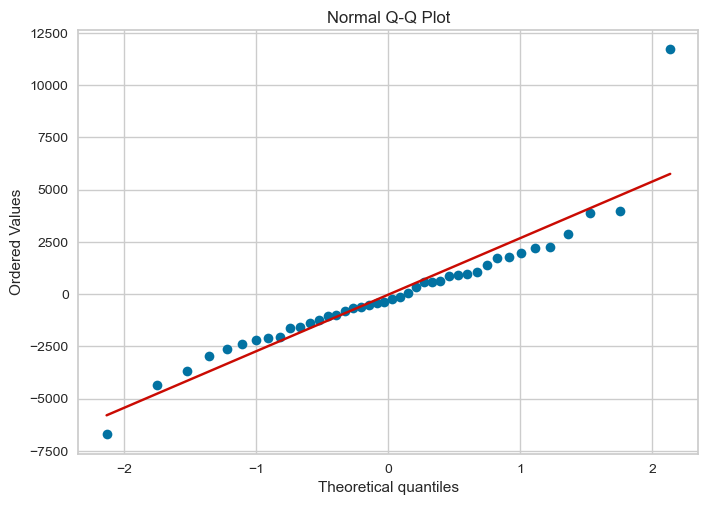


Actual vs Predicted:


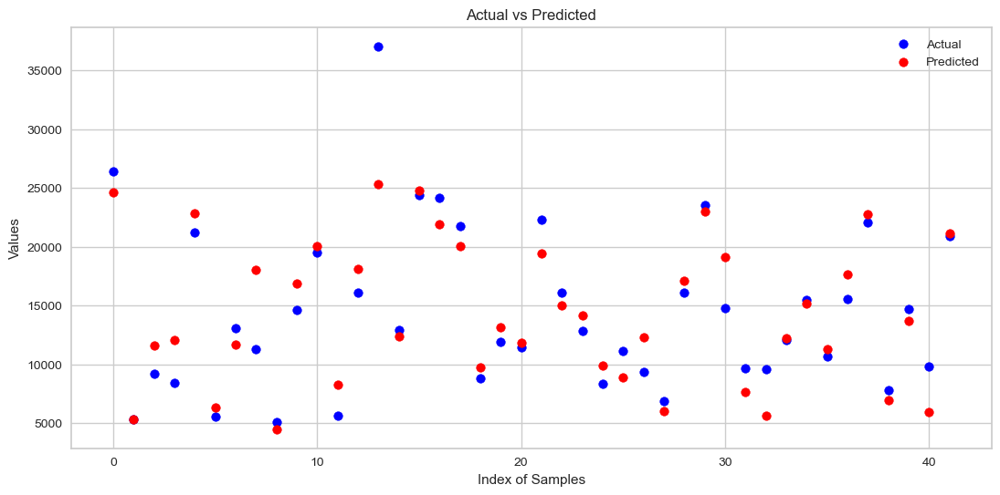

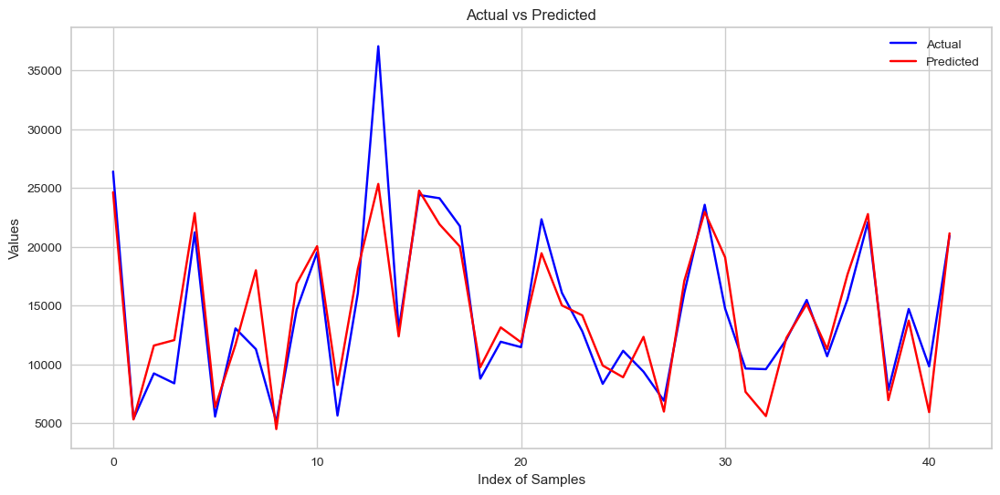

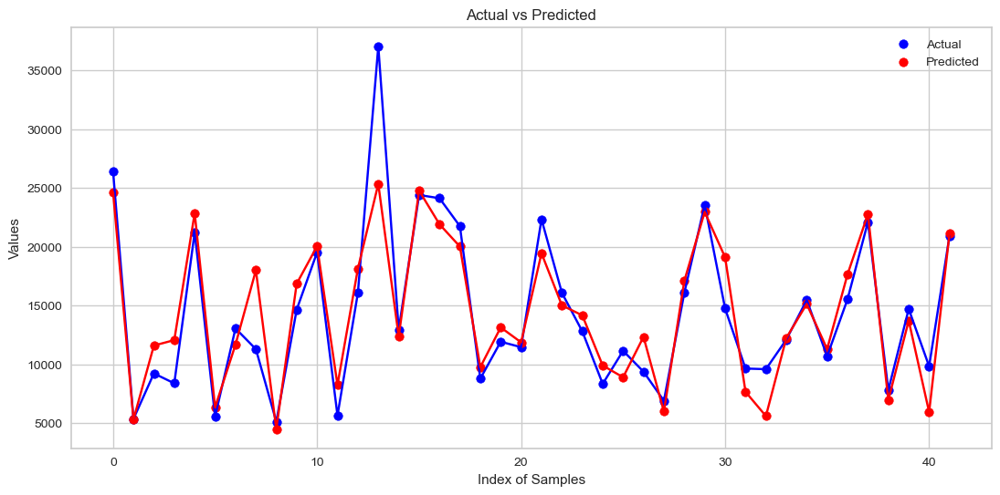


Residuals Scatter Plot:


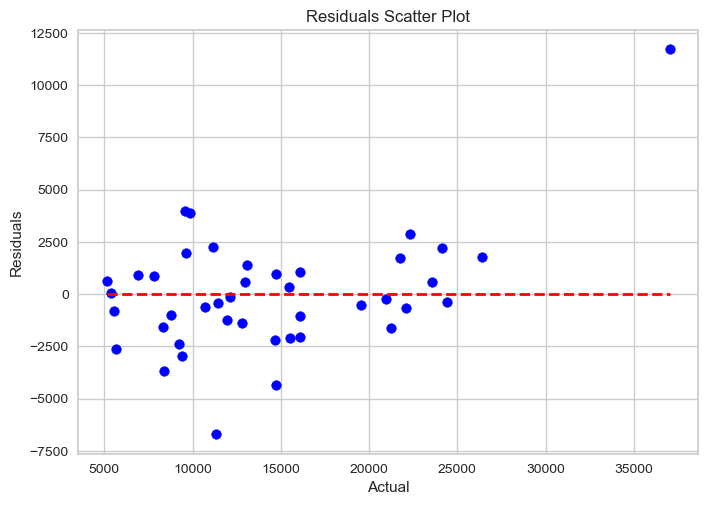


Residuals Histogram:


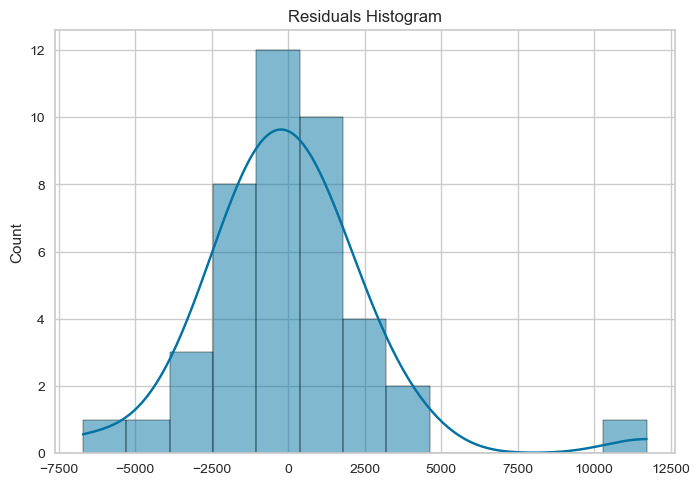

In [75]:
# Assuming dframe1 is your dataframe
X = df_lag_ads.drop(['Value Sales Brand'], axis=1)
y = df_lag_ads['Value Sales Brand']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='Ridge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

Selected features for Ridge: Index(['Weighted Handling Distribution_lag_halo',
       'AVERAGE PROMO PRICE_lag_halo', 'LOCKDOWN_lag_halo',
       'Positive Opinions_lag_halo', 'NUMBER OF INFLUENCERS INVOLVED_lag_halo',
       'GRP TV 20''_lag_halo', 'GRP TV 10''_lag_halo',
       'Sales Value Growth (%)_lag_halo', 'season_Summer_lag_halo',
       'season_Winter_lag_halo', 'promo_lag_halo'],
      dtype='object')
                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.885
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     106.7
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           6.75e-66
Time:                        00:23:49   Log-Likelihood:                -1498.6
No. Observations:                 165   AIC:                             3021.
Df Residuals:                  

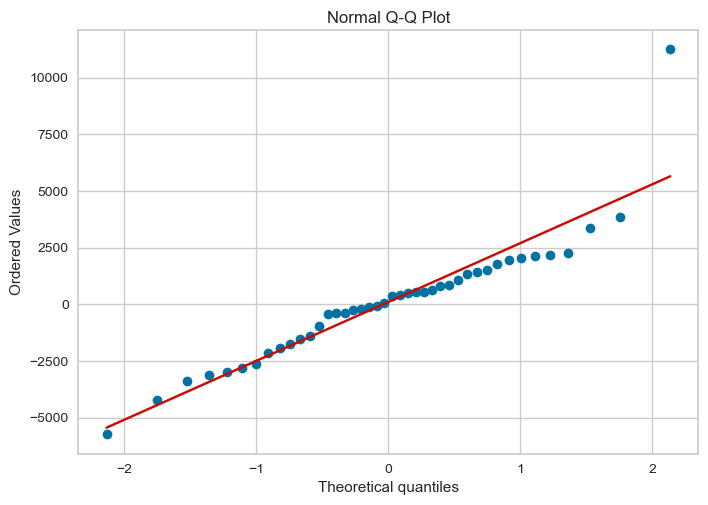


Actual vs Predicted:


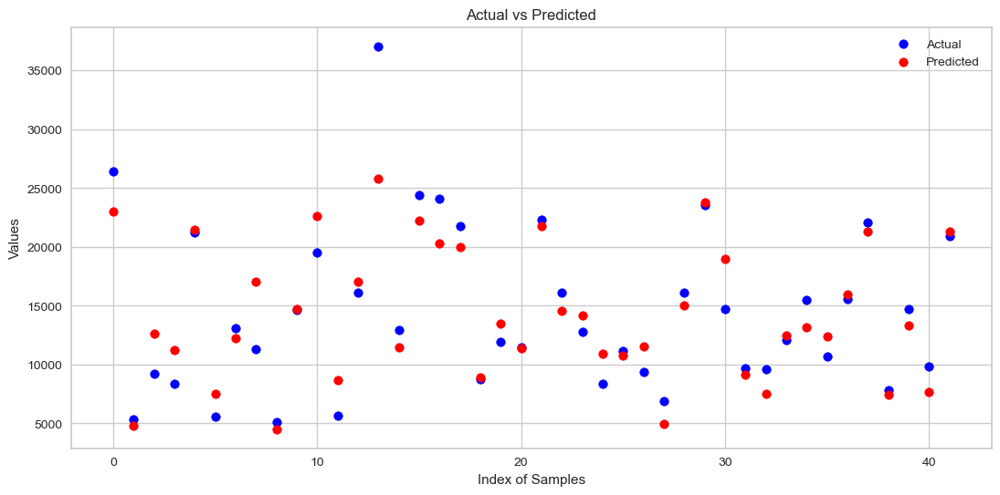

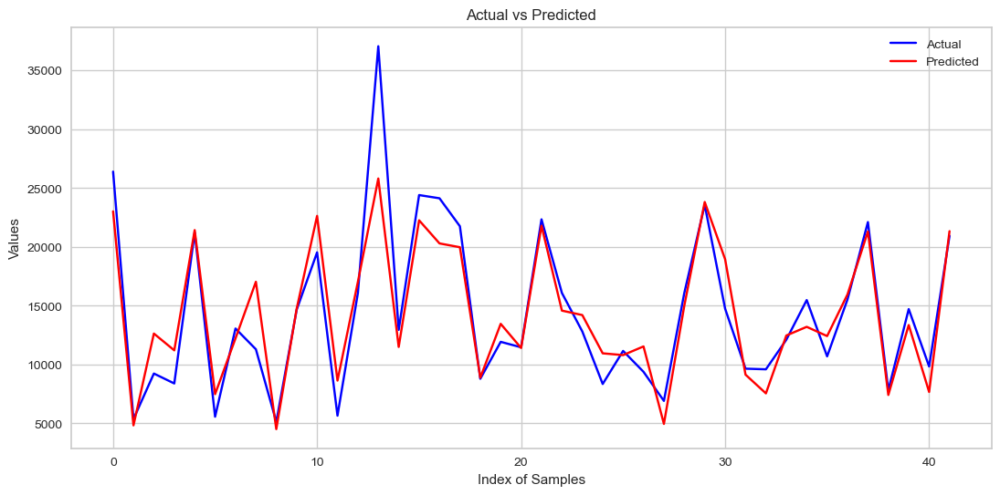

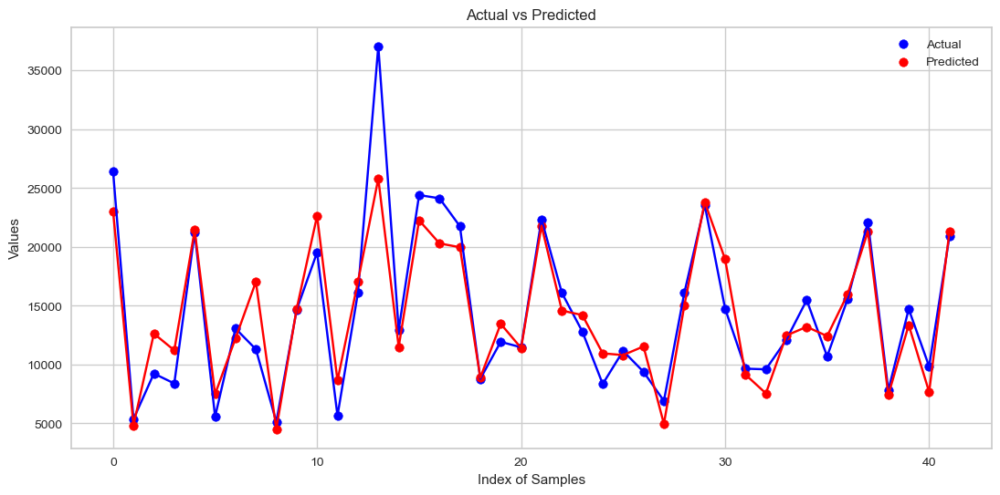


Residuals Scatter Plot:


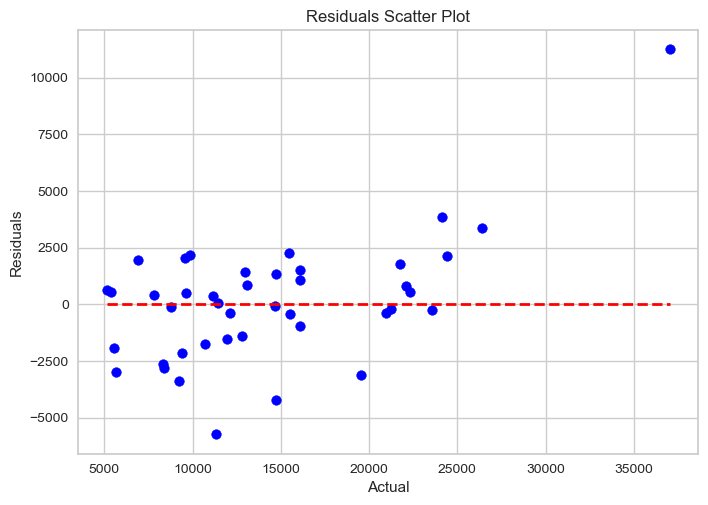


Residuals Histogram:


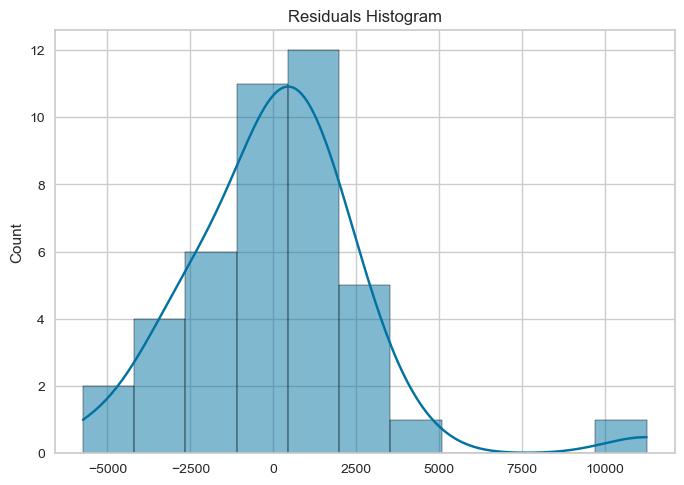

In [76]:
# Assuming dframe1 is your dataframe
X1 = X.drop(['Number of Items_lag_halo',
    'AVERAGE PRICE MKT_lag_halo',
    'SEASONALITY MARKET_lag_halo',
    'DISTRIBUTED SAMPLES (.000)_lag_halo',
    'ONLINE REVIEWS_lag_halo',
    'ONLINE RATINGS_lag_halo',
    'Negative Opinions_lag_halo',
    'digital_investments_lag_halo',
    'competitors_grp_lag_halo',
    'total_editors_lag_halo',
    'total_totem_lag_halo',
    'events_seasonal_lag_halo',
    'season_Spring_lag_halo',
    'INVESTMENTS TV_lag_halo',
    'INVESTMENTS PRINT_lag_halo'], axis=1)
y1 = y

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='Ridge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

Selected features for Ridge: Index(['Weighted Handling Distribution_lag_halo',
       'AVERAGE PROMO PRICE_lag_halo', 'Positive Opinions_lag_halo',
       'NUMBER OF INFLUENCERS INVOLVED_lag_halo', 'GRP TV 20''_lag_halo',
       'GRP TV 10''_lag_halo', 'Sales Value Growth (%)_lag_halo',
       'promo_lag_halo'],
      dtype='object')
                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     145.7
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           2.41e-68
Time:                        00:23:49   Log-Likelihood:                -1500.5
No. Observations:                 165   AIC:                             3019.
Df Residuals:                     156   BIC:                             3047.
Df Model:                       

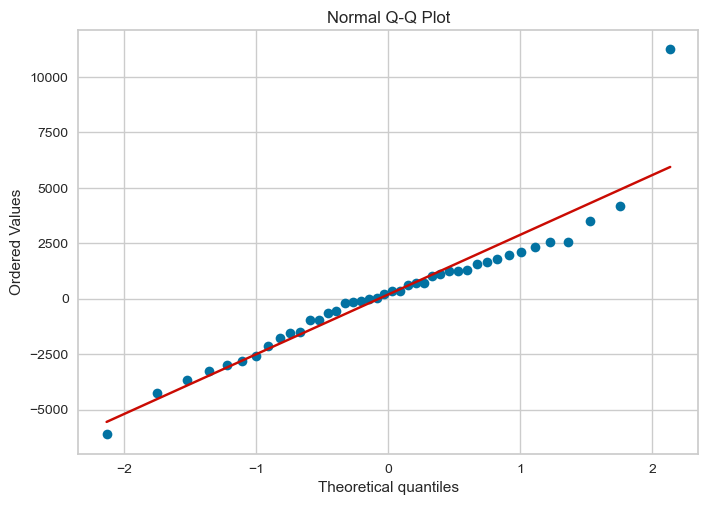


Actual vs Predicted:


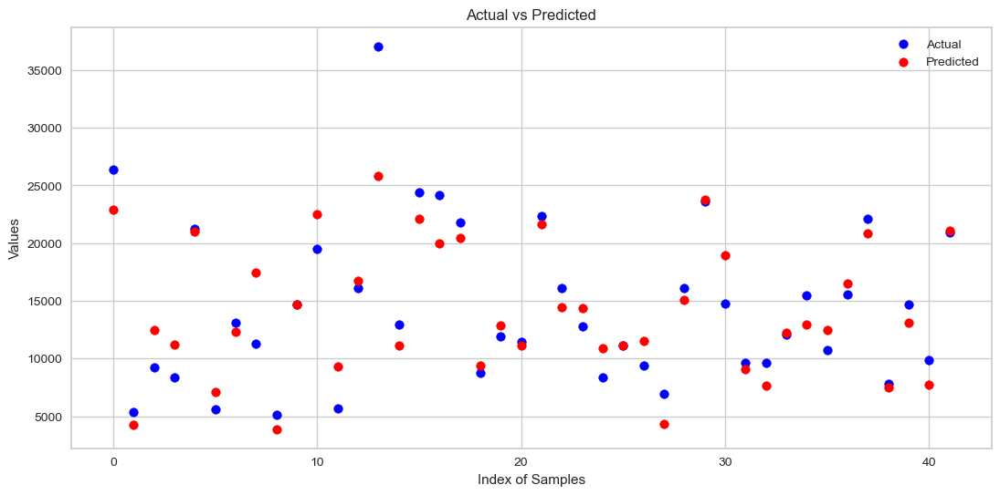

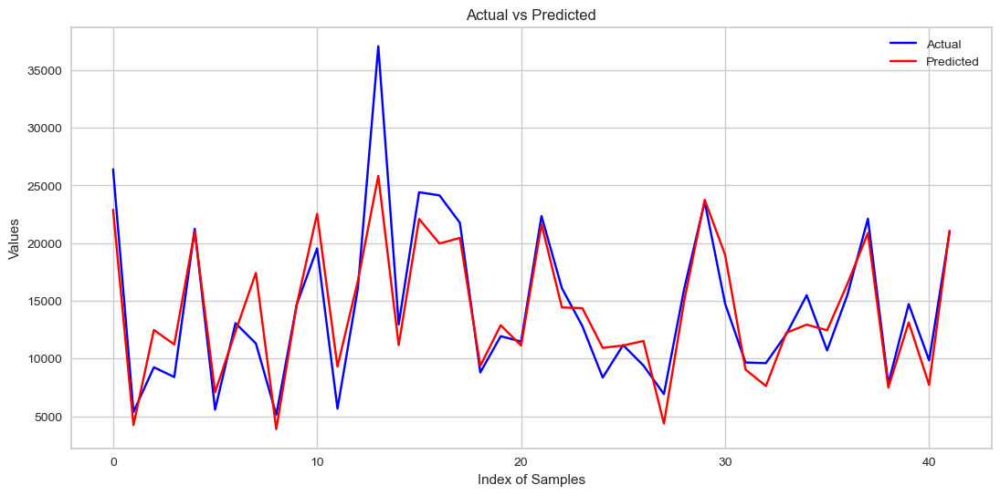

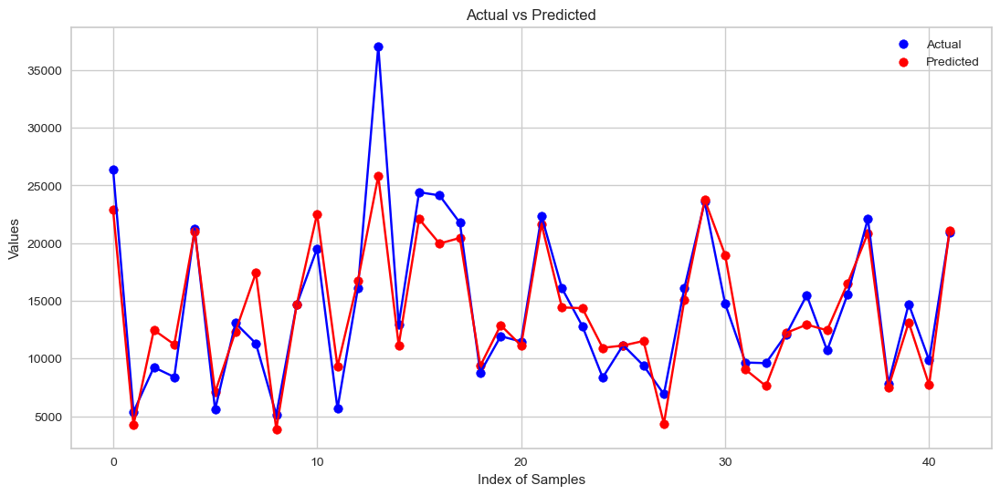


Residuals Scatter Plot:


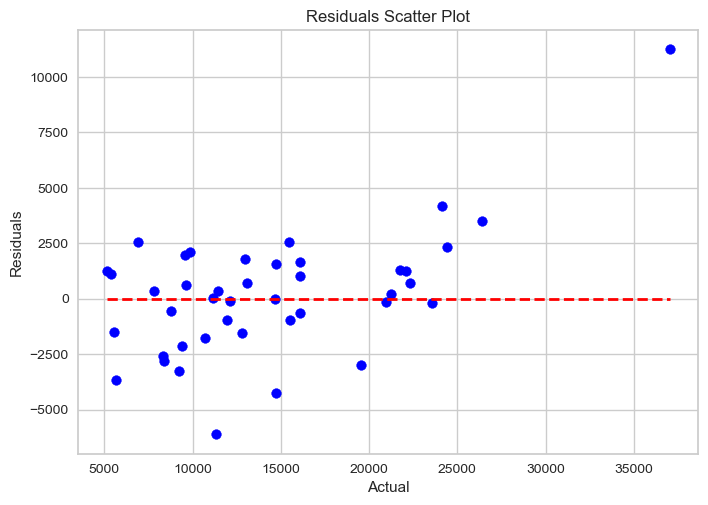


Residuals Histogram:


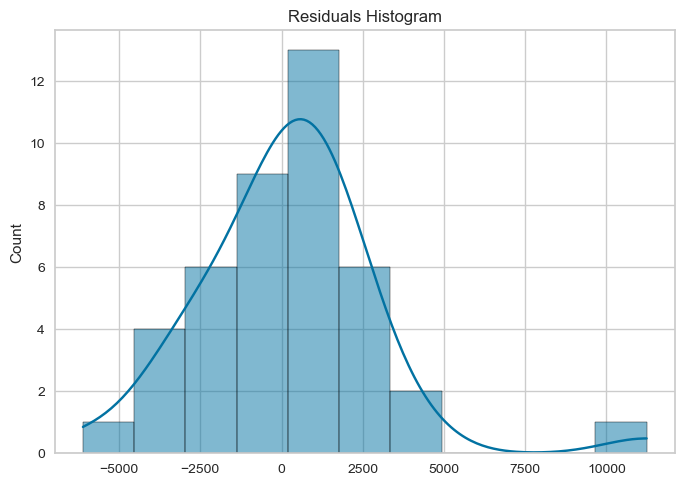

In [77]:
# Assuming dframe1 is your dataframe
X2 = X1.drop(['LOCKDOWN_lag_halo', 'season_Summer_lag_halo', 'season_Winter_lag_halo'], axis=1)
y2 = y1

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='Ridge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

### Lasso

#### lag, adstock

Selected features: Index(['Weighted Handling Distribution_lag_halo', 'Number of Items_lag_halo',
       'AVERAGE PROMO PRICE_lag_halo', 'AVERAGE PRICE MKT_lag_halo',
       'SEASONALITY MARKET_lag_halo', 'LOCKDOWN_lag_halo',
       'DISTRIBUTED SAMPLES (.000)_lag_halo', 'ONLINE REVIEWS_lag_halo',
       'ONLINE RATINGS_lag_halo', 'Positive Opinions_lag_halo',
       'Negative Opinions_lag_halo', 'NUMBER OF INFLUENCERS INVOLVED_lag_halo',
       'GRP TV 20''_lag_halo', 'GRP TV 10''_lag_halo',
       'INVESTMENTS TV_lag_halo', 'INVESTMENTS PRINT_lag_halo',
       'digital_investments_lag_halo', 'competitors_grp_lag_halo',
       'total_editors_lag_halo', 'total_totem_lag_halo',
       'events_seasonal_lag_halo', 'Sales Value Growth (%)_lag_halo',
       'season_Spring_lag_halo', 'season_Summer_lag_halo',
       'season_Winter_lag_halo', 'promo_lag_halo'],
      dtype='object')
                            OLS Regression Results                            
Dep. Variable:      Value Sales B

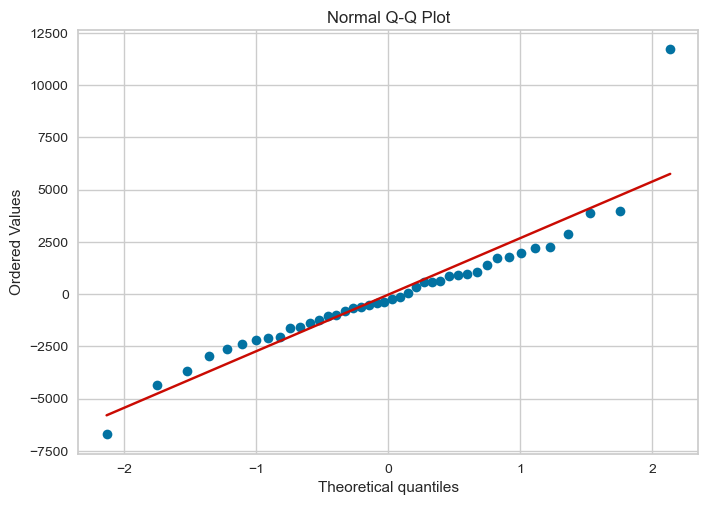


Actual vs Predicted:


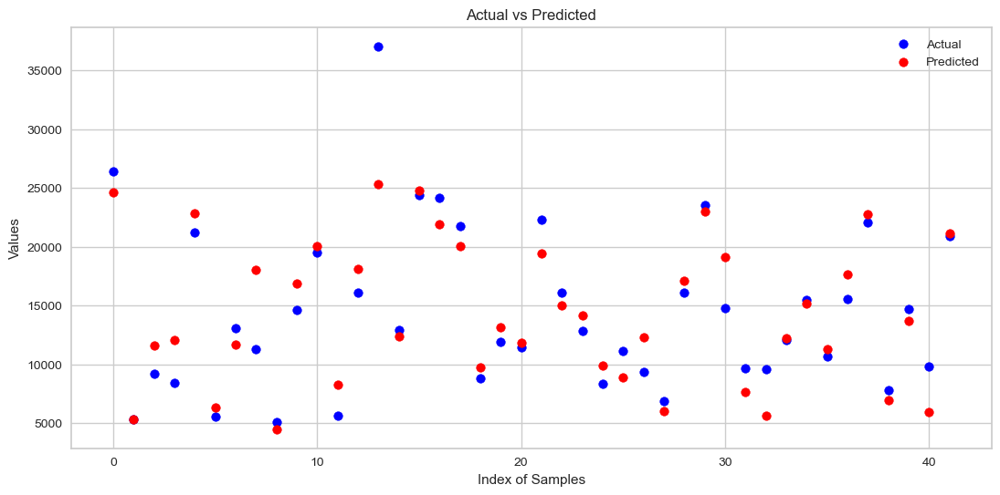

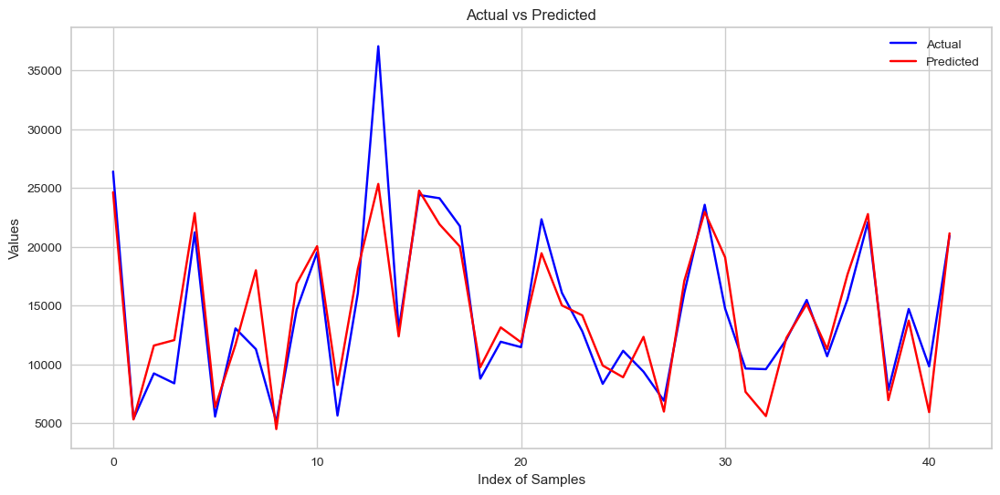

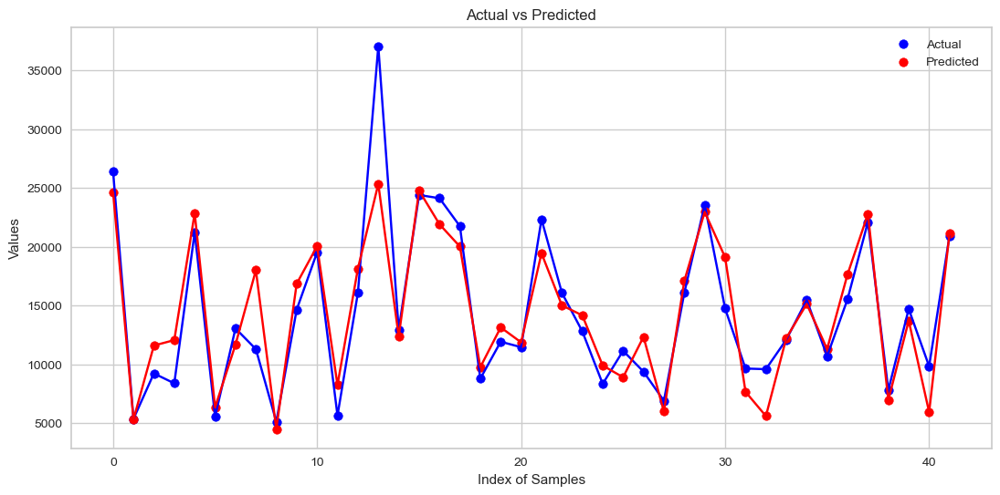


Residuals Scatter Plot:


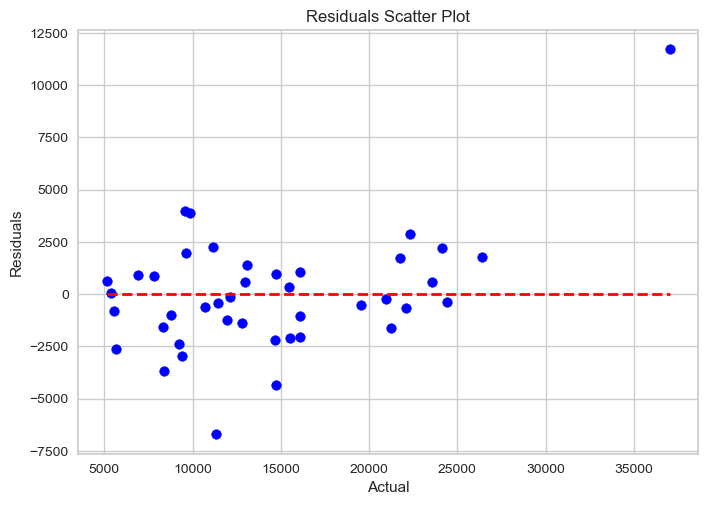


Residuals Histogram:


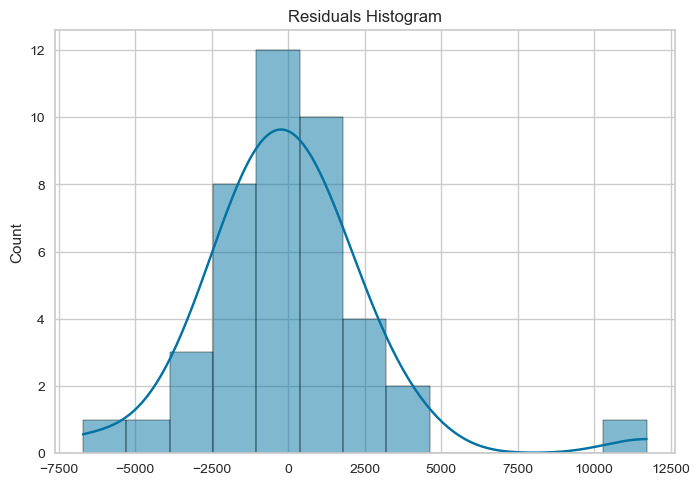

In [90]:
# Assuming dframe1 is your dataframe
X = df_lag_ads.drop(['Value Sales Brand'], axis=1)
y = df_lag_ads['Value Sales Brand']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='Lasso', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

Selected features: Index(['Weighted Handling Distribution_lag_halo',
       'AVERAGE PROMO PRICE_lag_halo', 'LOCKDOWN_lag_halo',
       'Positive Opinions_lag_halo', 'NUMBER OF INFLUENCERS INVOLVED_lag_halo',
       'GRP TV 20''_lag_halo', 'GRP TV 10''_lag_halo',
       'INVESTMENTS PRINT_lag_halo', 'Sales Value Growth (%)_lag_halo',
       'season_Summer_lag_halo', 'season_Winter_lag_halo', 'promo_lag_halo'],
      dtype='object')
                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.889
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     101.6
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           3.49e-66
Time:                        00:23:54   Log-Likelihood:                -1495.3
No. Observations:                 165   AIC:                             3017.
Df Residual

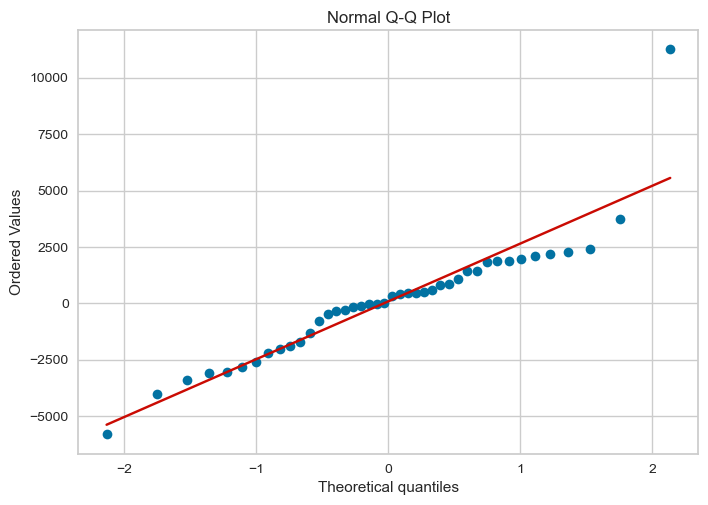


Actual vs Predicted:


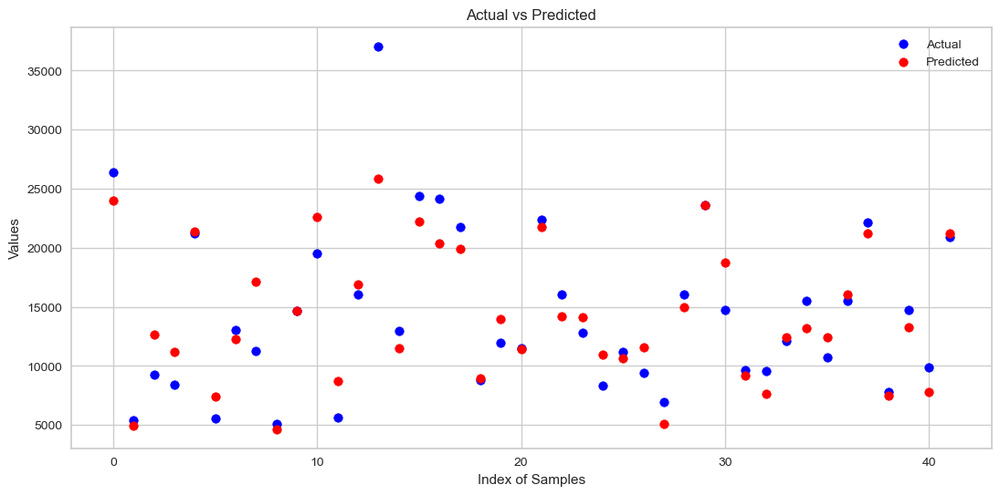

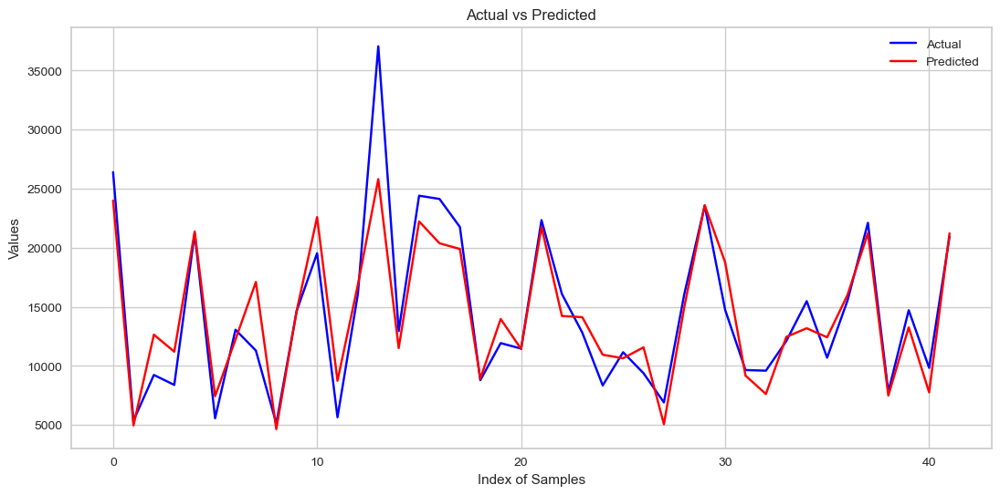

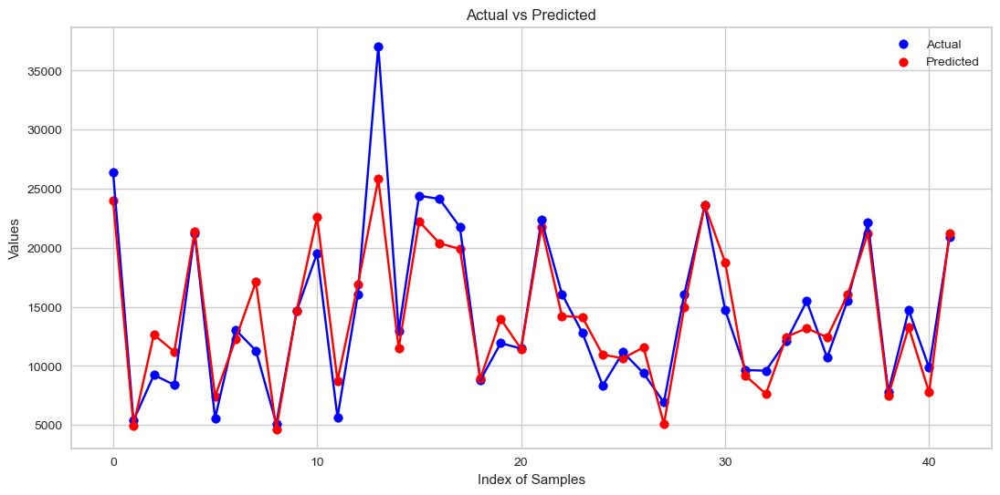


Residuals Scatter Plot:


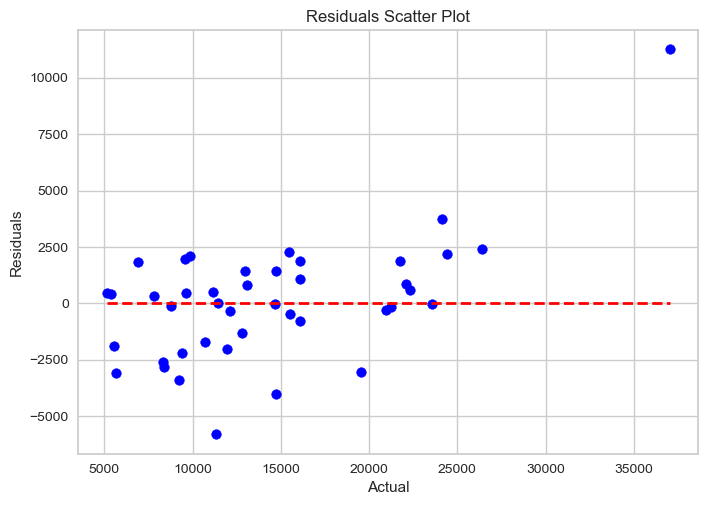


Residuals Histogram:


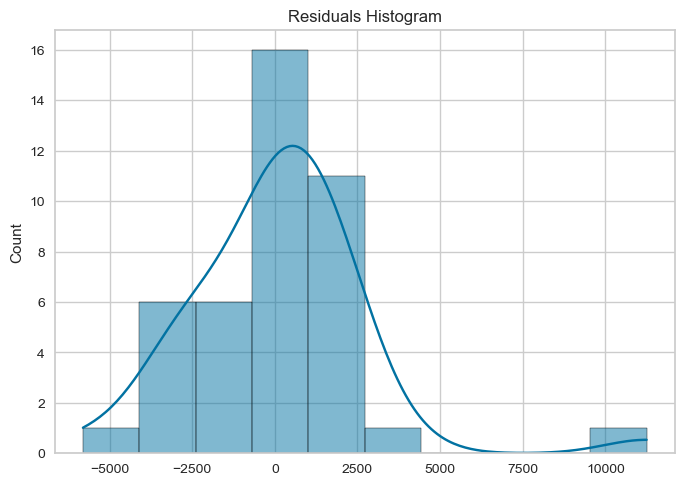

In [91]:
# Assuming dframe1 is your dataframe
X1 = X.drop(['Number of Items_lag_halo',
    'AVERAGE PRICE MKT_lag_halo',
    'SEASONALITY MARKET_lag_halo',
    'DISTRIBUTED SAMPLES (.000)_lag_halo',
    'ONLINE REVIEWS_lag_halo',
    'ONLINE RATINGS_lag_halo',
    'Negative Opinions_lag_halo',
    'digital_investments_lag_halo',
    'competitors_grp_lag_halo',
    'total_editors_lag_halo',
    'total_totem_lag_halo',
    'events_seasonal_lag_halo',
    'season_Spring_lag_halo',
    'INVESTMENTS TV_lag_halo'], axis=1)
y1 = y

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='Lasso', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

Selected features: Index(['Weighted Handling Distribution_lag_halo',
       'AVERAGE PROMO PRICE_lag_halo', 'Positive Opinions_lag_halo',
       'NUMBER OF INFLUENCERS INVOLVED_lag_halo', 'GRP TV 20''_lag_halo',
       'GRP TV 10''_lag_halo', 'INVESTMENTS PRINT_lag_halo',
       'Sales Value Growth (%)_lag_halo', 'promo_lag_halo'],
      dtype='object')
                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.887
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     134.9
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.22e-68
Time:                        00:23:55   Log-Likelihood:                -1497.1
No. Observations:                 165   AIC:                             3014.
Df Residuals:                     155   BIC:                             3045.
Df Model:   

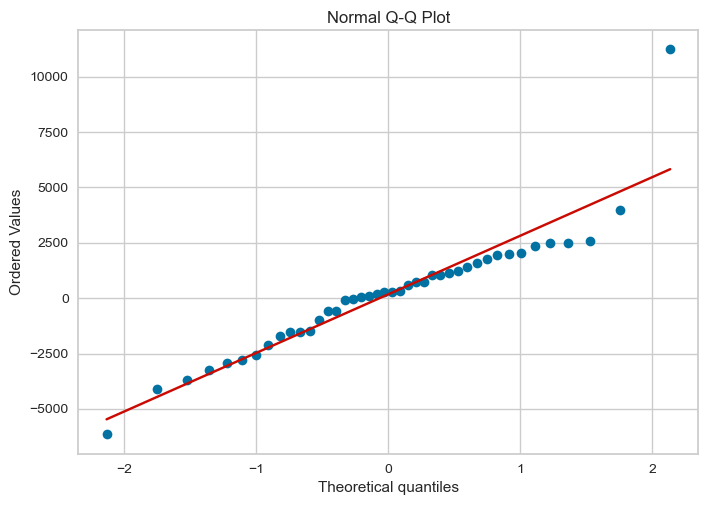


Actual vs Predicted:


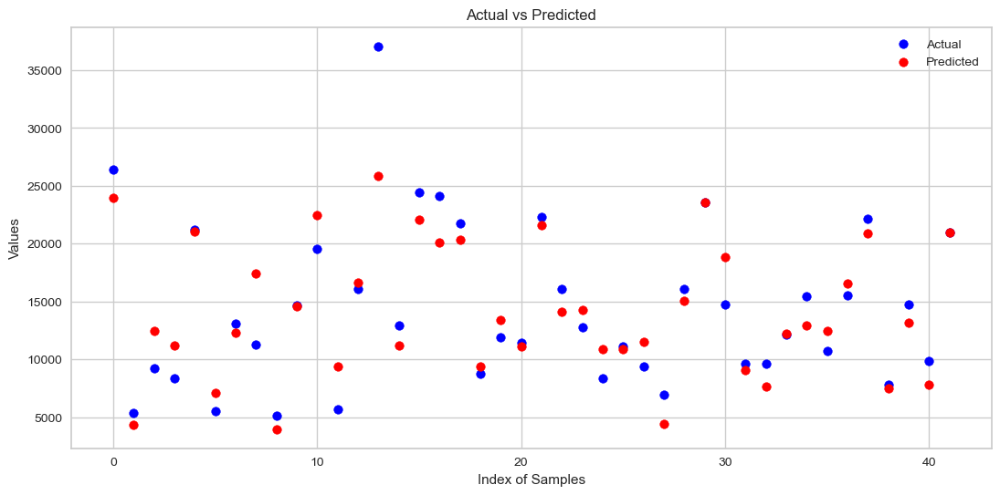

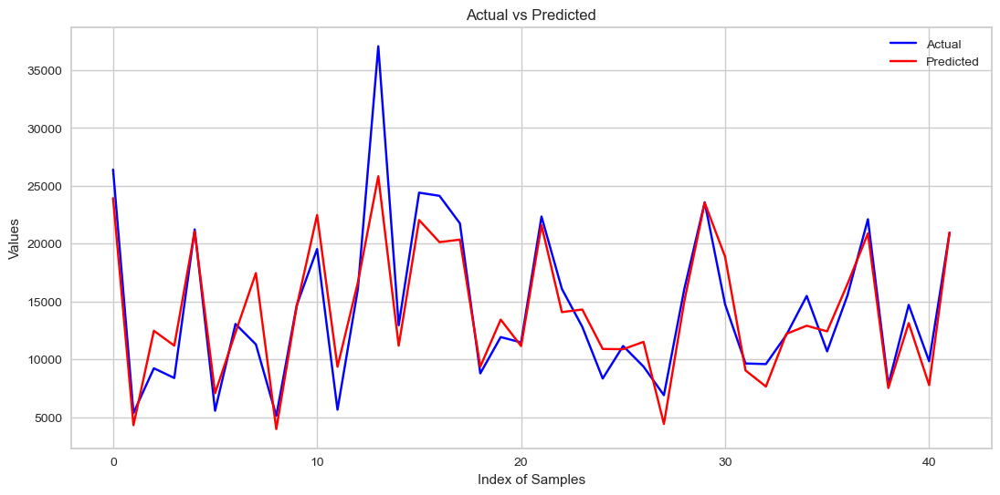

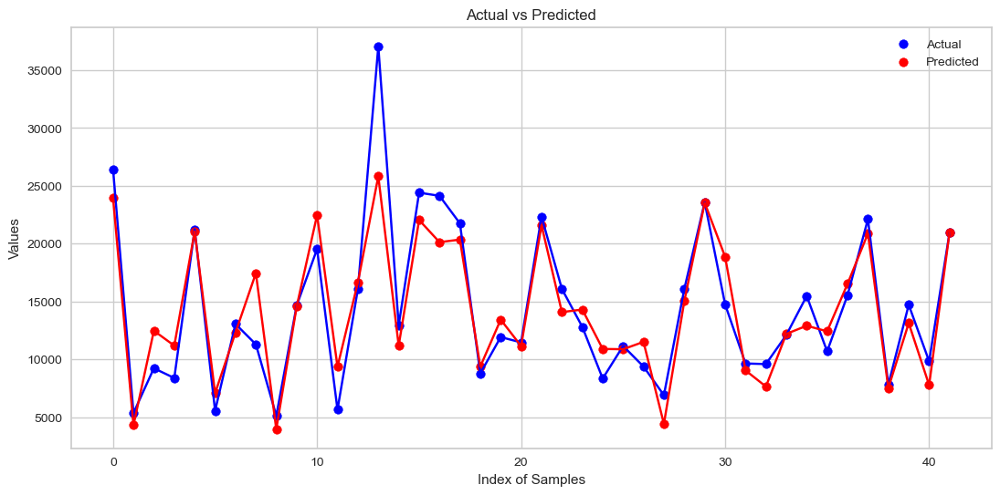


Residuals Scatter Plot:


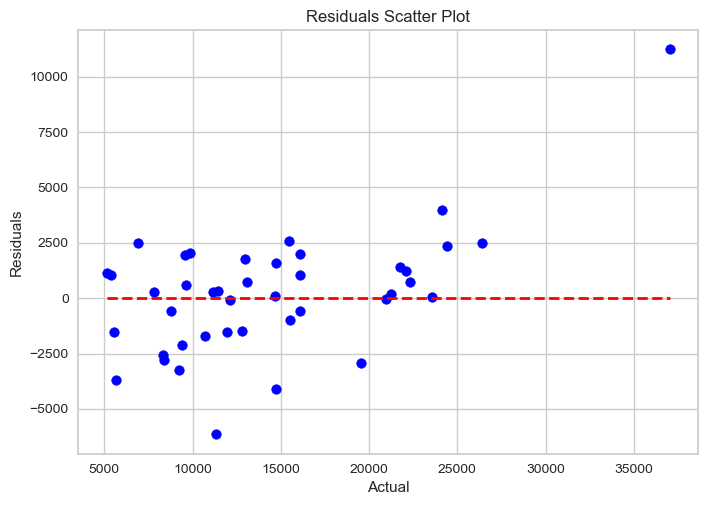


Residuals Histogram:


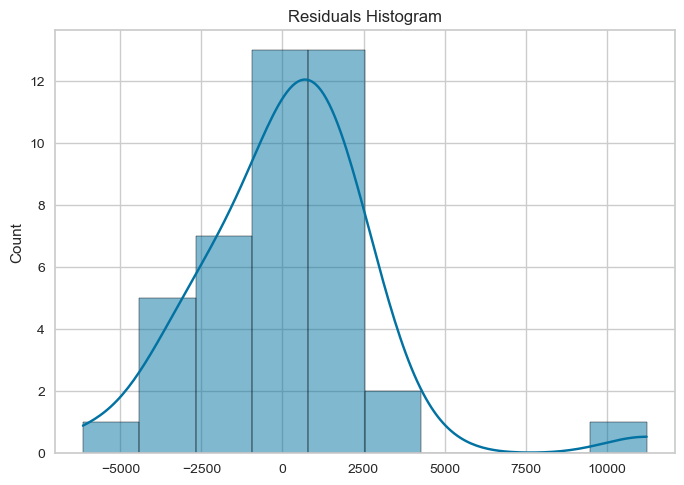

In [92]:
# Assuming dframe1 is your dataframe
X2 = X1.drop(['LOCKDOWN_lag_halo', 'season_Summer_lag_halo', 'season_Winter_lag_halo'], axis=1)
y2 = y1

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='Lasso', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

In [526]:
column_pairs = [
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPR. TIKTOK"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPRESSIONS SOCIAL META"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPRESSIONS SOCIAL META", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPRESSIONS YOUTUBE", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"]
]
# Creating new interaction columns
for pair in column_pairs:
    col1, col2 = pair
    new_col_name = f"{col1} * {col2}"
    X4[new_col_name] = impressions[col1] * impressions[col2]

# Display the DataFrame with new interaction columns
print(X4.head())

   Weighted Handling Distribution  AVERAGE PROMO PRICE  LOCKDOWN  \
0                        0.498359             9.941495       0.0   
1                        0.498359             9.941495       0.0   
2                        0.519654             9.941495       0.0   
3                        0.542164             9.941495       0.0   
4                        0.543184             9.941495       0.0   

   Positive Opinions  digital_impressions  Sales Value Growth (%)  \
0                2.0         6.248658e+06                0.000000   
1               15.0         5.505160e+06               -2.403710   
2               22.0         4.919207e+06               -1.932465   
3               16.0         4.465259e+06                5.597509   
4               24.0         5.403289e+06               -3.168608   

   season_Winter        promo  \
0              1   903.954730   
1              1   883.070937   
2              1   848.388721   
3              1   903.954730   
4          

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.941
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     185.8
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           3.42e-86
Time:                        00:28:06   Log-Likelihood:                -1455.9
No. Observations:                 166   AIC:                             2940.
Df Residuals:                     152   BIC:                             2983.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                                                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

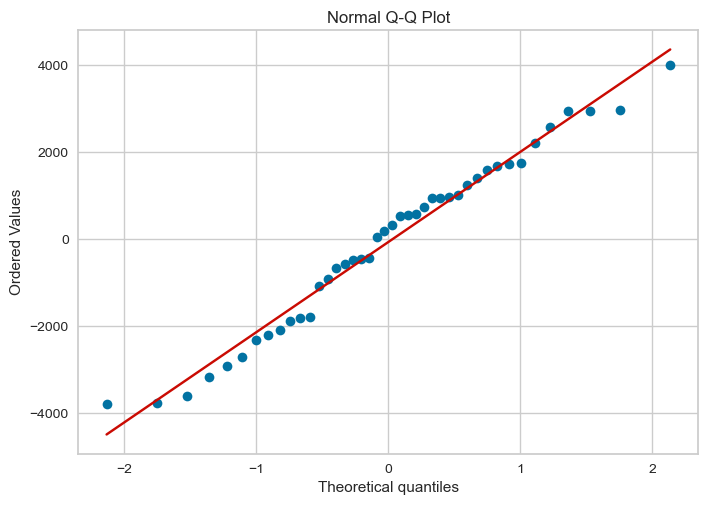


Actual vs Predicted:


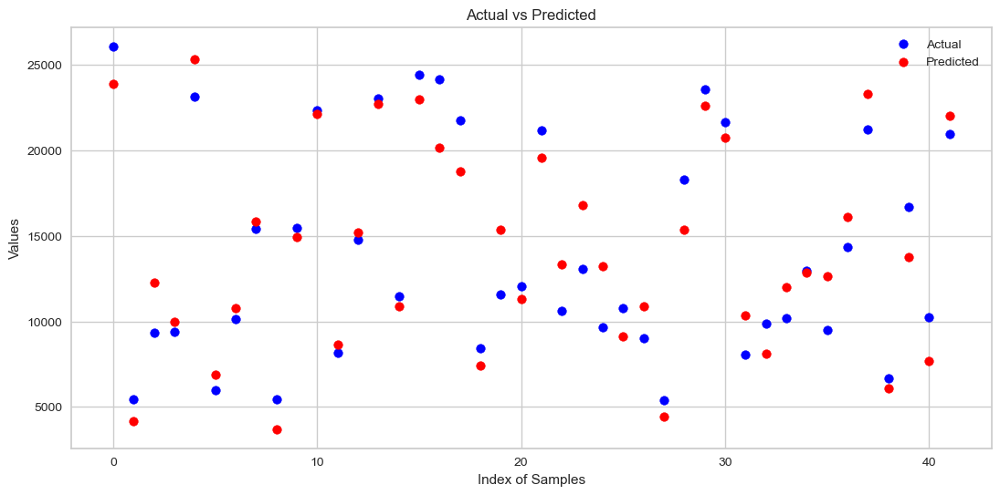

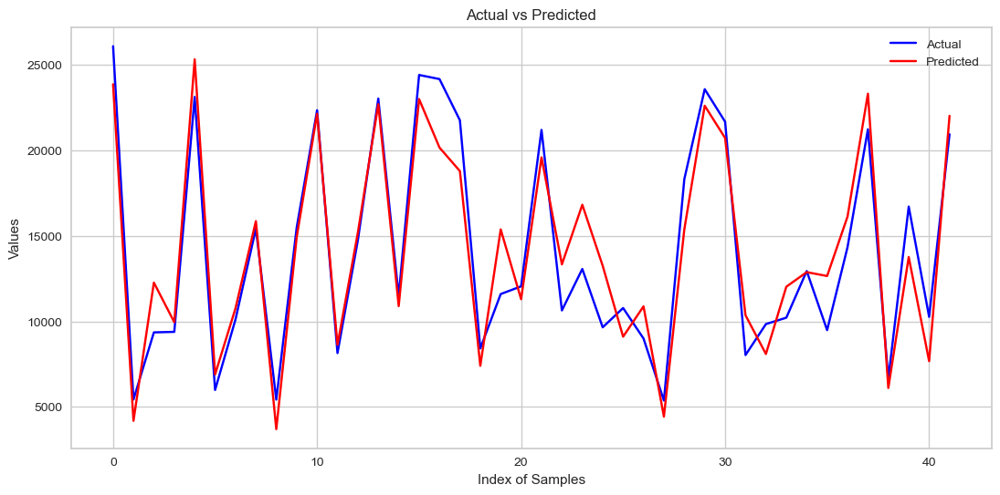

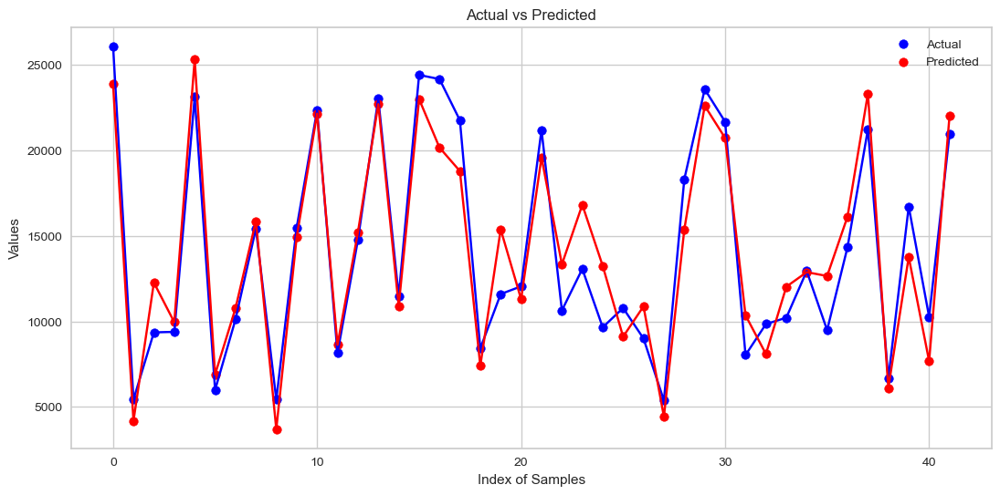


Residuals Scatter Plot:


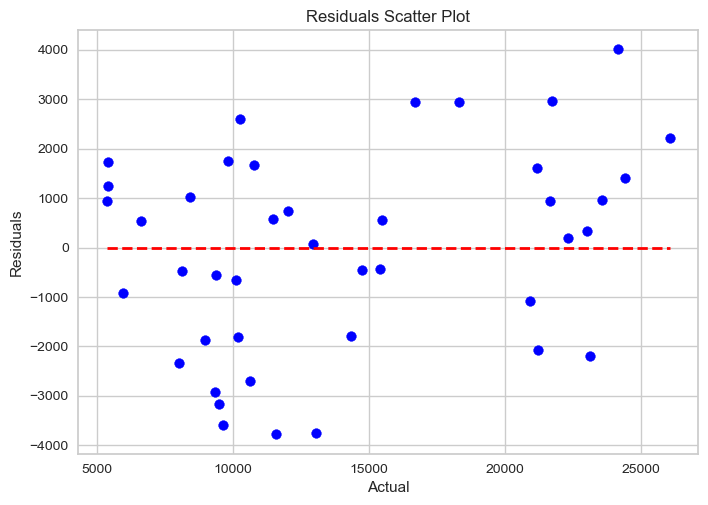


Residuals Histogram:


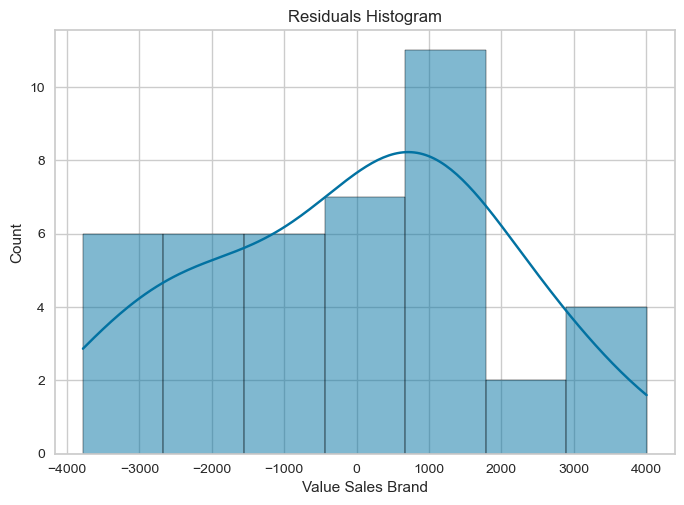

In [527]:
# Assuming dframe1 is your dataframe
X4
y4

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X4, y4, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.861
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     33.20
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           3.12e-47
Time:                        00:28:07   Log-Likelihood:                -1526.6
No. Observations:                 166   AIC:                             3107.
Df Residuals:                     139   BIC:                             3191.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

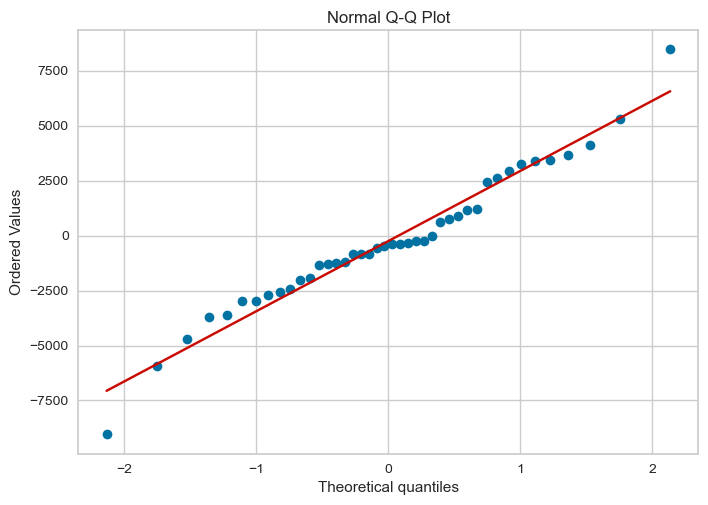


Actual vs Predicted:


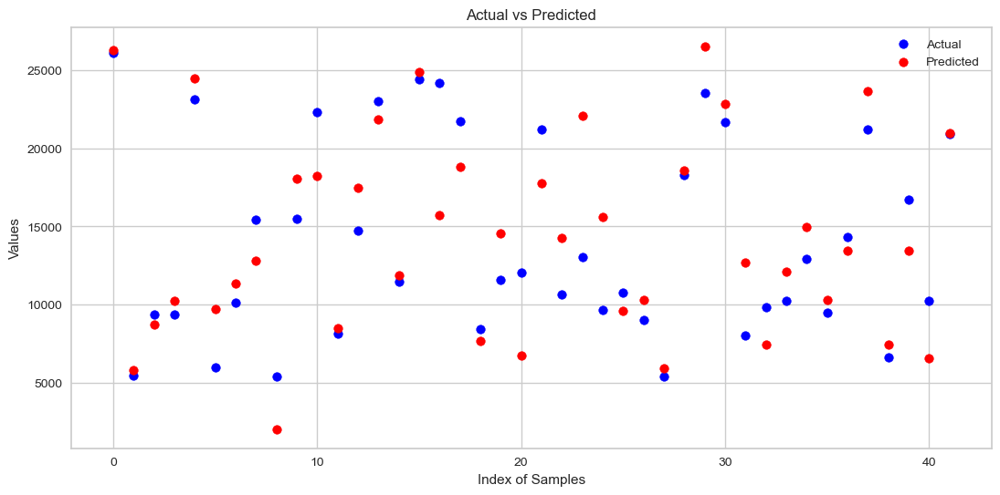

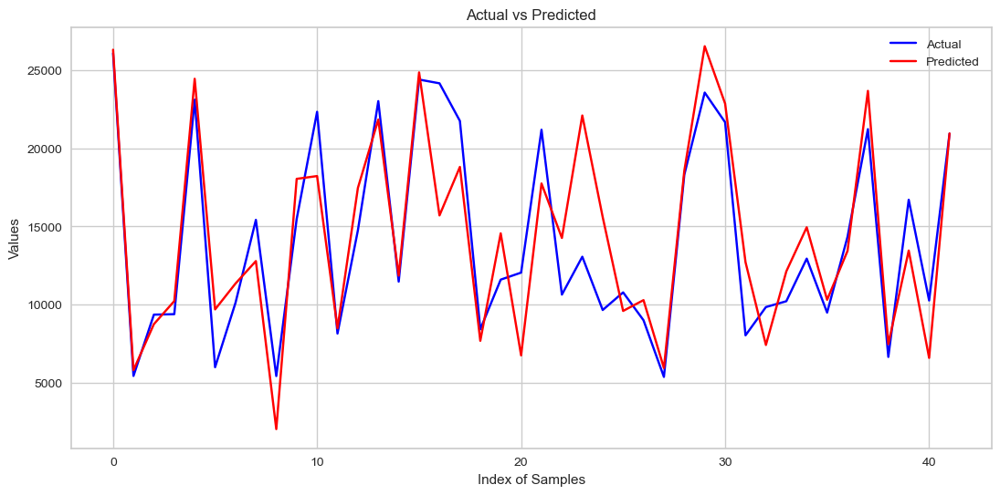

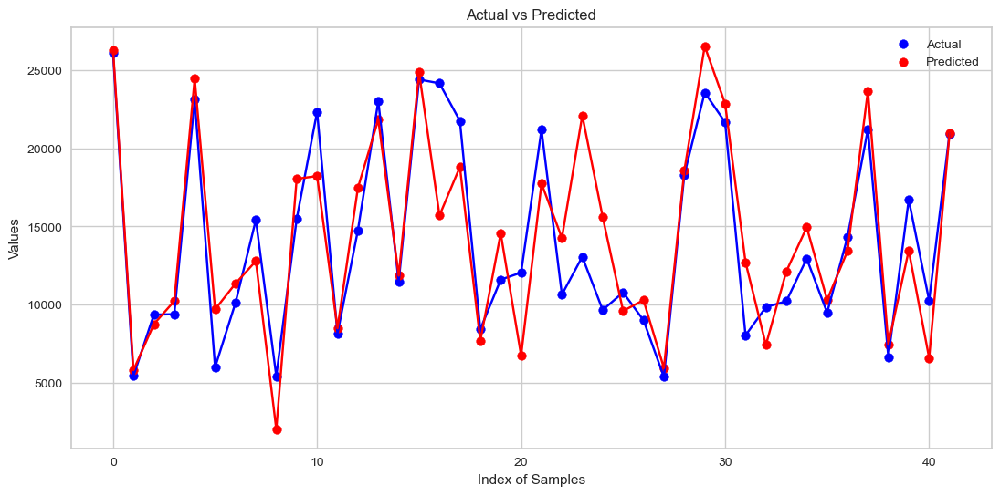


Residuals Scatter Plot:


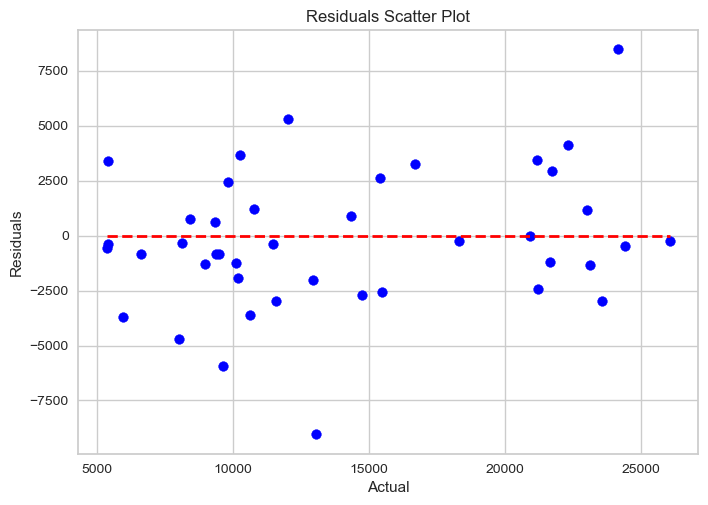


Residuals Histogram:


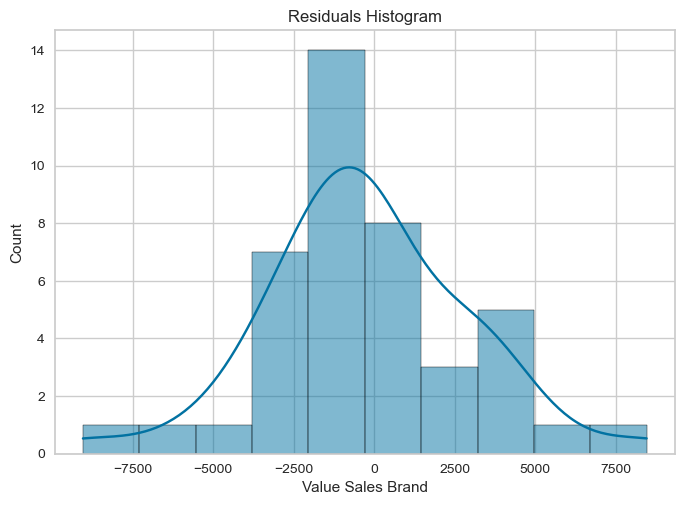

In [529]:
# Assuming dframe1 is your dataframe
X_copy = final_df.drop(['Value Sales Brand'], axis=1)
y_copy = final_df['Value Sales Brand']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_copy, y_copy
                                                    , test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     44.12
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.60e-51
Time:                        00:28:07   Log-Likelihood:                -1528.1
No. Observations:                 166   AIC:                             3098.
Df Residuals:                     145   BIC:                             3163.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

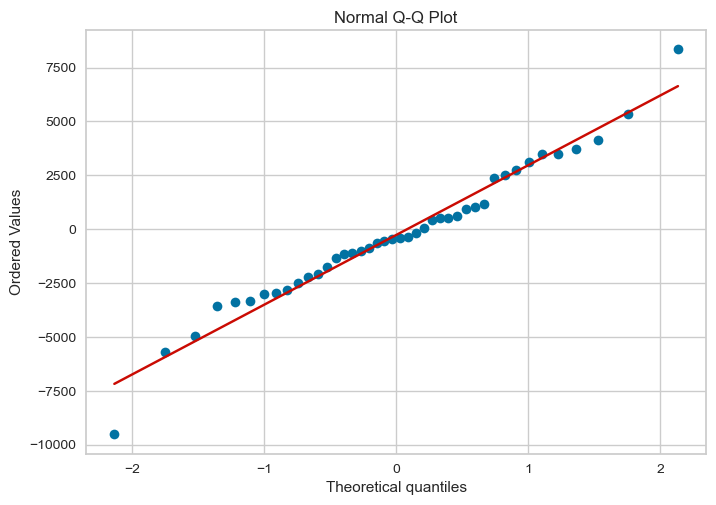


Actual vs Predicted:


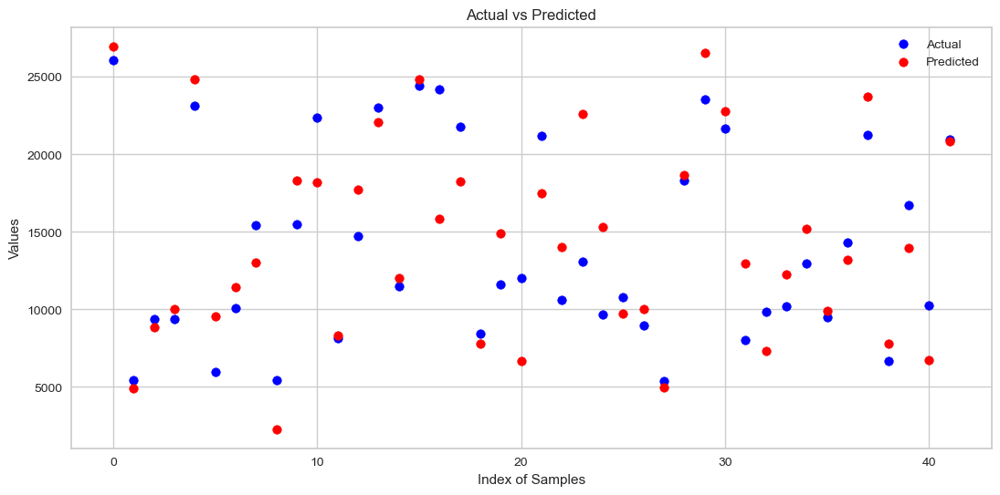

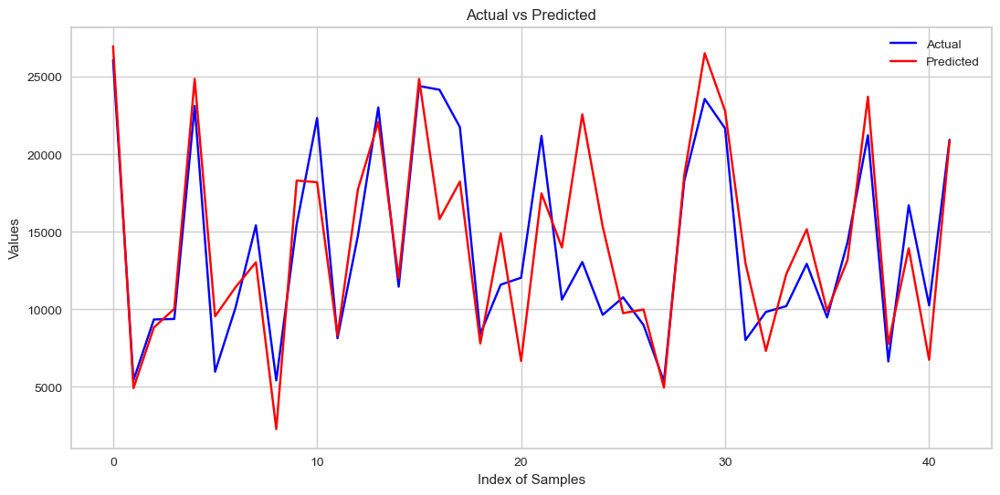

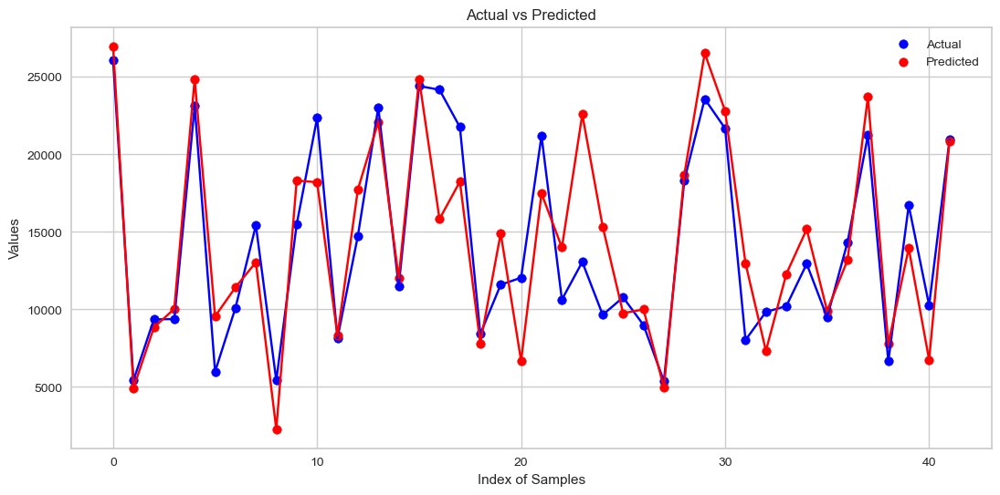


Residuals Scatter Plot:


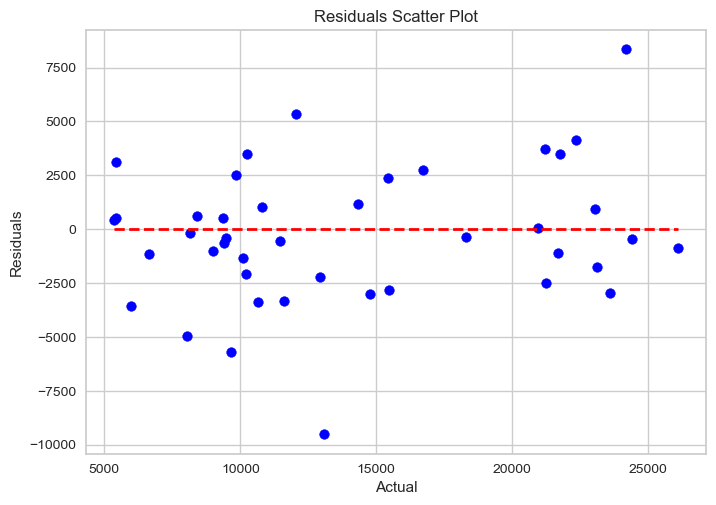


Residuals Histogram:


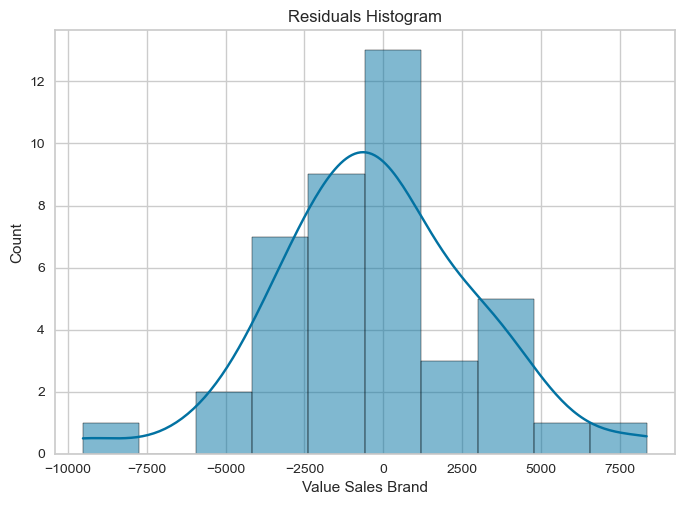

In [530]:
# Assuming dframe1 is your dataframe
X1_copy = X_copy.drop(['Number of Items', 'AVERAGE PRICE MKT', 'competitors_grp', 'total_editors', 'DISTRIBUTED SAMPLES (.000)', 'events_seasonal'], axis=1)
y1_copy = y_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X1_copy, y1_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.836
Method:                 Least Squares   F-statistic:                     61.12
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           8.04e-55
Time:                        00:28:08   Log-Likelihood:                -1533.1
No. Observations:                 166   AIC:                             3096.
Df Residuals:                     151   BIC:                             3143.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

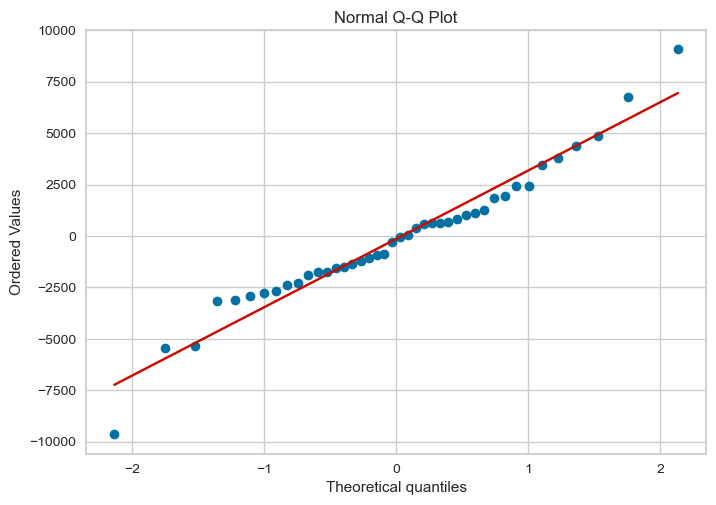


Actual vs Predicted:


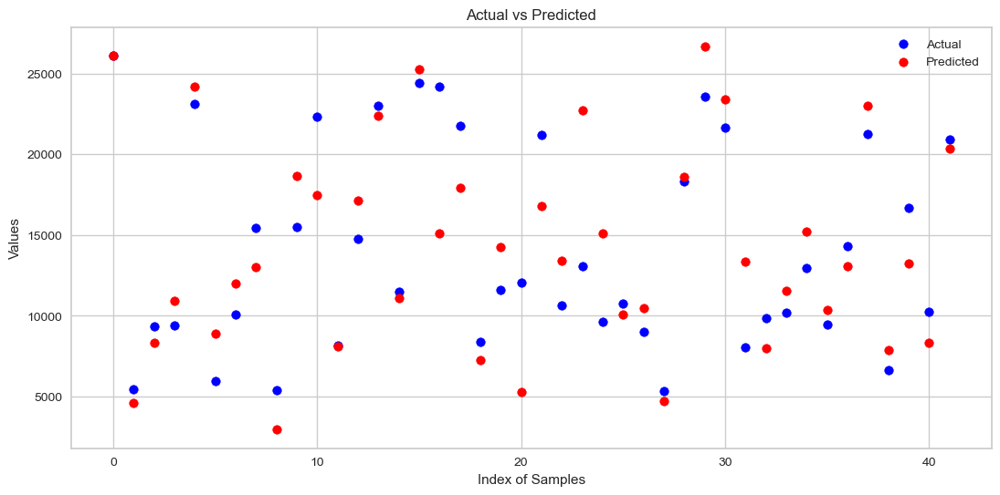

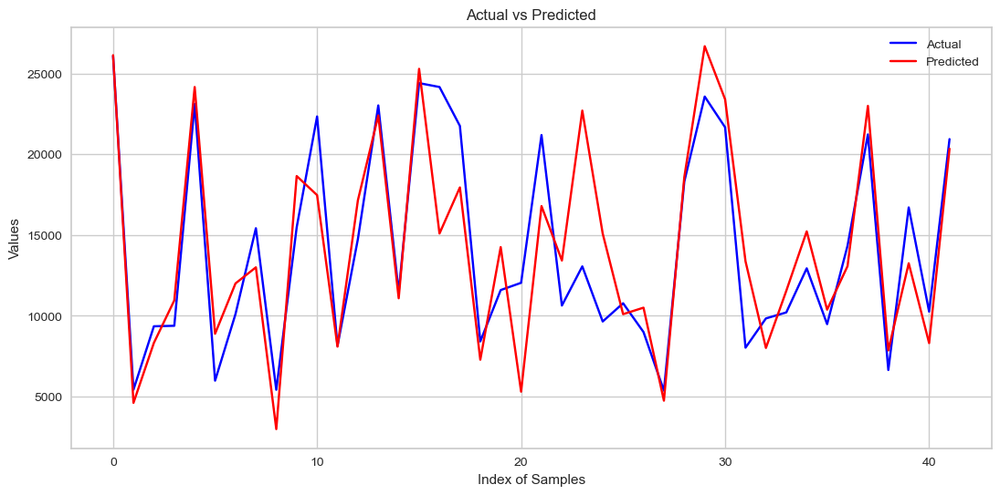

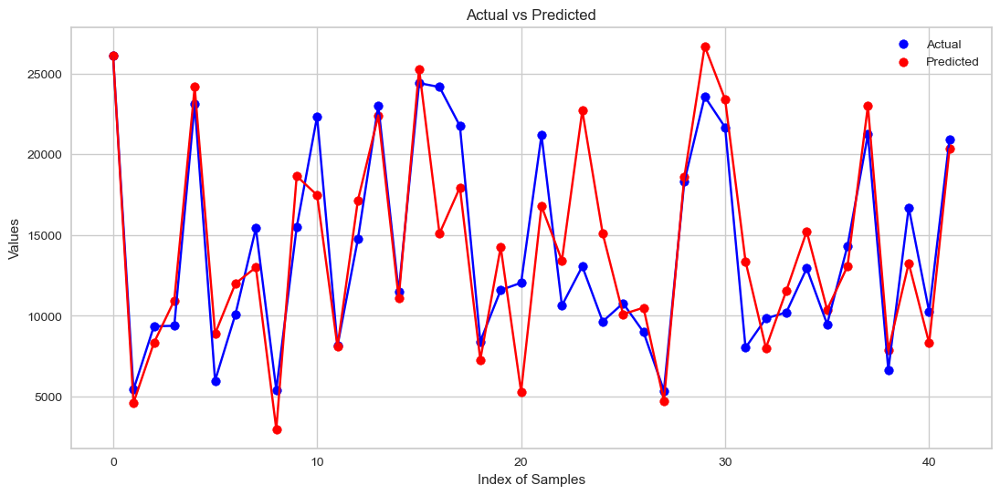


Residuals Scatter Plot:


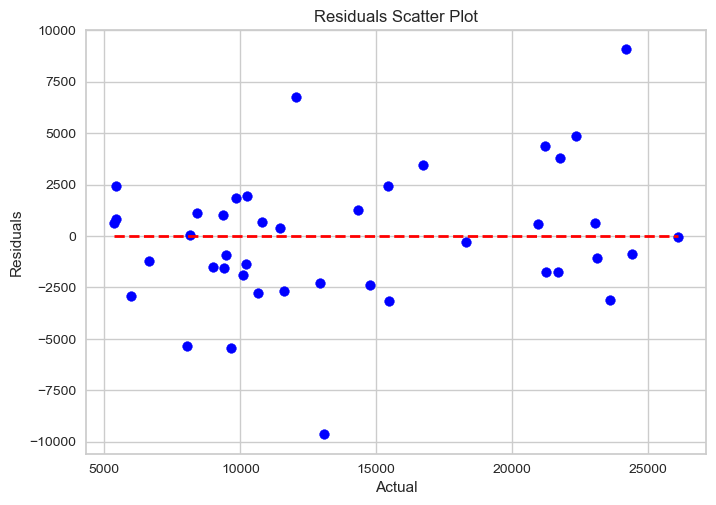


Residuals Histogram:


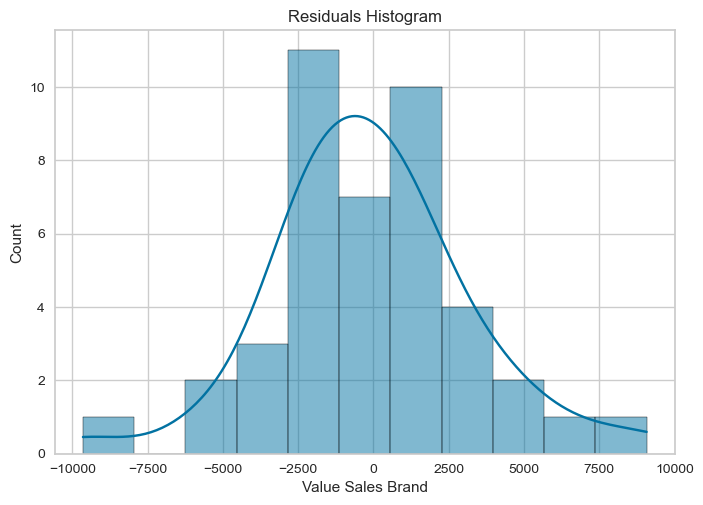

In [531]:
# Assuming dframe1 is your dataframe
X2_copy = X1_copy.drop(['SEASONALITY MARKET', 'total_totem', 'Positive Opinions', 'season_Spring', 
              'Weighted Handling Distribution_lag_halo', 'LOCKDOWN_log_lag_halo'], axis=1)
y2_copy = y1_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X2_copy, y2_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     76.40
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.39e-56
Time:                        00:28:09   Log-Likelihood:                -1535.8
No. Observations:                 166   AIC:                             3096.
Df Residuals:                     154   BIC:                             3133.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

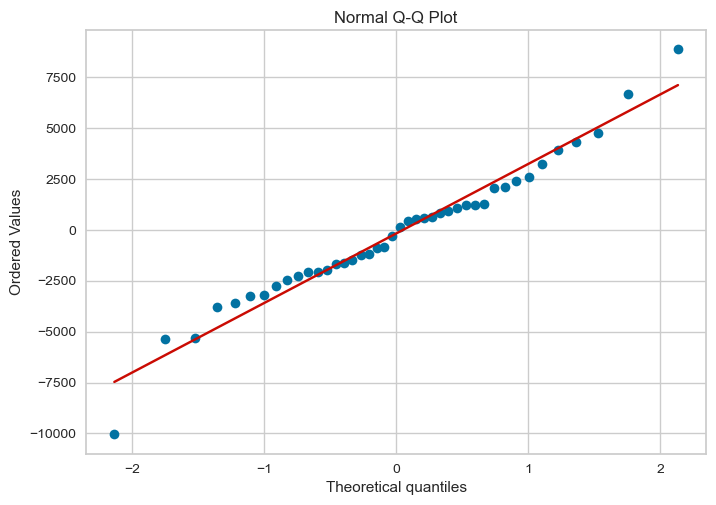


Actual vs Predicted:


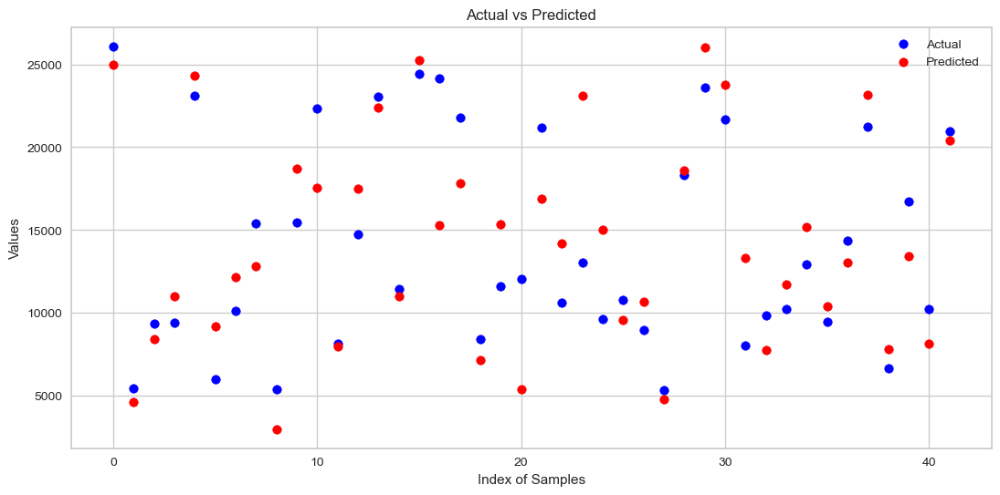

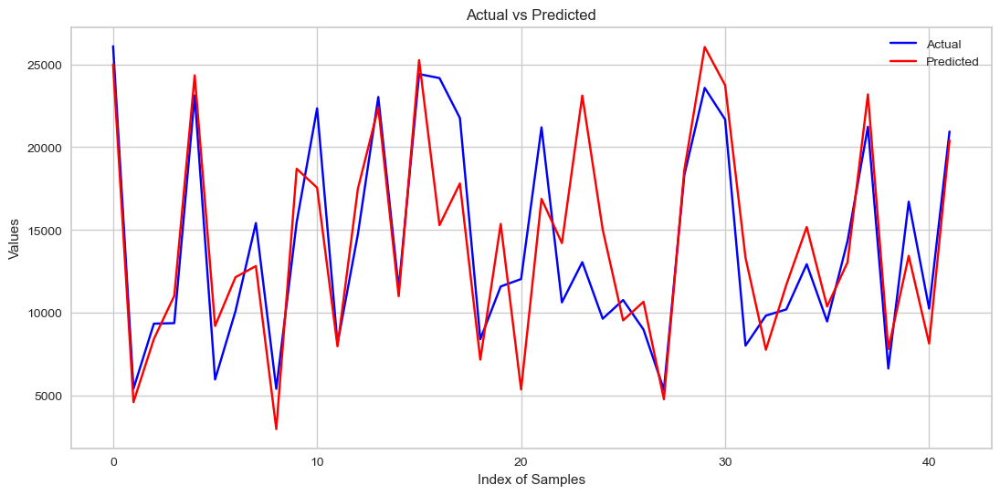

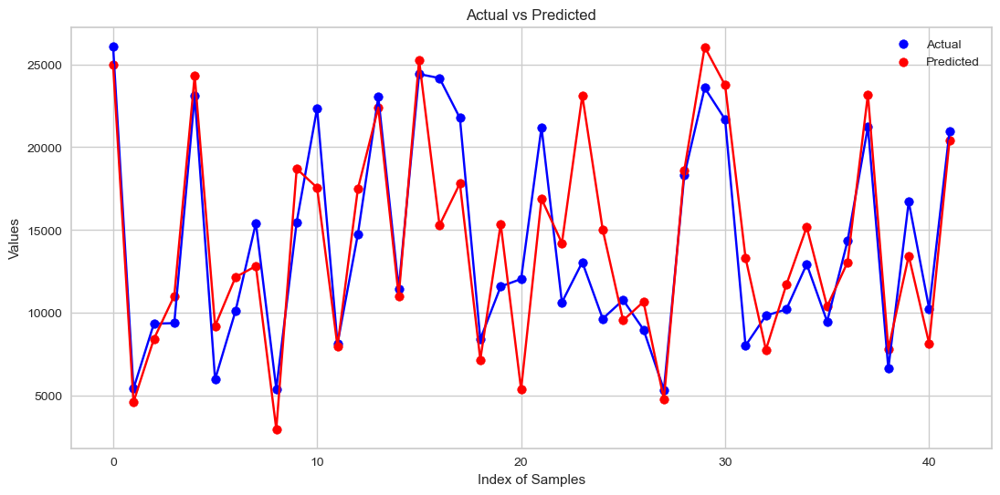


Residuals Scatter Plot:


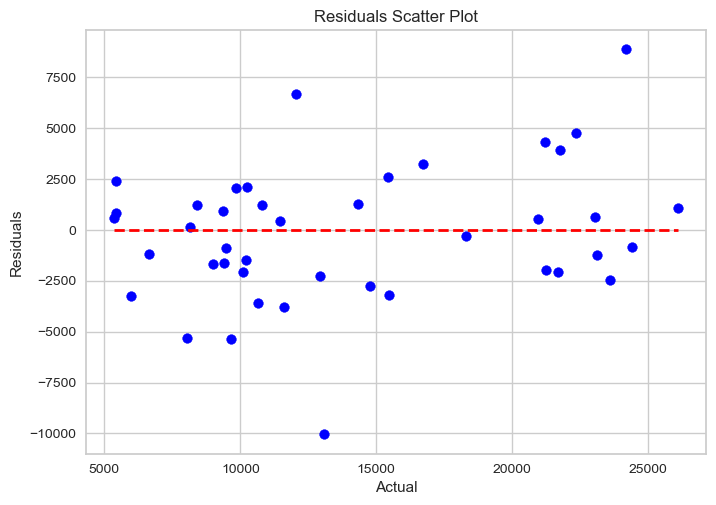


Residuals Histogram:


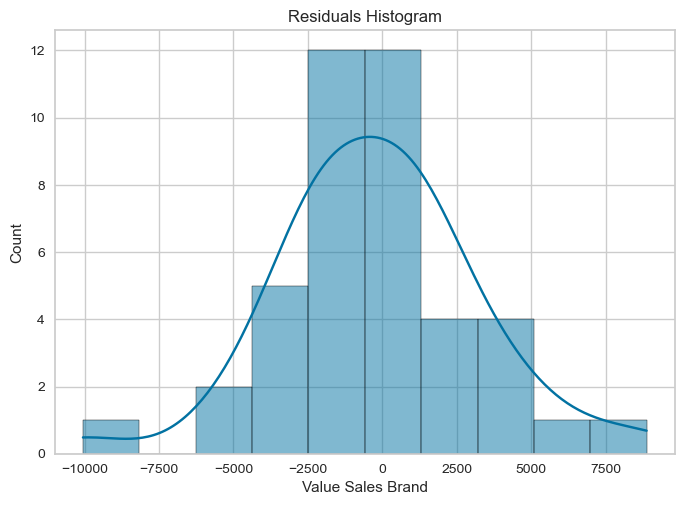

In [532]:
# Assuming dframe1 is your dataframe
X3_copy = X2_copy.drop(['INVESTMENTS PRINT_log_lag_halo', "GRP TV 20''", "GRP TV 10''"], axis=1)
y3_copy = y2_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X3_copy, y3_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

In [533]:
import pandas as pd

# Assuming you already have your DataFrame 'impressions'

# List of column pairs
column_pairs = [
    ["IMPRESSIONS YOUTUBE", "IMPRESSIONS SPOTIFY"],
    ["IMPRESSIONS YOUTUBE", "IMPRESSIONS SOCIAL META"],
    ["IMPRESSIONS YOUTUBE", "IMPRESSIONS OTHER VIDEO PUBLISHERS"],
    ["IMPRESSIONS YOUTUBE", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPRESSIONS YOUTUBE", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPRESSIONS YOUTUBE", "IMPR. TWITCH"],
    ["IMPRESSIONS YOUTUBE", "IMPR. TIKTOK"],
    ["IMPRESSIONS SPOTIFY", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPRESSIONS SPOTIFY", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPRESSIONS SPOTIFY", "IMPR. TWITCH"],
    ["IMPRESSIONS SPOTIFY", "IMPR. TIKTOK"],
    ["IMPRESSIONS SOCIAL META", "IMPRESSIONS SPOTIFY"],
    ["IMPRESSIONS SOCIAL META", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPRESSIONS SOCIAL META", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPRESSIONS SOCIAL META", "IMPR. TWITCH"],
    ["IMPRESSIONS SOCIAL META", "IMPR. TIKTOK"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPRESSIONS SPOTIFY"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPRESSIONS SOCIAL META"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPR. TWITCH"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPR. TIKTOK"],
    ["IMPRESSIONS INFLUENCER MARKETING TIKTOK", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPR. TWITCH", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPR. TWITCH", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPR. TIKTOK", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPR. TIKTOK", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPR. TIKTOK", "IMPR. TWITCH"]
]

# Creating new interaction columns
for pair in column_pairs:
    col1, col2 = pair
    new_col_name = f"{col1} * {col2}"
    X3_copy[new_col_name] = impressions[col1] * impressions[col2]

# Display the DataFrame with new interaction columns
print(X3_copy.head())

   AVERAGE PROMO PRICE  ONLINE REVIEWS  ONLINE RATINGS  Negative Opinions  \
0             9.941495          6069.0        4.673429                0.0   
1             9.941495          6297.0        4.654723                3.0   
2             9.941495          6566.0        4.656731                2.0   
3             9.941495          6790.0        4.653559                0.0   
4             9.941495          7084.0        4.653488                3.0   

   digital_investments  Sales Value Growth (%)  season_Summer  season_Winter  \
0             3.093619                0.000000              0              1   
1             2.966570               -2.403710              0              1   
2             2.801161               -1.932465              0              1   
3             2.721618                5.597509              0              1   
4             4.290006               -3.168608              0              1   

   NUMBER OF INFLUENCERS INVOLVED_log_lag_halo  INVESTME

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.911
Model:                            OLS   Adj. R-squared:                  0.885
Method:                 Least Squares   F-statistic:                     35.49
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           2.83e-51
Time:                        00:28:09   Log-Likelihood:                -1489.6
No. Observations:                 166   AIC:                             3055.
Df Residuals:                     128   BIC:                             3174.
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
                                                                                           coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

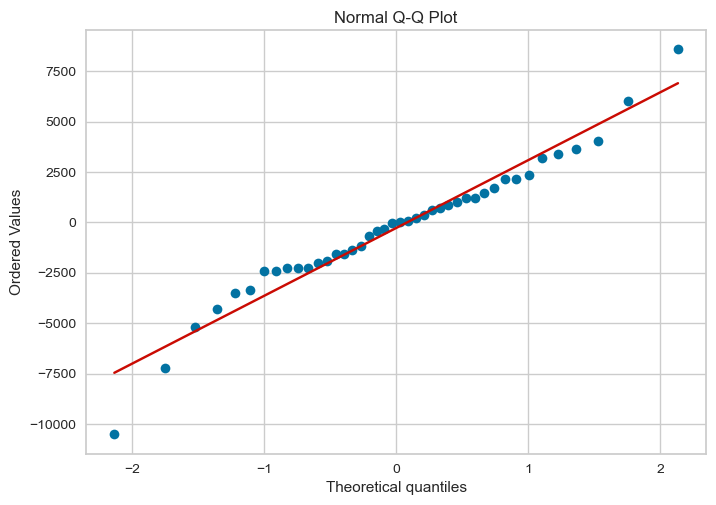


Actual vs Predicted:


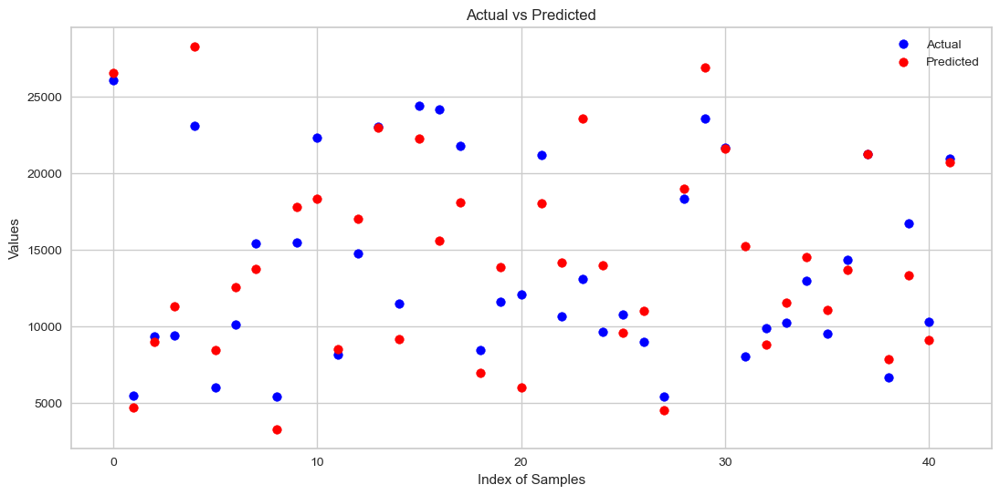

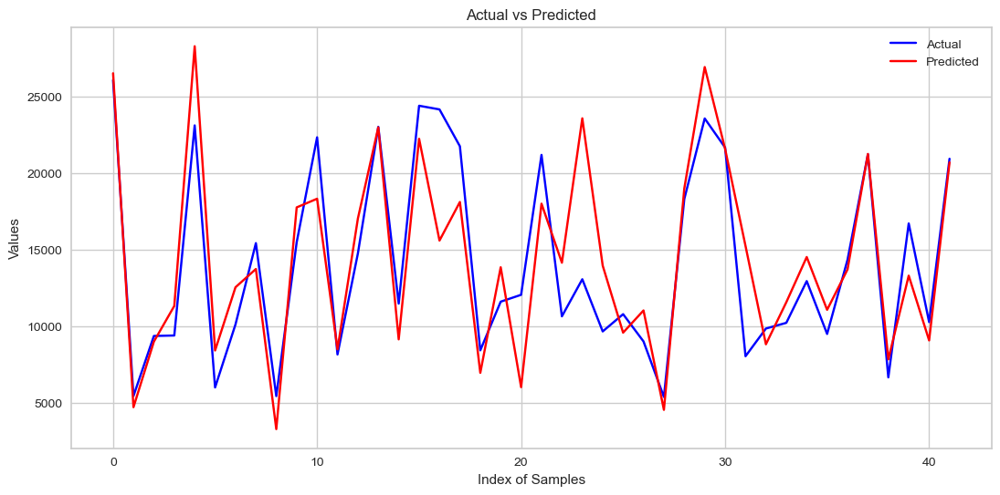

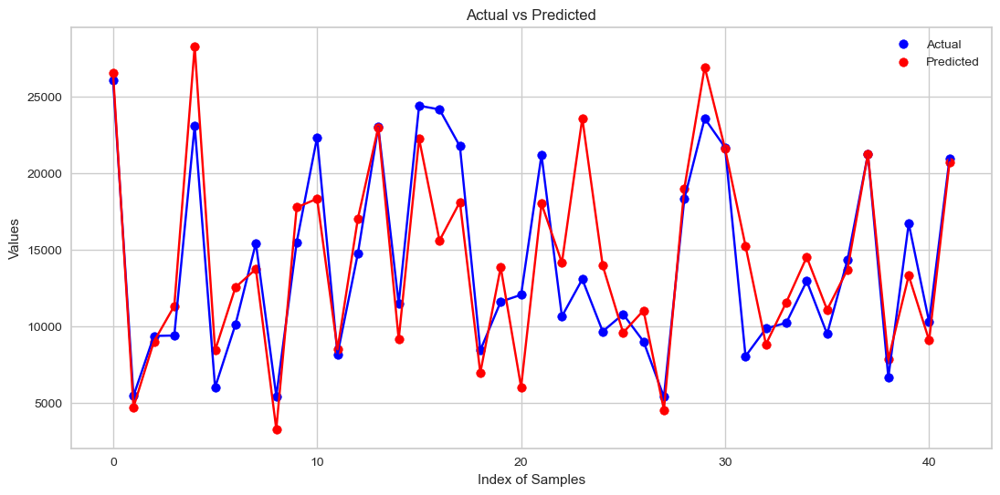


Residuals Scatter Plot:


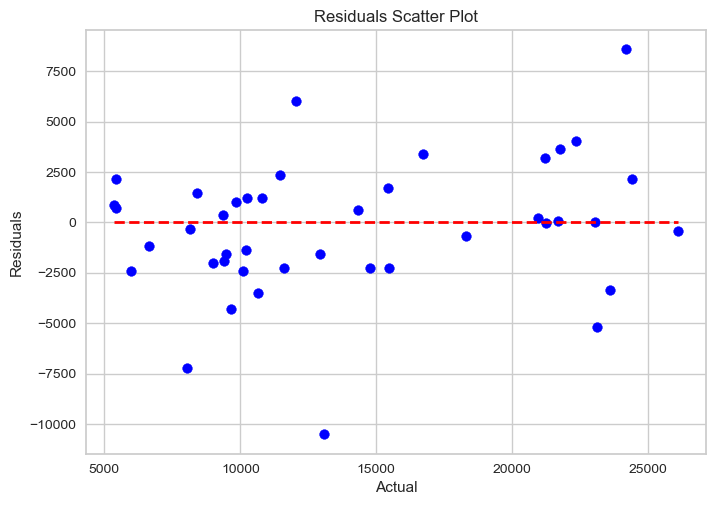


Residuals Histogram:


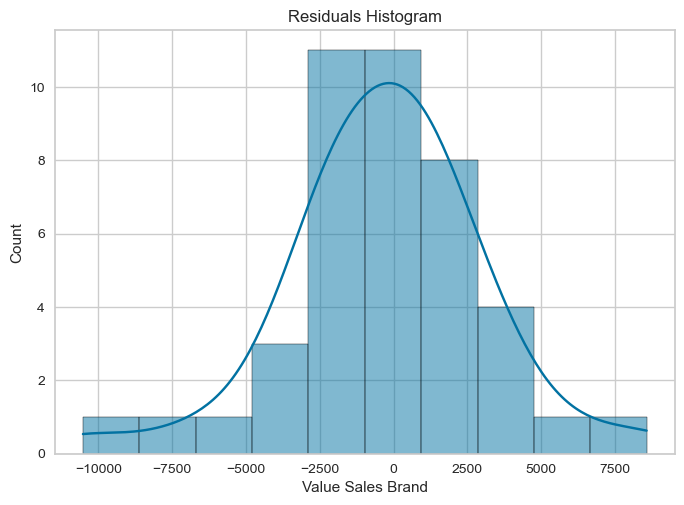

In [534]:
# Assuming dframe1 is your dataframe
X3_copy
y3_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X3_copy, y3_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.910
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     43.96
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           6.75e-56
Time:                        00:28:10   Log-Likelihood:                -1490.3
No. Observations:                 166   AIC:                             3045.
Df Residuals:                     134   BIC:                             3144.
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
                                                                                           coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

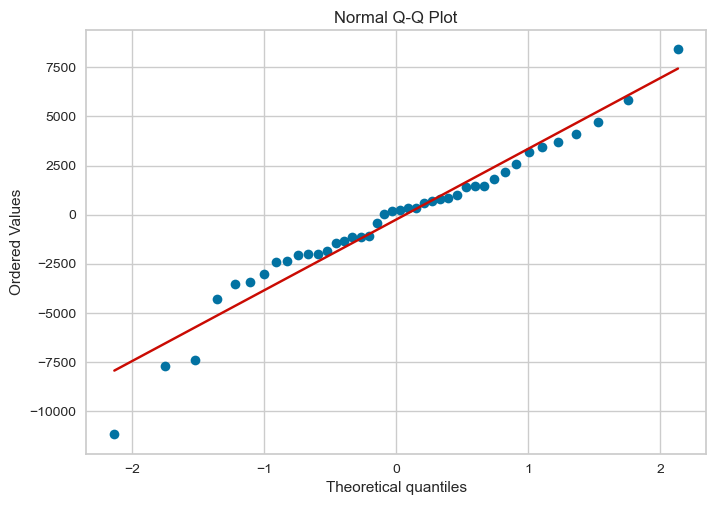


Actual vs Predicted:


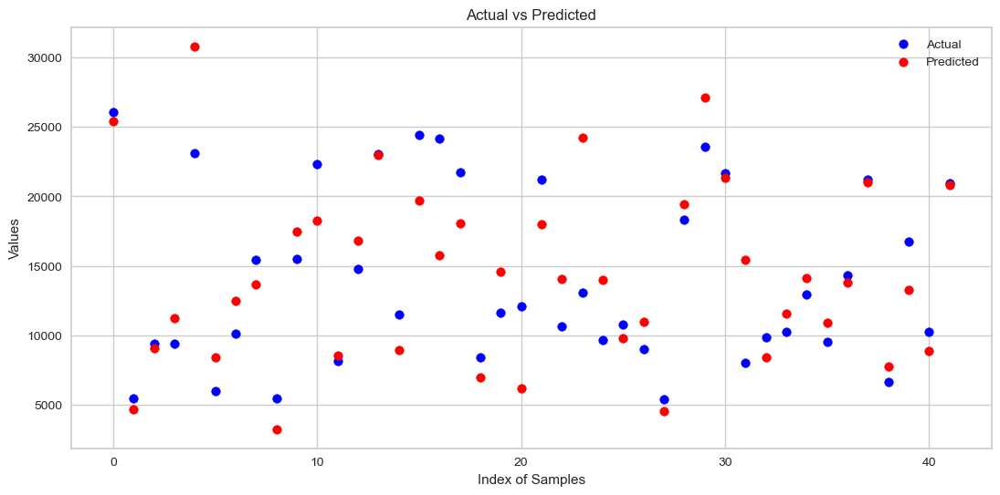

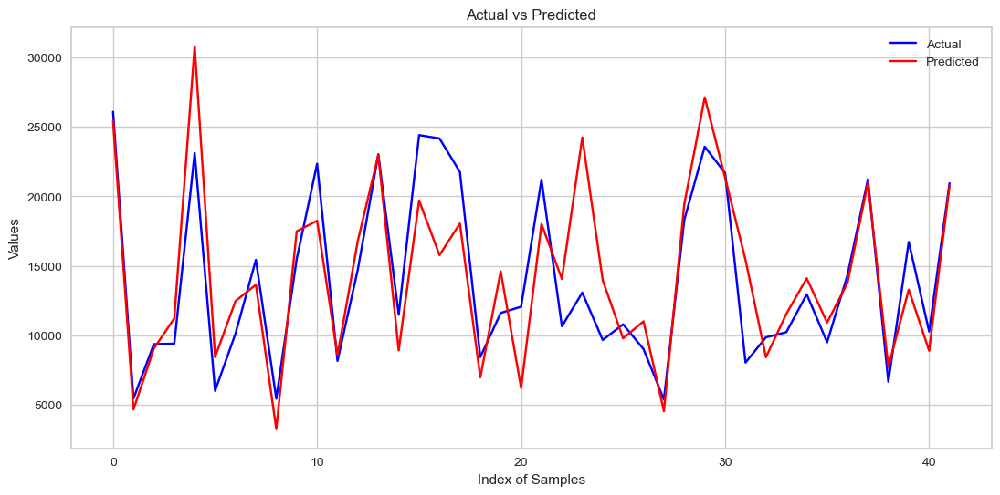

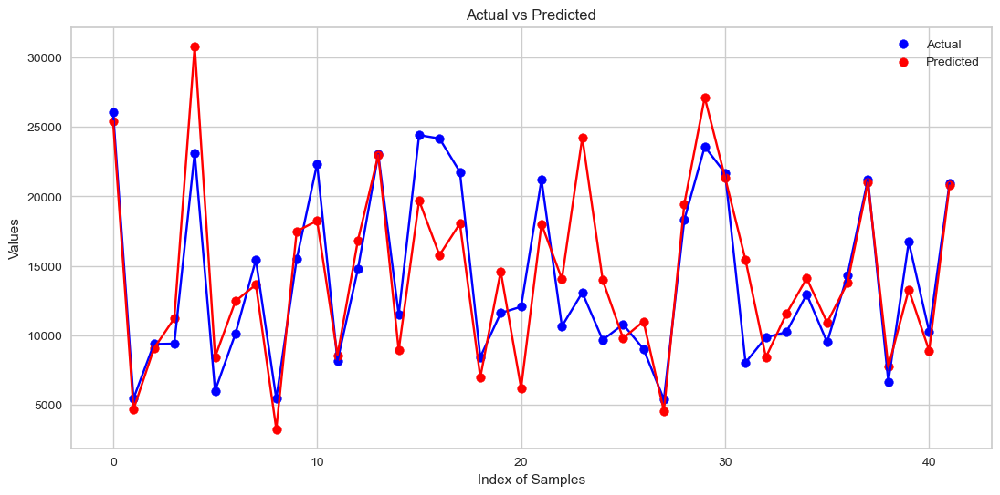


Residuals Scatter Plot:


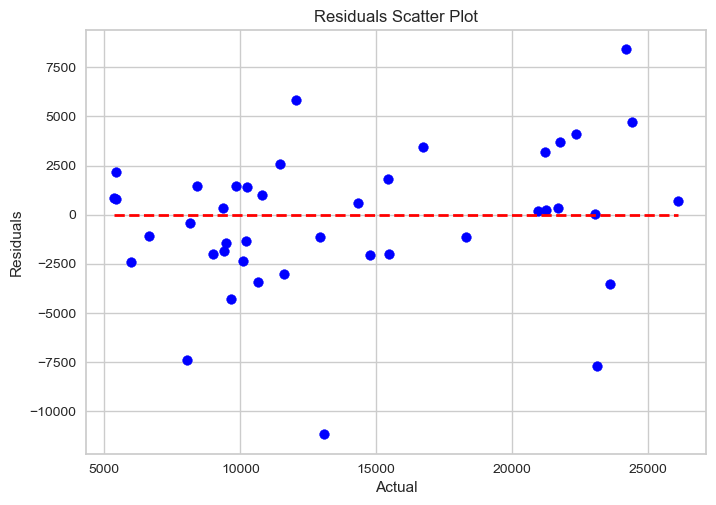


Residuals Histogram:


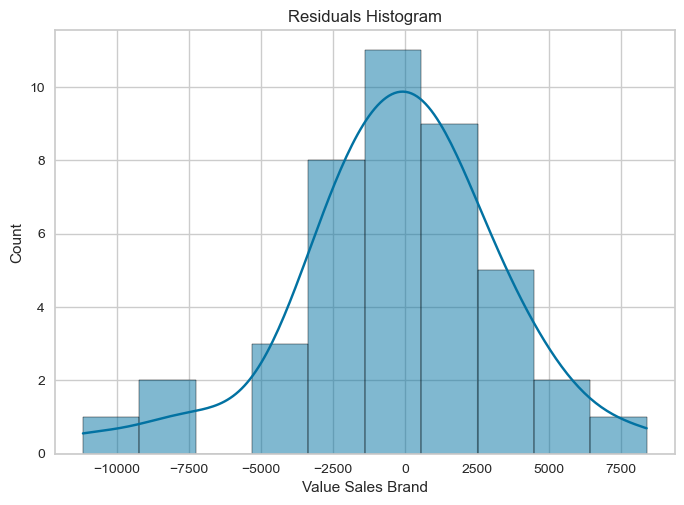

In [535]:
# Assuming dframe1 is your dataframe
X4_copy = X3_copy.drop(['IMPR. TIKTOK * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM', 'IMPR. TWITCH * IMPRESSIONS INFLUENCER MARKETING TIKTOK',
                        'IMPRESSIONS OTHER VIDEO PUBLISHERS * IMPR. TIKTOK', 'IMPRESSIONS SPOTIFY * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM',
                        'IMPRESSIONS SPOTIFY * IMPRESSIONS INFLUENCER MARKETING TIKTOK', 'IMPRESSIONS YOUTUBE * IMPRESSIONS OTHER VIDEO PUBLISHERS'], axis = 1)
y4_copy = y3_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X4_copy, y4_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.909
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     50.86
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.04e-58
Time:                        00:28:10   Log-Likelihood:                -1491.9
No. Observations:                 166   AIC:                             3040.
Df Residuals:                     138   BIC:                             3127.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                                                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

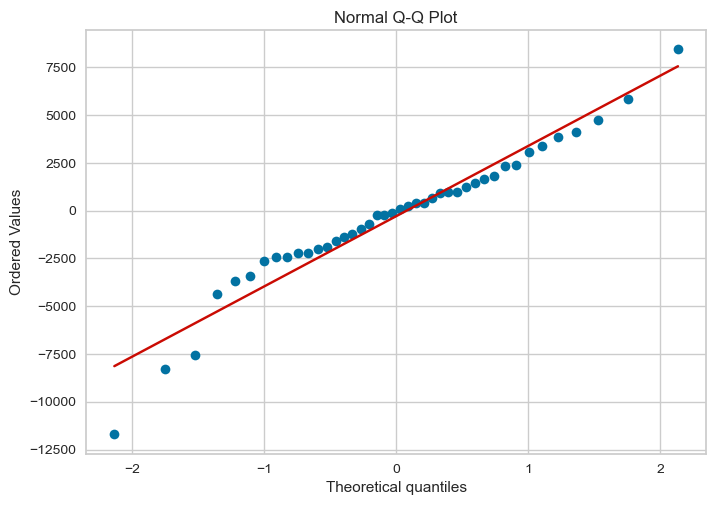


Actual vs Predicted:


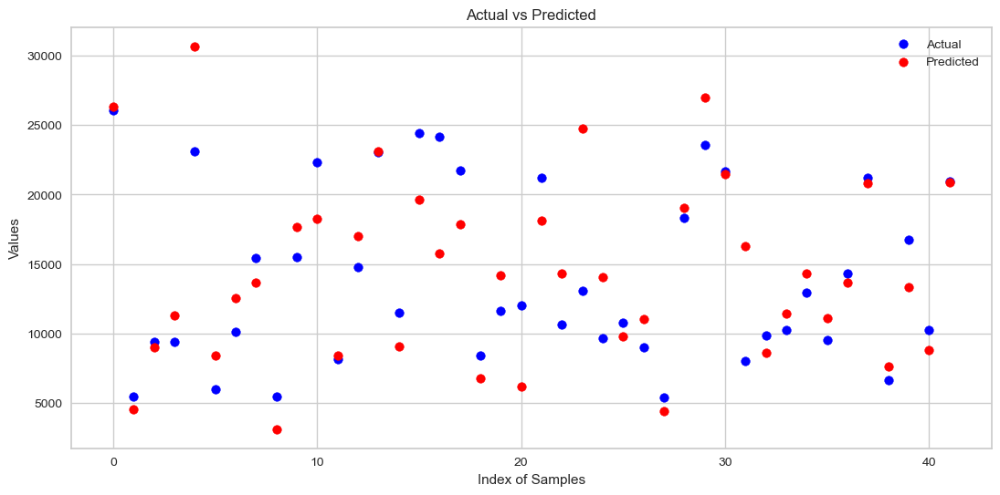

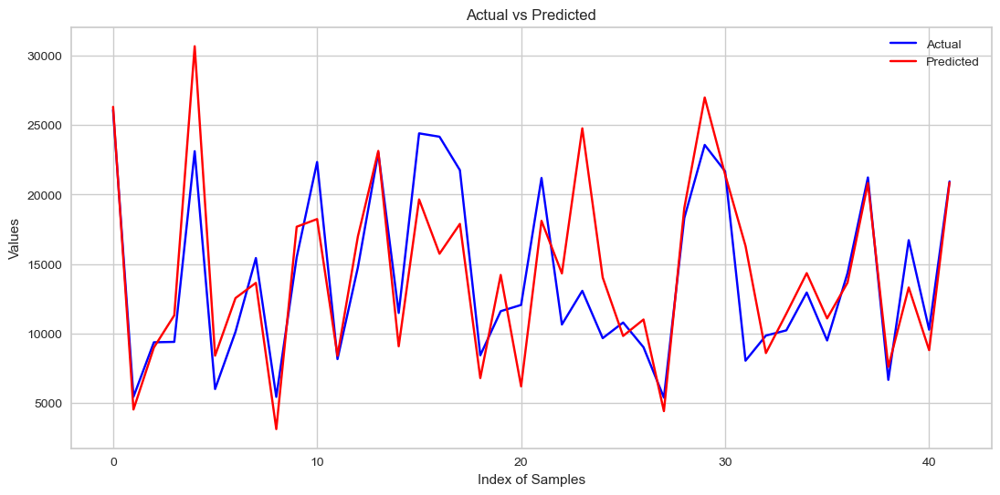

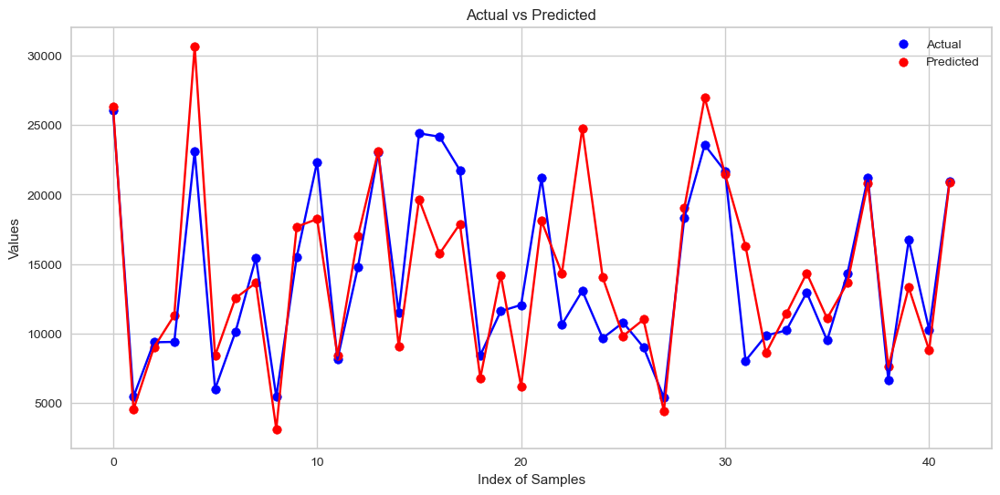


Residuals Scatter Plot:


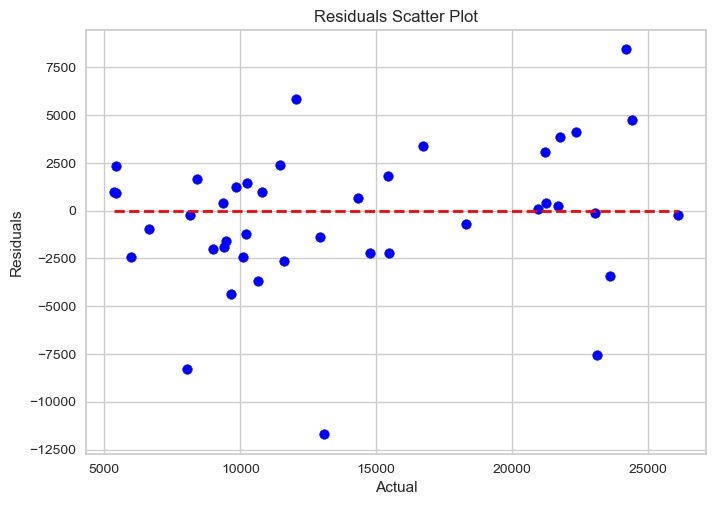


Residuals Histogram:


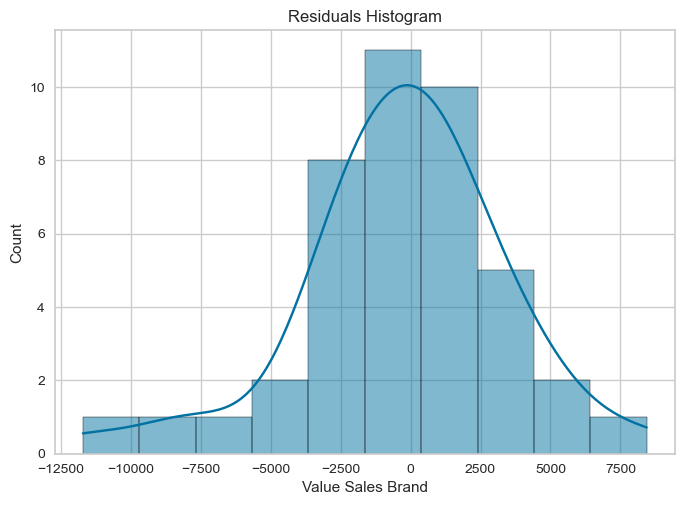

In [536]:
# Assuming dframe1 is your dataframe
X5_copy = X4_copy.drop(['NUMBER OF INFLUENCERS INVOLVED_log_lag_halo', 'IMPRESSIONS YOUTUBE * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM',
                        'IMPRESSIONS INFLUENCER MARKETING TIKTOK * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM', 'IMPR. TIKTOK * IMPR. TWITCH'], axis = 1)
y5_copy = y4_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X5_copy, y5_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.907
Model:                            OLS   Adj. R-squared:                  0.892
Method:                 Least Squares   F-statistic:                     60.26
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.04e-61
Time:                        00:28:11   Log-Likelihood:                -1493.4
No. Observations:                 166   AIC:                             3035.
Df Residuals:                     142   BIC:                             3109.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

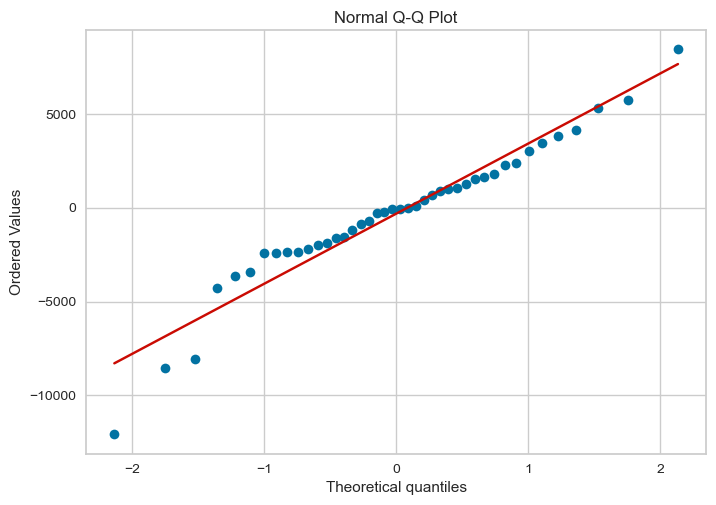


Actual vs Predicted:


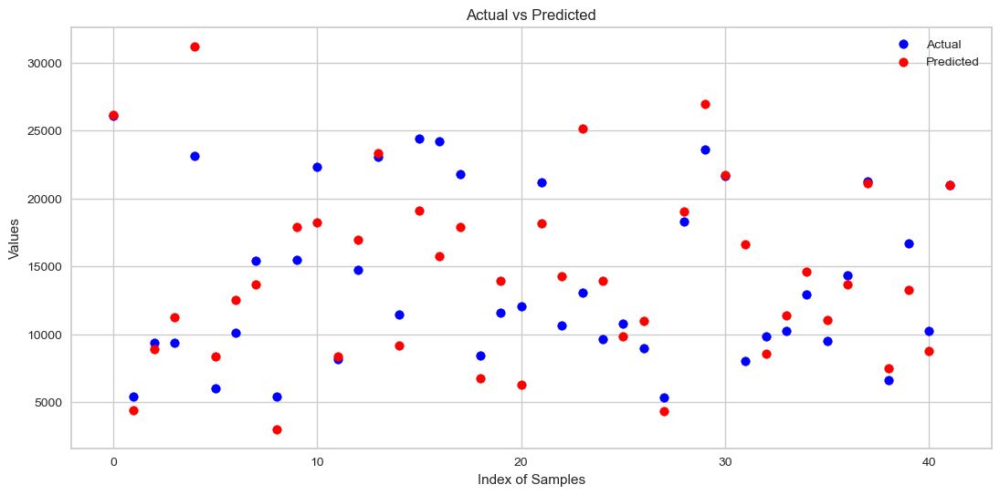

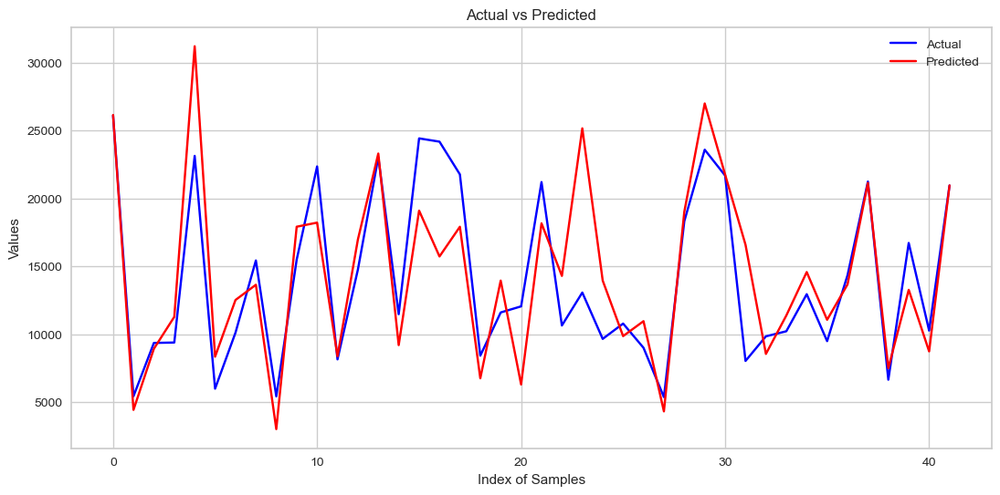

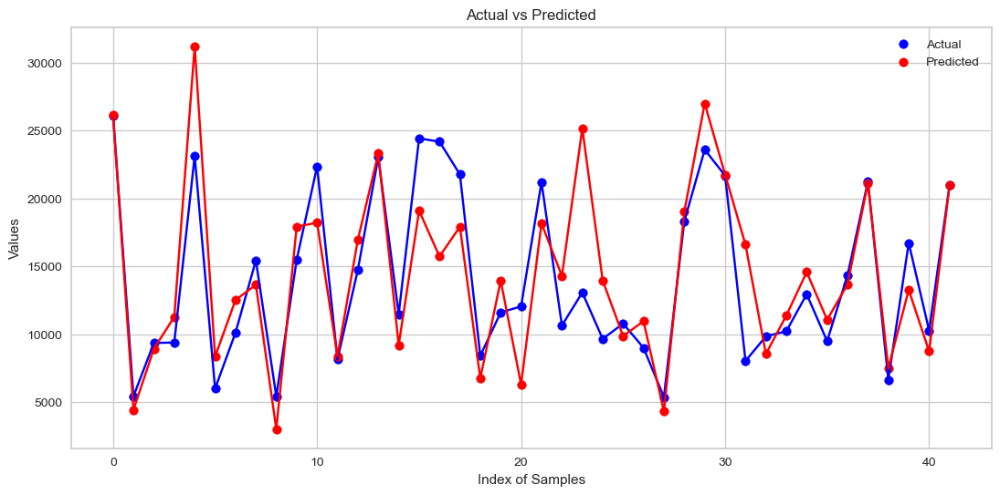


Residuals Scatter Plot:


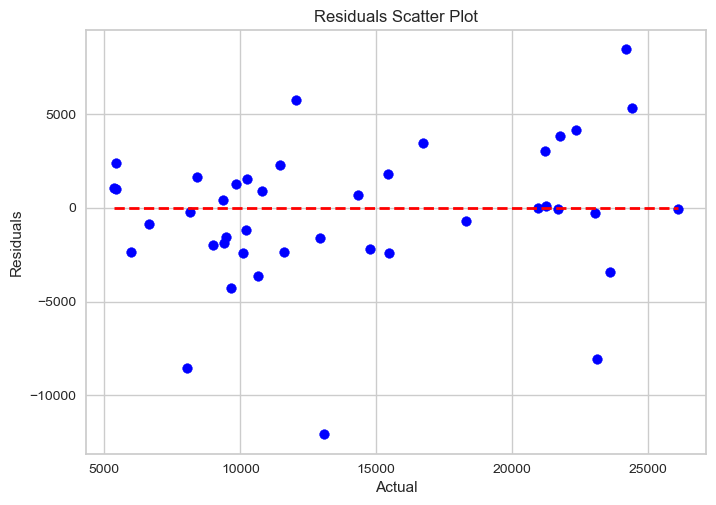


Residuals Histogram:


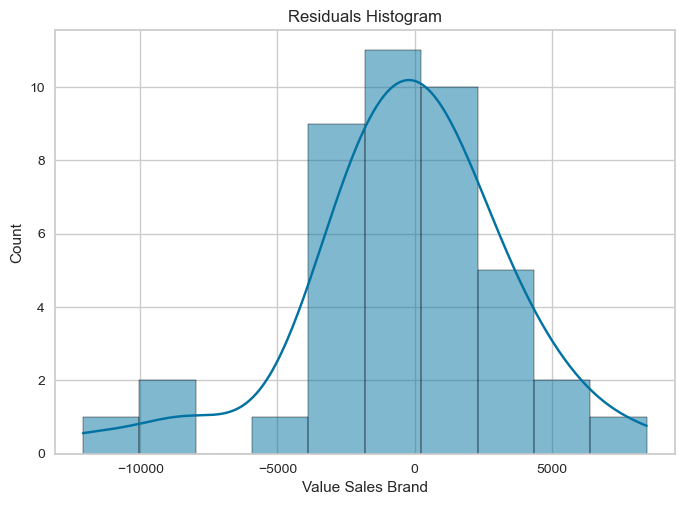

In [537]:
# Assuming dframe1 is your dataframe
X6_copy = X5_copy.drop(['IMPRESSIONS SOCIAL META * IMPR. TWITCH', 'IMPRESSIONS YOUTUBE * IMPR. TIKTOK', 
                        'IMPRESSIONS YOUTUBE * IMPR. TWITCH', 'IMPRESSIONS YOUTUBE * IMPRESSIONS INFLUENCER MARKETING TIKTOK'], axis = 1)
y6_copy = y5_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X6_copy, y6_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.902
Model:                            OLS   Adj. R-squared:                  0.889
Method:                 Least Squares   F-statistic:                     66.84
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           7.26e-63
Time:                        00:28:11   Log-Likelihood:                -1497.7
No. Observations:                 166   AIC:                             3037.
Df Residuals:                     145   BIC:                             3103.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

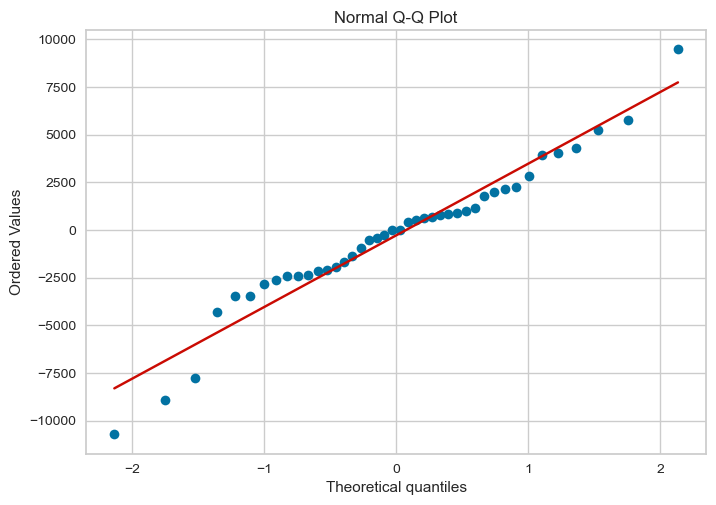


Actual vs Predicted:


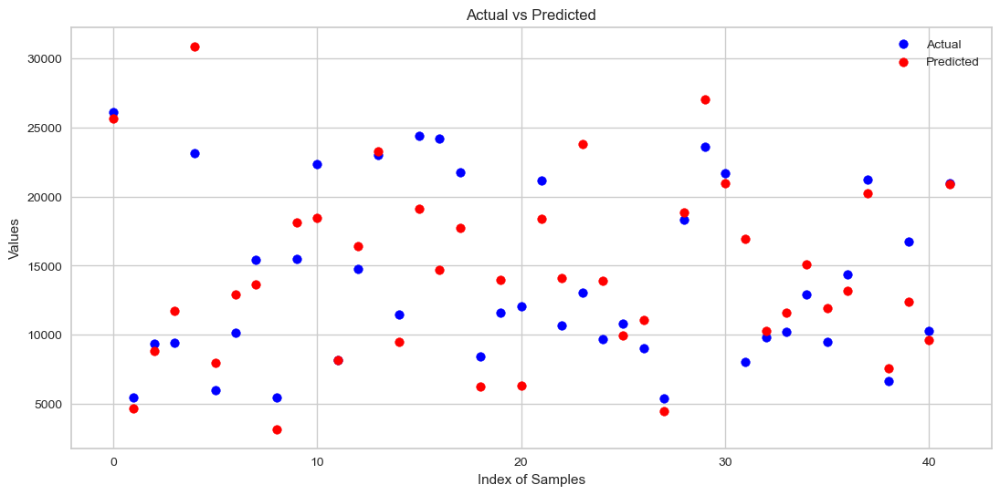

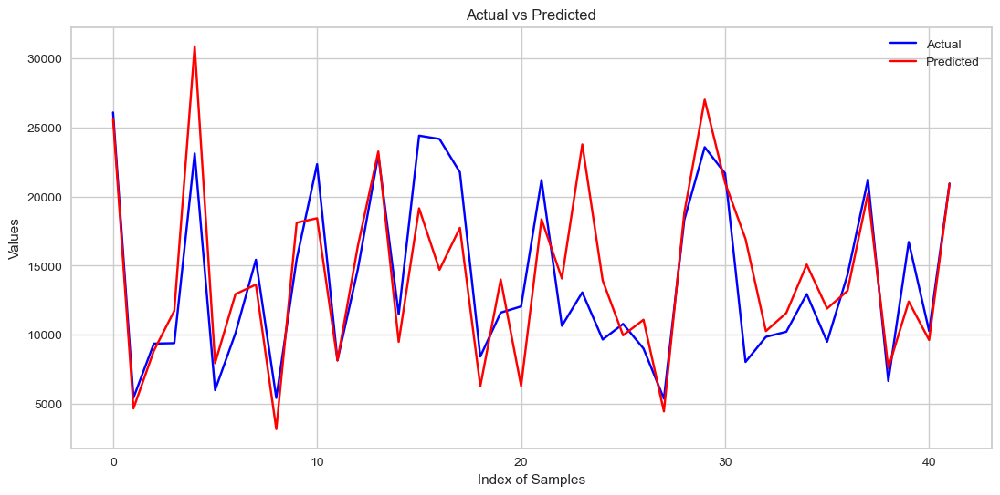

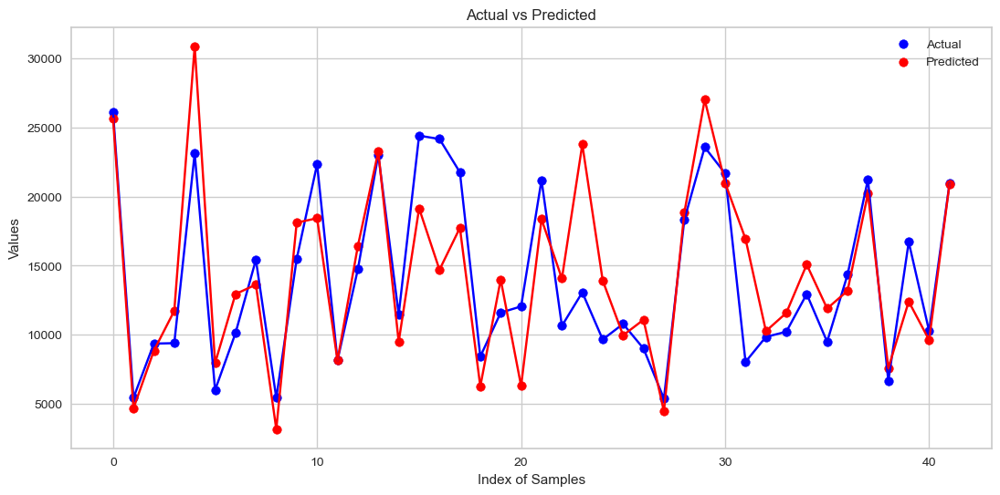


Residuals Scatter Plot:


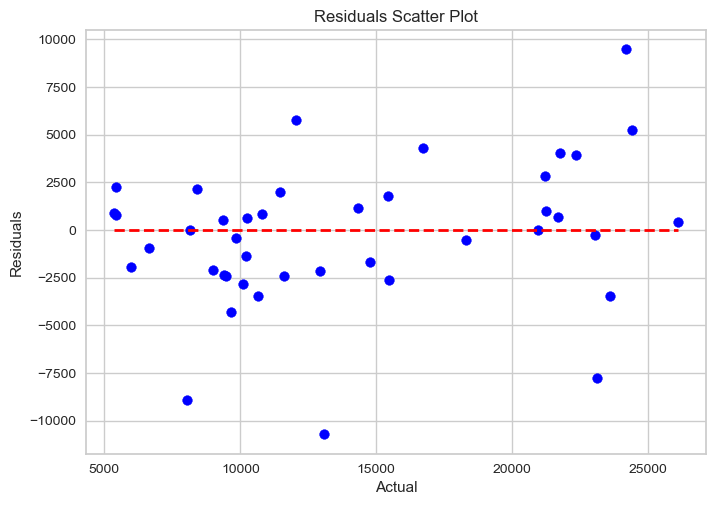


Residuals Histogram:


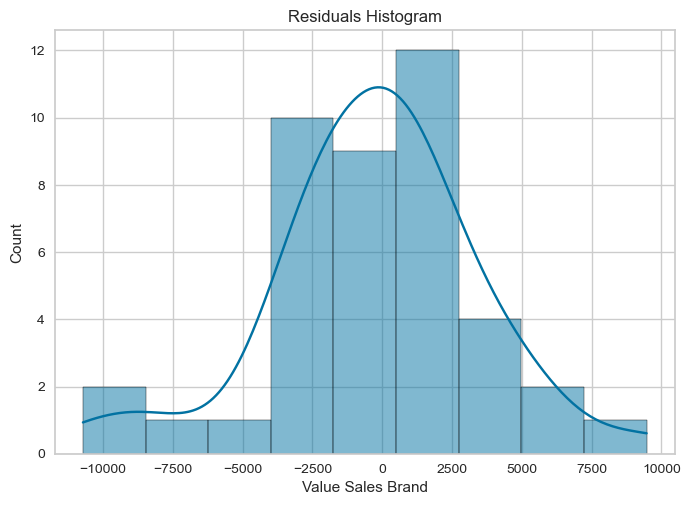

In [538]:
# Assuming dframe1 is your dataframe
X7_copy = X6_copy.drop(['IMPRESSIONS OTHER VIDEO PUBLISHERS * IMPRESSIONS INFLUENCER MARKETING TIKTOK', 'Negative Opinions', 'season_Winter'], axis = 1)
y7_copy = y6_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X7_copy, y7_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.861
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     33.20
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           3.12e-47
Time:                        00:28:12   Log-Likelihood:                -1526.6
No. Observations:                 166   AIC:                             3107.
Df Residuals:                     139   BIC:                             3191.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

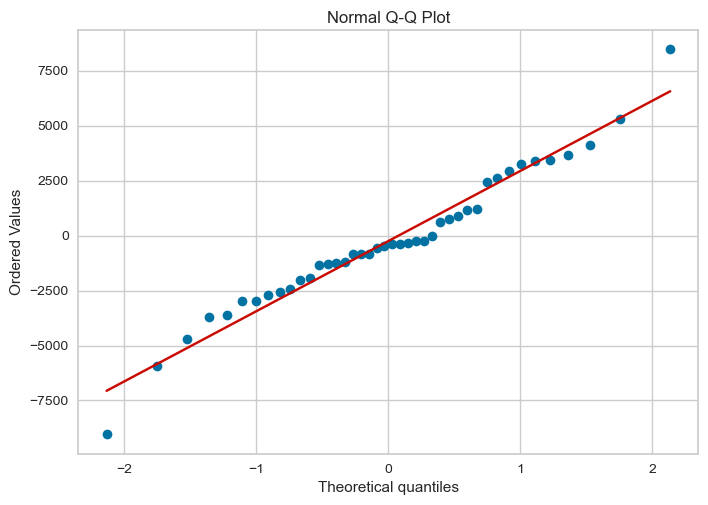


Actual vs Predicted:


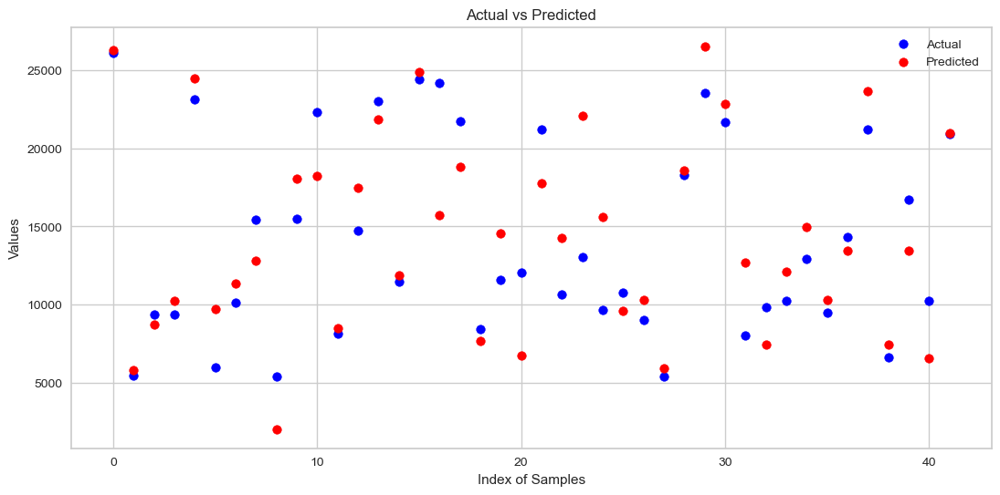

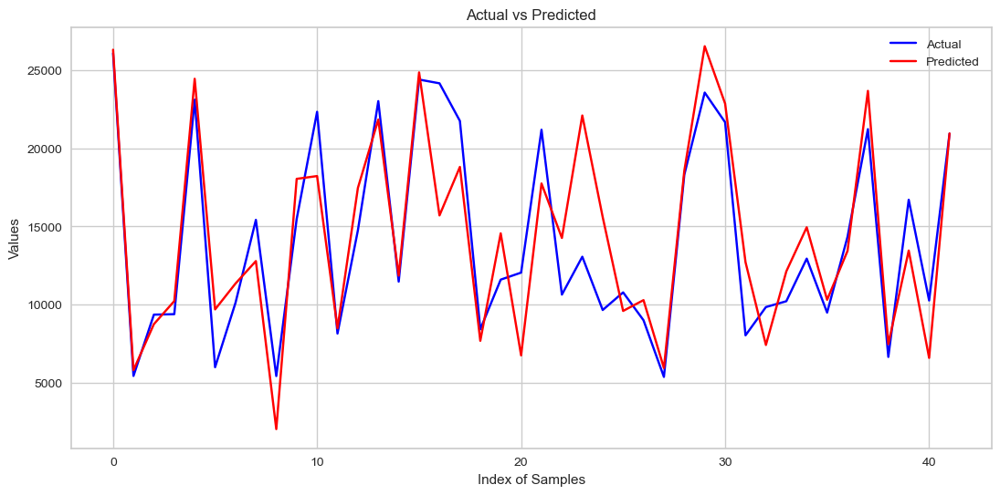

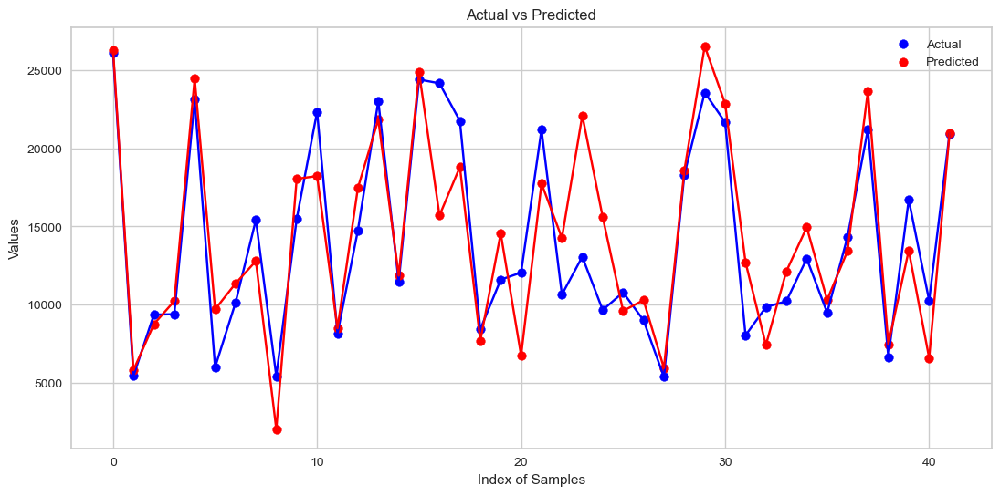


Residuals Scatter Plot:


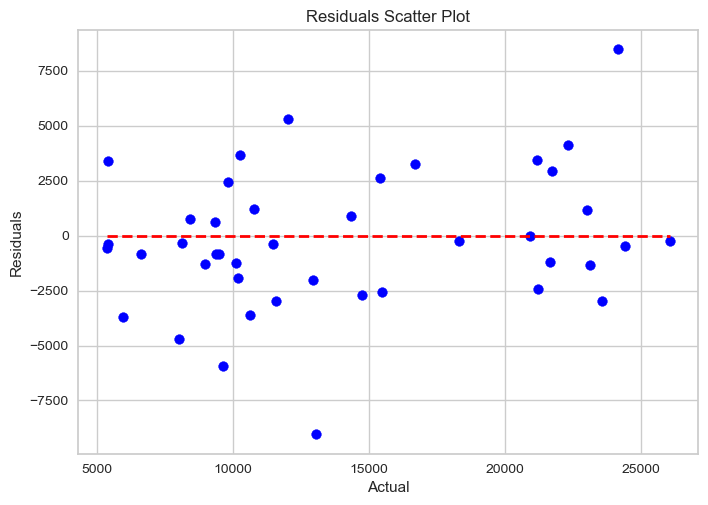


Residuals Histogram:


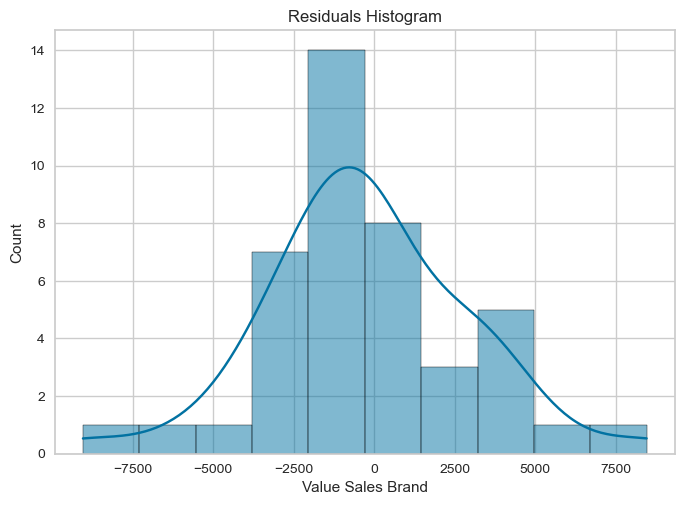

In [540]:
# Assuming dframe1 is your dataframe
X_copy = final_df.drop(['Value Sales Brand'], axis=1)
y_copy = final_df['Value Sales Brand']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_copy, y_copy
                                                    , test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     44.12
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.60e-51
Time:                        00:28:13   Log-Likelihood:                -1528.1
No. Observations:                 166   AIC:                             3098.
Df Residuals:                     145   BIC:                             3163.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

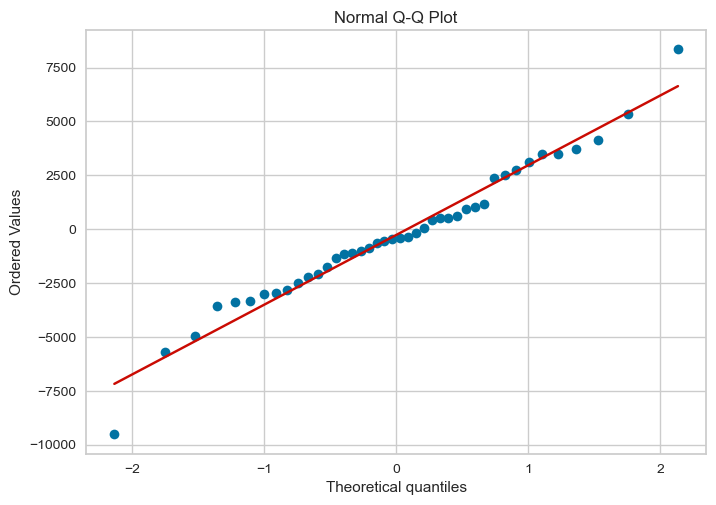


Actual vs Predicted:


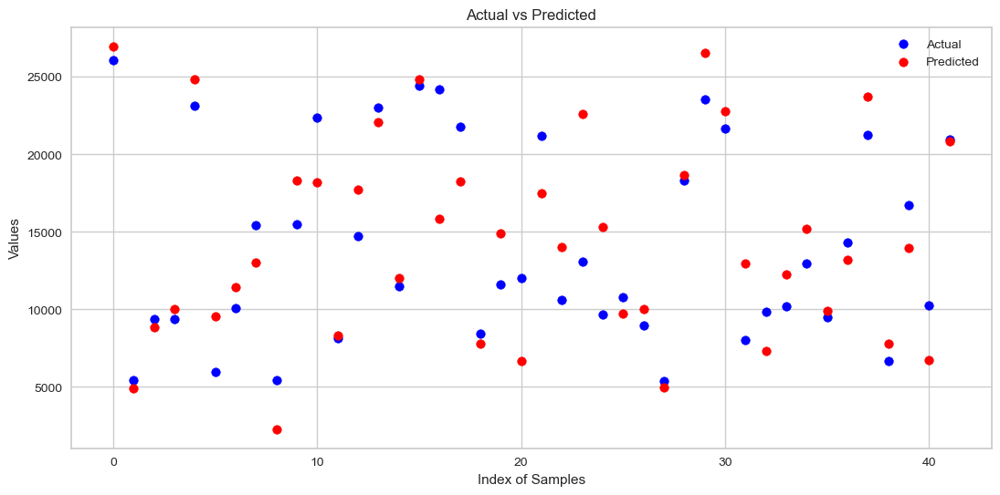

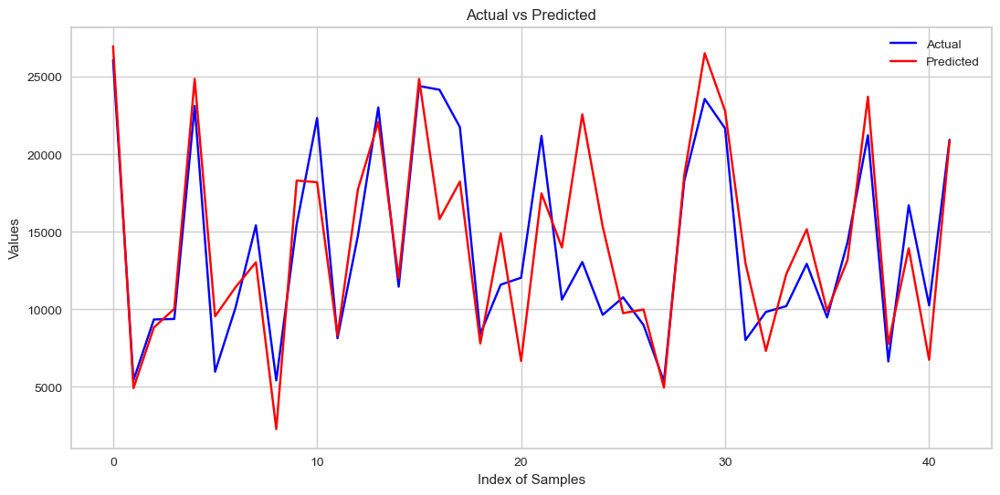

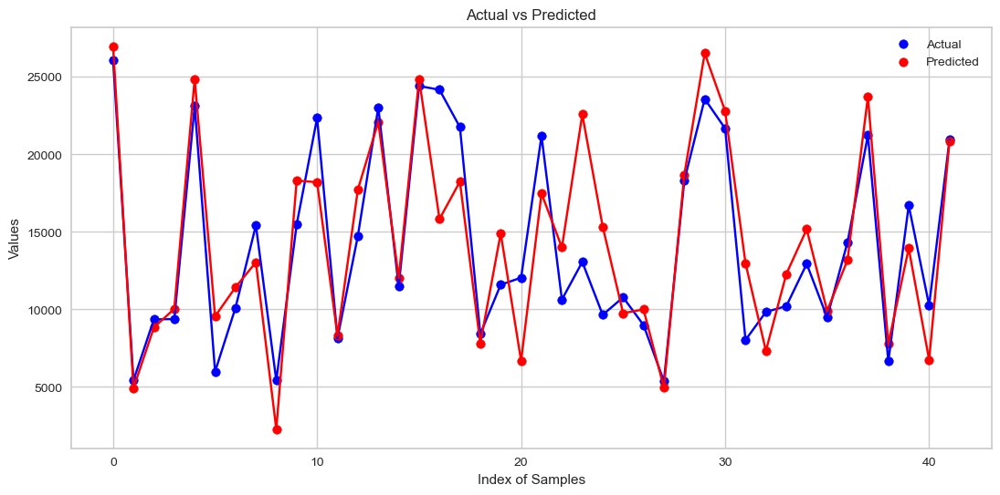


Residuals Scatter Plot:


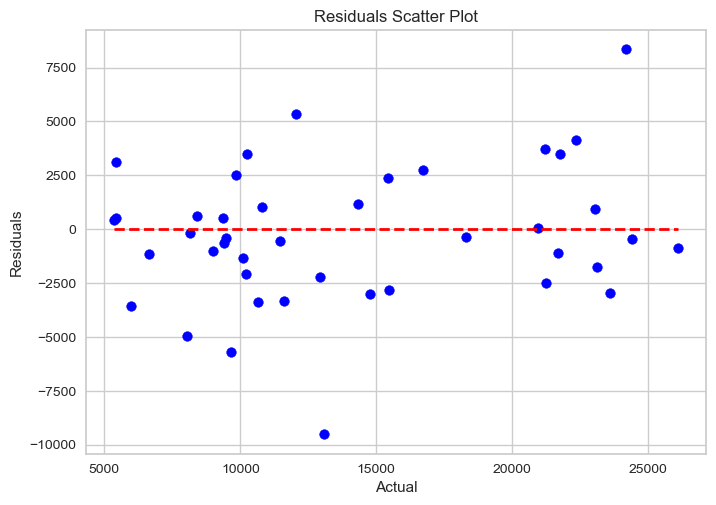


Residuals Histogram:


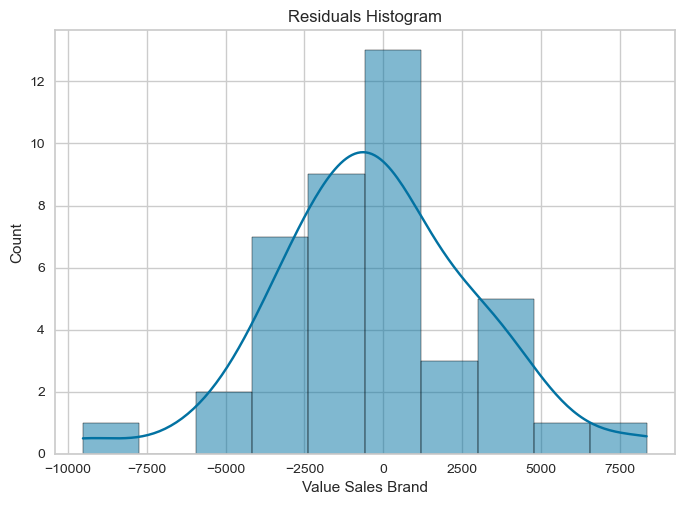

In [541]:
# Assuming dframe1 is your dataframe
X1_copy = X_copy.drop(['Number of Items', 'AVERAGE PRICE MKT', 'competitors_grp', 'total_editors', 'DISTRIBUTED SAMPLES (.000)', 'events_seasonal'], axis=1)
y1_copy = y_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X1_copy, y1_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)


                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.836
Method:                 Least Squares   F-statistic:                     61.12
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           8.04e-55
Time:                        00:28:13   Log-Likelihood:                -1533.1
No. Observations:                 166   AIC:                             3096.
Df Residuals:                     151   BIC:                             3143.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

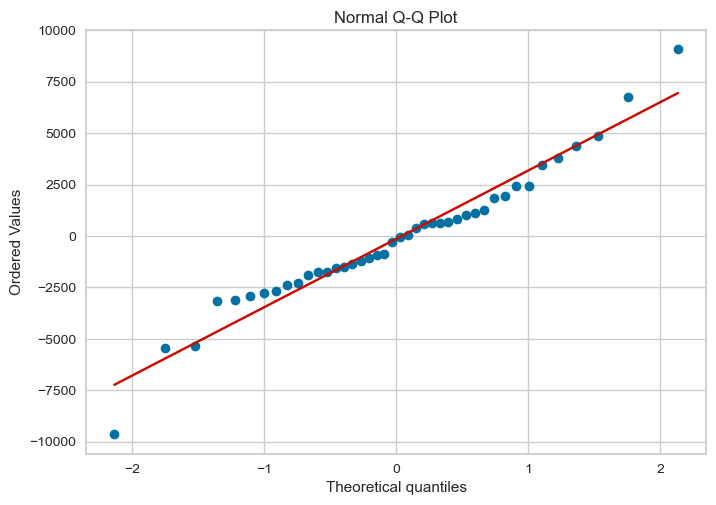


Actual vs Predicted:


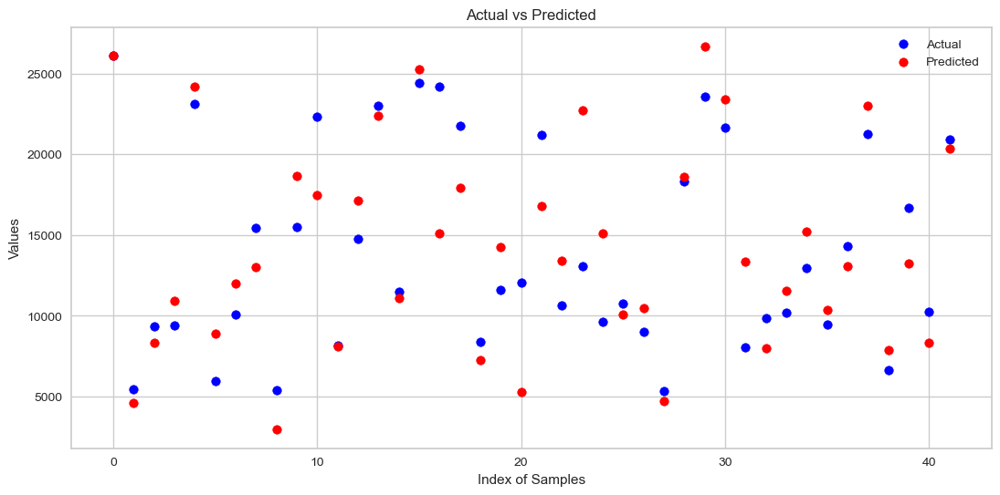

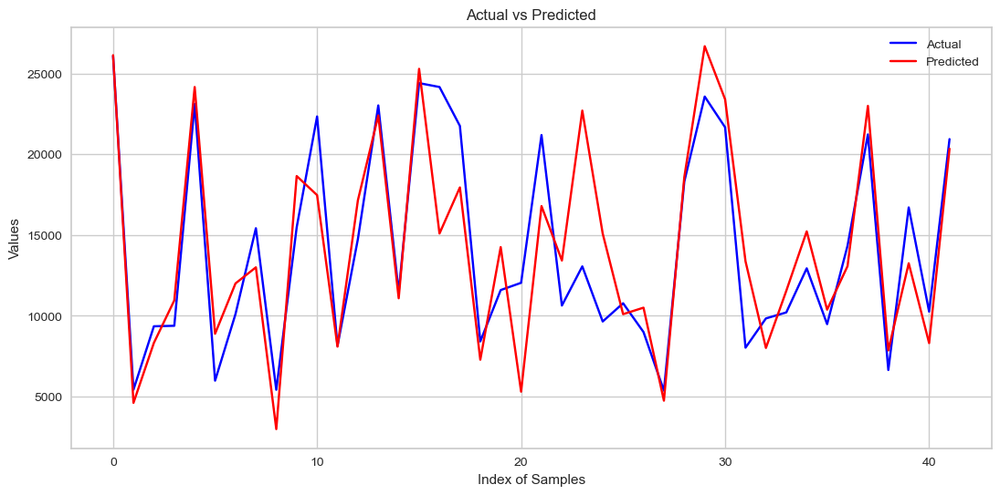

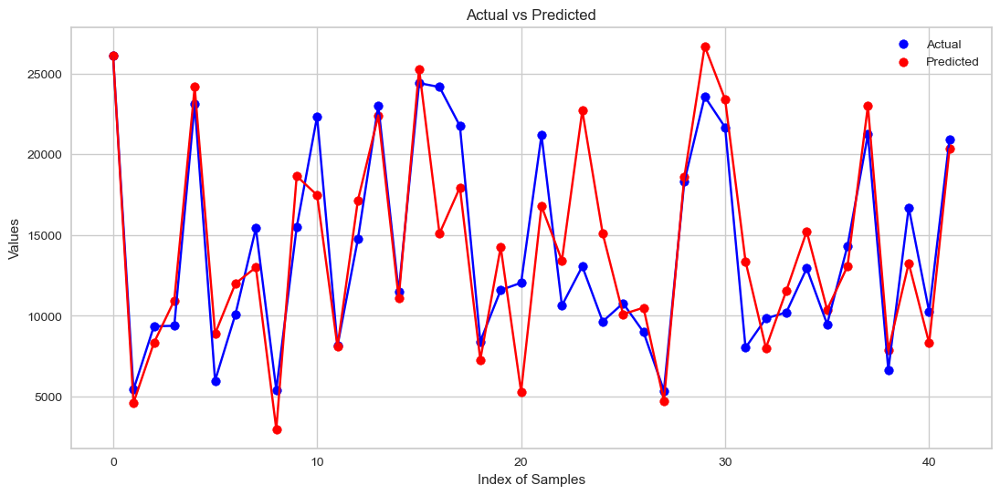


Residuals Scatter Plot:


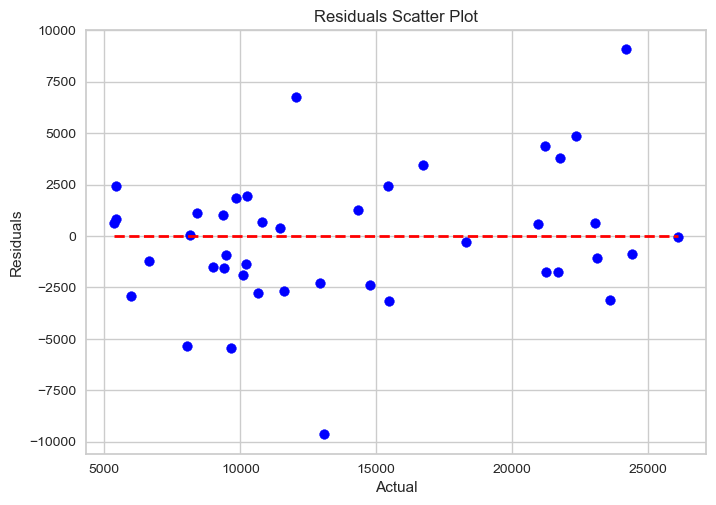


Residuals Histogram:


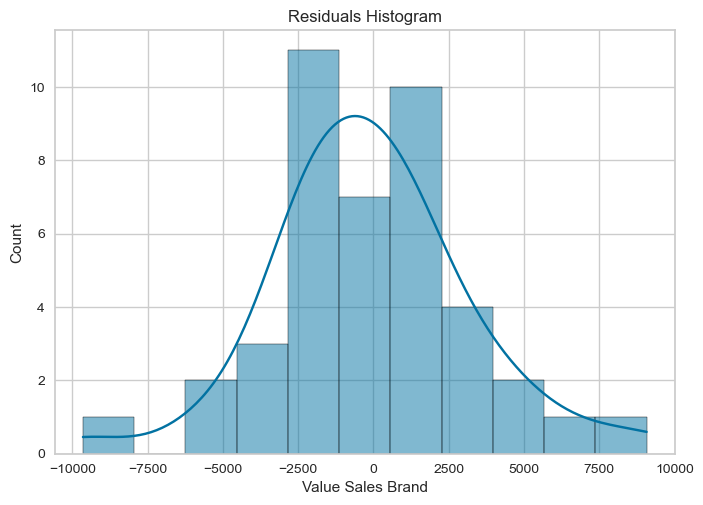

In [542]:
# Assuming dframe1 is your dataframe
X2_copy = X1_copy.drop(['SEASONALITY MARKET', 'total_totem', 'Positive Opinions', 'season_Spring', 
              'Weighted Handling Distribution_lag_halo', 'LOCKDOWN_log_lag_halo'], axis=1)
y2_copy = y1_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X2_copy, y2_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     76.40
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.39e-56
Time:                        00:28:14   Log-Likelihood:                -1535.8
No. Observations:                 166   AIC:                             3096.
Df Residuals:                     154   BIC:                             3133.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

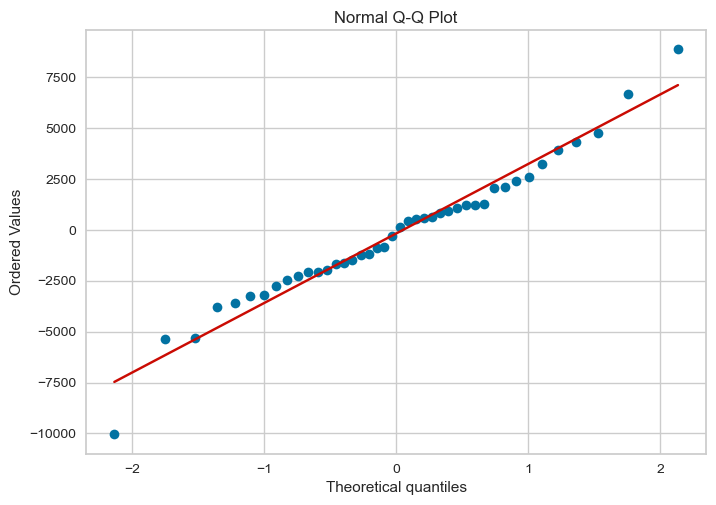


Actual vs Predicted:


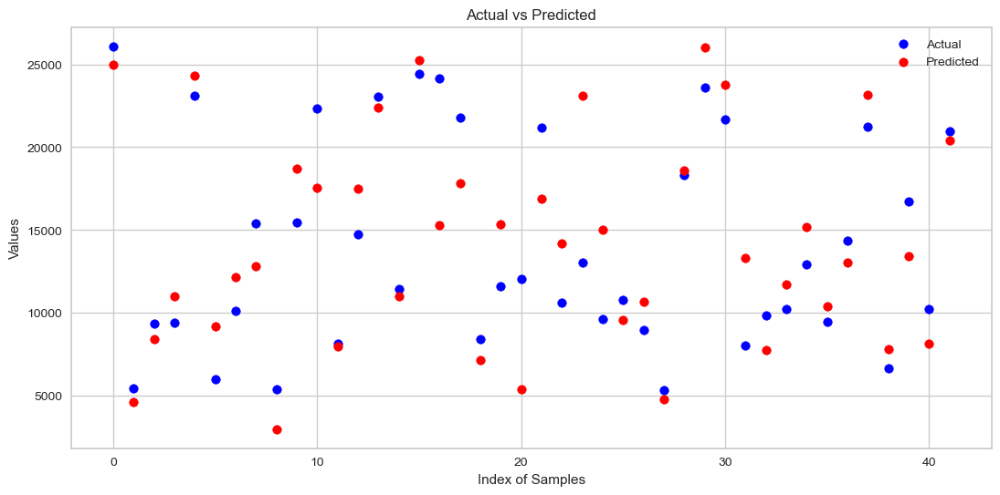

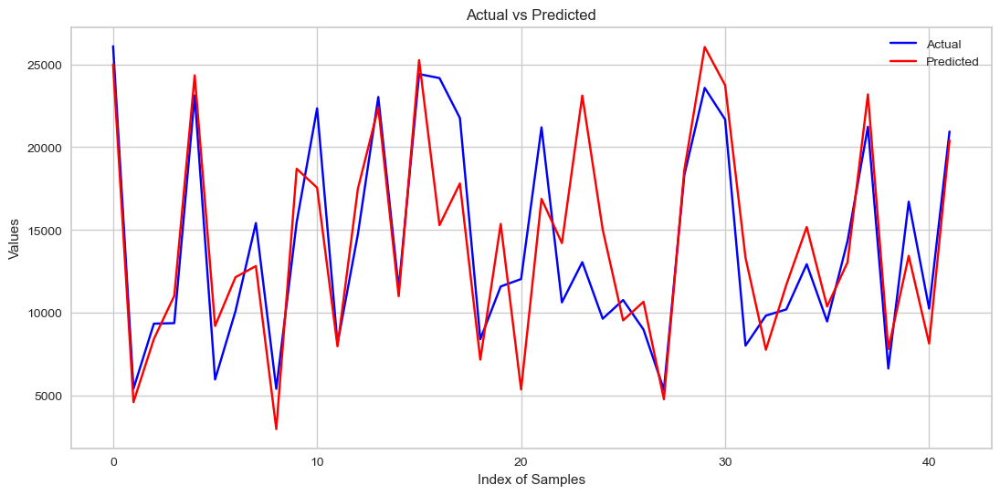

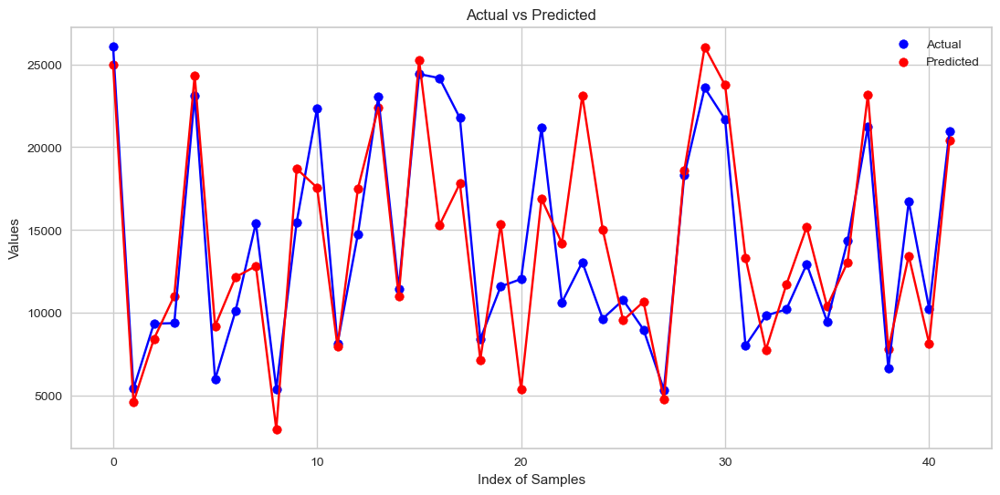


Residuals Scatter Plot:


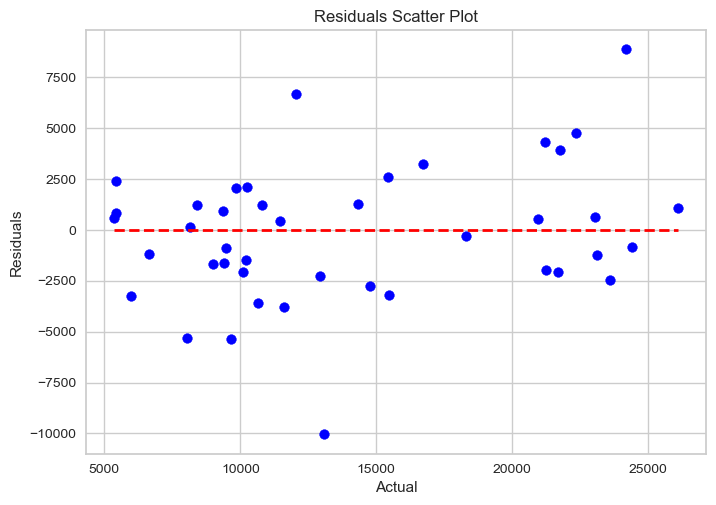


Residuals Histogram:


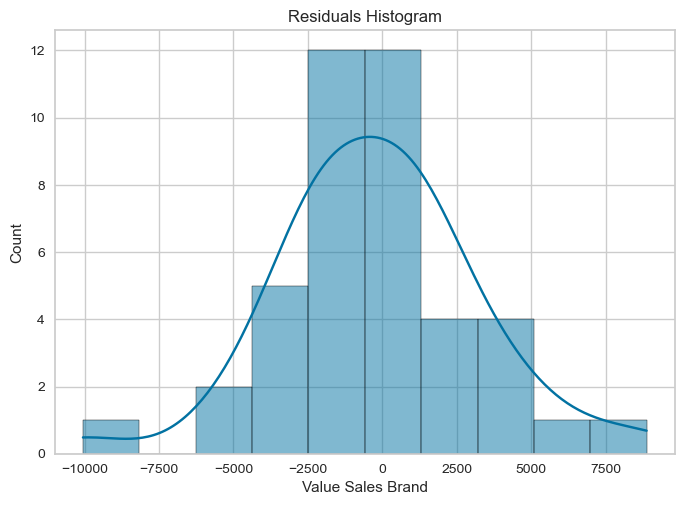

In [543]:
# Assuming dframe1 is your dataframe
X3_copy = X2_copy.drop(['INVESTMENTS PRINT_log_lag_halo', "GRP TV 20''", "GRP TV 10''"], axis=1)
y3_copy = y2_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X3_copy, y3_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

In [544]:
impressions.columns

Index(['IMPRESSIONS YOUTUBE', 'IMPRESSIONS OTHER VIDEO PUBLISHERS',
       'IMPRESSIONS SOCIAL META', 'IMPRESSIONS SPOTIFY', 'IMPR. TIKTOK',
       'IMPR. TWITCH', 'IMPRESSIONS INFLUENCER MARKETING TIKTOK',
       'IMPRESSIONS INFLUENCER MARKETING INSTAGRAM', 'Digital Value'],
      dtype='object')

In [545]:
tv.columns

Index(['TV Sales Value', 'TV Sales Volume', 'GRP TV', 'GRP TV 20''',
       'GRP TV 10''', 'YEAR', 'N WEEK', 'Week starting sell-out',
       'INVESTMENTS TV'],
      dtype='object')

In [546]:
tv

,TV Sales Value,TV Sales Volume,GRP TV,GRP TV 20'',GRP TV 10'',YEAR,N WEEK,Week starting sell-out,INVESTMENTS TV
0,511.078045,37.403271,298.069364,298.069364,0.0,2020,1,2020-01-05,32.488681
1,498.793213,36.504205,0.000000,0.000000,0.0,2020,2,2020-01-12,0.000000
2,489.154209,35.798774,190.645469,190.645469,0.0,2020,3,2020-01-19,34.212849
3,516.534662,37.533194,180.655469,180.655469,0.0,2020,4,2020-01-26,32.304021
4,500.167703,39.542821,0.000000,0.000000,0.0,2020,5,2020-02-02,0.000000
...,...,...,...,...,...,...,...,...,...
203,1376.544222,95.291245,0.000000,0.000000,0.0,2023,48,2023-11-26,0.000000
204,1250.473706,86.127658,0.000000,0.000000,0.0,2023,49,2023-12-03,0.000000
205,1465.393599,100.131102,0.000000,0.000000,0.0,2023,50,2023-12-10,0.000000
206,1871.596662,129.789337,0.000000,0.000000,0.0,2023,51,2023-12-17,0.000000


In [547]:
impressions

,IMPRESSIONS YOUTUBE,IMPRESSIONS OTHER VIDEO PUBLISHERS,IMPRESSIONS SOCIAL META,IMPRESSIONS SPOTIFY,IMPR. TIKTOK,IMPR. TWITCH,IMPRESSIONS INFLUENCER MARKETING TIKTOK,IMPRESSIONS INFLUENCER MARKETING INSTAGRAM,Digital Value
0,3.260168e+05,0.0,5922641.0,0.0,0.0,0.0,0.0,0.0,71204.837608
1,3.260168e+05,0.0,5179143.0,0.0,0.0,0.0,0.0,0.0,69493.280086
2,3.260168e+05,0.0,4593190.0,0.0,0.0,0.0,0.0,0.0,68150.346775
3,3.260168e+05,0.0,4139242.0,0.0,0.0,0.0,0.0,0.0,71965.068907
4,7.647560e+05,0.0,4638533.0,0.0,0.0,0.0,0.0,0.0,69684.777813
...,...,...,...,...,...,...,...,...,...
203,3.032430e+05,713288.0,2266792.0,0.0,851598.0,0.0,225600.0,360291.0,191784.031240
204,0.000000e+00,0.0,0.0,0.0,0.0,0.0,16133000.0,102840.0,174219.530640
205,5.831232e+06,487747.0,8593088.0,0.0,7746872.0,0.0,0.0,0.0,204162.777471
206,8.299217e+06,2105843.0,8898730.0,0.0,12559058.0,916594.5,0.0,0.0,260756.136194


In [548]:
impressions_tv =pd.concat([tv, impressions], axis=1)

In [549]:
impressions_tv.columns

Index(['TV Sales Value', 'TV Sales Volume', 'GRP TV', 'GRP TV 20''',
       'GRP TV 10''', 'YEAR', 'N WEEK', 'Week starting sell-out',
       'INVESTMENTS TV', 'IMPRESSIONS YOUTUBE',
       'IMPRESSIONS OTHER VIDEO PUBLISHERS', 'IMPRESSIONS SOCIAL META',
       'IMPRESSIONS SPOTIFY', 'IMPR. TIKTOK', 'IMPR. TWITCH',
       'IMPRESSIONS INFLUENCER MARKETING TIKTOK',
       'IMPRESSIONS INFLUENCER MARKETING INSTAGRAM', 'Digital Value'],
      dtype='object')

In [550]:
impressions_tv = impressions_tv.drop(['TV Sales Volume', 'GRP TV', 'N WEEK', 'Week starting sell-out', 'YEAR'], axis = 1)

In [551]:
impressions_tv['Digital Value'] = impressions_tv['Digital Value']/7.0351181366282125
impressions_tv['Digital Value'] = impressions_tv['Digital Value']*19.092673497529987/100
impressions_tv['TV+Digital'] = impressions_tv['Digital Value']+impressions_tv['TV Sales Value']
impressions_tv = impressions_tv.drop(['TV Sales Value','Digital Value'], axis = 1)

In [552]:
impressions_tv.columns

Index(['GRP TV 20''', 'GRP TV 10''', 'INVESTMENTS TV', 'IMPRESSIONS YOUTUBE',
       'IMPRESSIONS OTHER VIDEO PUBLISHERS', 'IMPRESSIONS SOCIAL META',
       'IMPRESSIONS SPOTIFY', 'IMPR. TIKTOK', 'IMPR. TWITCH',
       'IMPRESSIONS INFLUENCER MARKETING TIKTOK',
       'IMPRESSIONS INFLUENCER MARKETING INSTAGRAM', 'TV+Digital'],
      dtype='object')

In [553]:
impressions_tv = impressions_tv.drop(['INVESTMENTS TV'], axis = 1)

In [554]:
impressions_tv

,GRP TV 20'',GRP TV 10'',IMPRESSIONS YOUTUBE,IMPRESSIONS OTHER VIDEO PUBLISHERS,IMPRESSIONS SOCIAL META,IMPRESSIONS SPOTIFY,IMPR. TIKTOK,IMPR. TWITCH,IMPRESSIONS INFLUENCER MARKETING TIKTOK,IMPRESSIONS INFLUENCER MARKETING INSTAGRAM,TV+Digital
0,298.069364,0.0,3.260168e+05,0.0,5922641.0,0.0,0.0,0.0,0.0,0.0,2443.512852
1,0.000000,0.0,3.260168e+05,0.0,5179143.0,0.0,0.0,0.0,0.0,0.0,2384.777899
2,190.645469,0.0,3.260168e+05,0.0,4593190.0,0.0,0.0,0.0,0.0,0.0,2338.692901
3,180.655469,0.0,3.260168e+05,0.0,4139242.0,0.0,0.0,0.0,0.0,0.0,2469.601458
4,0.000000,0.0,7.647560e+05,0.0,4638533.0,0.0,0.0,0.0,0.0,0.0,2391.349463
...,...,...,...,...,...,...,...,...,...,...,...
203,0.000000,0.0,3.032430e+05,713288.0,2266792.0,0.0,851598.0,0.0,225600.0,360291.0,6581.389144
204,0.000000,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,16133000.0,102840.0,5978.633988
205,0.000000,0.0,5.831232e+06,487747.0,8593088.0,0.0,7746872.0,0.0,0.0,0.0,7006.186483
206,0.000000,0.0,8.299217e+06,2105843.0,8898730.0,0.0,12559058.0,916594.5,0.0,0.0,8948.282049


In [555]:
impressions_tv = impressions_tv.rename(columns = {"GRP TV 20''":"GRP TV 20",
                                                "GRP TV 10''":"GRP TV 10"})

In [556]:
import matplotlib.pyplot as plt
import numpy as np

def plot_feature_importance(feature_importance, feature_names, title):
    """ Helper function to plot feature importance """
    # Сортируем имена признаков по алфавиту
    sorted_idx = np.argsort(feature_names)
    
    # Сортируем имена признаков и важности в соответствии с алфавитным порядком
    sorted_feature_names = np.array(feature_names)[sorted_idx]
    sorted_feature_importance = feature_importance[sorted_idx]
    
    plt.figure(figsize=(15, 12))
    bars = plt.barh(sorted_feature_names, sorted_feature_importance, color='skyblue')
    
    plt.xlabel("Feature Importance", fontsize=14)
    plt.ylabel("Features", fontsize=14)
    plt.title(title, fontsize=18)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    
    # Добавляем значение в конце каждого столбца
    for bar in bars:
        width = bar.get_width()
        plt.text(width, bar.get_y() + bar.get_height() / 2,
                 f'{width:.2f}',  # Форматирование числа до двух знаков после запятой
                 ha='left', va='center', fontsize=12)
    
    plt.tight_layout()
    plt.show()



def perform_regression(X_train: pd.DataFrame, X_test: pd.DataFrame, y_train: pd.Series, 
                       model_type: str = 'OLS', alpha: float = 1.0,
                       tune_hyperparameters: bool = False, cv: int = 5,
                       include_interactions: bool = False, degree: int = 2):
    """
    Perform regression with the specified model type, optionally perform hyperparameter tuning,
    and return the final model, predictions, R2 scores, and feature importance.
    """

    model = None
    y_pred = None
    y_train_pred = None
    feature_importance = None
    original_feature_importance = None
    interaction_feature_importance = None

    if include_interactions:
        # Initialize the PolynomialFeatures transformer for interaction terms only
        poly = PolynomialFeatures(degree=degree, interaction_only=True, include_bias=False)

        # Generate interaction features
        X_train_interactions = pd.DataFrame(
            poly.fit_transform(X_train),
            columns=poly.get_feature_names_out(X_train.columns),
            index=X_train.index
        )
        X_test_interactions = pd.DataFrame(
            poly.transform(X_test),
            columns=poly.get_feature_names_out(X_test.columns),
            index=X_test.index
        )

        # Separate original features and interaction features
        original_feature_names = X_train.columns
        interaction_feature_names = [name for name in X_train_interactions.columns if name not in original_feature_names]
        
        X_train_combined = pd.concat([X_train, X_train_interactions[interaction_feature_names]], axis=1)
        X_test_combined = pd.concat([X_test, X_test_interactions[interaction_feature_names]], axis=1)

        X_train = X_train_combined
        X_test = X_test_combined

    # Standardize features if needed
    if model_type in ['BayesianRidge', 'Lasso', 'Ridge', 'SVR', 'AdaBoost']:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        X_train = pd.DataFrame(X_train_scaled, index=X_train.index, columns=X_train.columns)
        X_test = pd.DataFrame(X_test_scaled, index=X_test.index, columns=X_test.columns)

    if model_type == 'OLS':
        # Add a constant to the features for OLS regression
        X_train_const = sm.add_constant(X_train)
        X_test_const = sm.add_constant(X_test)

        # Ensure the indices are aligned
        y_train_aligned = y_train.loc[X_train_const.index]

        # Fit the model
        model = sm.OLS(y_train_aligned, X_train_const).fit()
        y_pred = model.predict(X_test_const)
        y_train_pred = model.predict(X_train_const)
        
        # Get coefficients as feature importance
        feature_importance = np.abs(model.params[1:])  # Exclude the constant

    elif model_type == 'BayesianRidge':
        model = BayesianRidge()
        if tune_hyperparameters:
            param_grid = {'alpha_1': [1e-6, 1e-4, 1e-2, 1e0], 'alpha_2': [1e-6, 1e-4, 1e-2, 1e0]}
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = np.abs(model.coef_)

    elif model_type == 'RandomForest':
        model = RandomForestRegressor(n_estimators=1000, random_state=42)
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'max_features': ['auto', 'sqrt', 'log2'],
                'max_depth': [None, 10, 20, 30],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = model.feature_importances_

        # Plot Partial Dependence if interactions are included
        if include_interactions:
            display = PartialDependenceDisplay.from_estimator(model, X_train, [0, 1])  # Example for first two features
            plt.show()

    elif model_type == 'GBM':
        model = GradientBoostingRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.05],
                'max_depth': [3, 5, 7],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = model.feature_importances_

        # Plot Partial Dependence if interactions are included
        if include_interactions:
            display = PartialDependenceDisplay.from_estimator(model, X_train, [0, 1])  # Example for first two features
            plt.show()

    elif model_type == 'XGBoost':
        model = XGBRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.2],
                'max_depth': [3, 5, 7],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        explainer = shap.Explainer(model, X_train)
        shap_values = explainer(X_train)
        shap.summary_plot(shap_values, X_train, plot_type="bar")
        feature_importance = shap_values.abs.mean(0).values

        # Plot Partial Dependence if interactions are included
        if include_interactions:
            display = PartialDependenceDisplay.from_estimator(model, X_train, [0, 1])  # Example for first two features
            plt.show()

    elif model_type == 'Lasso':
        lasso = Lasso(alpha=alpha, max_iter=10000)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(lasso, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            lasso = grid.best_estimator_
        else:
            lasso.fit(X_train, y_train)
        
        y_pred = lasso.predict(X_test)
        y_train_pred = lasso.predict(X_train)
        feature_importance = np.abs(lasso.coef_)

    elif model_type == 'Ridge':
        ridge = Ridge(alpha=alpha)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(ridge, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            ridge = grid.best_estimator_
        else:
            ridge.fit(X_train, y_train)
        
        y_pred = ridge.predict(X_test)
        y_train_pred = ridge.predict(X_train)
        feature_importance = np.abs(ridge.coef_)

    elif model_type == 'SVR':
        model = SVR(kernel='rbf')
        if tune_hyperparameters:
            param_grid = {
                'C': [0.1, 1, 10, 100],
                'gamma': ['scale', 'auto'],
                'epsilon': [0.01, 0.1, 0.2],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = np.abs(model.dual_coef_).flatten()  # SVR does not have traditional feature importances

    elif model_type == 'AdaBoost':
        model = AdaBoostRegressor(n_estimators=100)
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [50, 100, 500],
                'learning_rate': [0.01, 0.1, 0.5, 1.0],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = model.feature_importances_

    else:
        raise ValueError(f"Unsupported model type: {model_type}")

    # Calculate and print R2 scores
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_pred)
    print(f"R2 Score (Train): {r2_train}")
    print(f"R2 Score (Test): {r2_test}")

    # Separate feature importances into original and interaction features
    if include_interactions:
        original_feature_importance = feature_importance[:len(original_feature_names)]
        interaction_feature_importance = feature_importance[len(original_feature_names):]
        
        # Plot feature importance for original features
        plot_feature_importance(original_feature_importance, original_feature_names, "Feature Importance for Original Features")
        
        # Plot feature importance for interaction features
        plot_feature_importance(interaction_feature_importance, interaction_feature_names, "Feature Importance for Interaction Features")
    else:
        # Plot all features together if no interactions are used
        plot_feature_importance(feature_importance, X_train.columns, f"Feature Importance for {model_type}")

    return model, y_pred, r2_train, r2_test, feature_importance


In [557]:
impressions_tv

,GRP TV 20,GRP TV 10,IMPRESSIONS YOUTUBE,IMPRESSIONS OTHER VIDEO PUBLISHERS,IMPRESSIONS SOCIAL META,IMPRESSIONS SPOTIFY,IMPR. TIKTOK,IMPR. TWITCH,IMPRESSIONS INFLUENCER MARKETING TIKTOK,IMPRESSIONS INFLUENCER MARKETING INSTAGRAM,TV+Digital
0,298.069364,0.0,3.260168e+05,0.0,5922641.0,0.0,0.0,0.0,0.0,0.0,2443.512852
1,0.000000,0.0,3.260168e+05,0.0,5179143.0,0.0,0.0,0.0,0.0,0.0,2384.777899
2,190.645469,0.0,3.260168e+05,0.0,4593190.0,0.0,0.0,0.0,0.0,0.0,2338.692901
3,180.655469,0.0,3.260168e+05,0.0,4139242.0,0.0,0.0,0.0,0.0,0.0,2469.601458
4,0.000000,0.0,7.647560e+05,0.0,4638533.0,0.0,0.0,0.0,0.0,0.0,2391.349463
...,...,...,...,...,...,...,...,...,...,...,...
203,0.000000,0.0,3.032430e+05,713288.0,2266792.0,0.0,851598.0,0.0,225600.0,360291.0,6581.389144
204,0.000000,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,16133000.0,102840.0,5978.633988
205,0.000000,0.0,5.831232e+06,487747.0,8593088.0,0.0,7746872.0,0.0,0.0,0.0,7006.186483
206,0.000000,0.0,8.299217e+06,2105843.0,8898730.0,0.0,12559058.0,916594.5,0.0,0.0,8948.282049


R2 Score (Train): 0.5739042027340078
R2 Score (Test): 0.1731547582120494


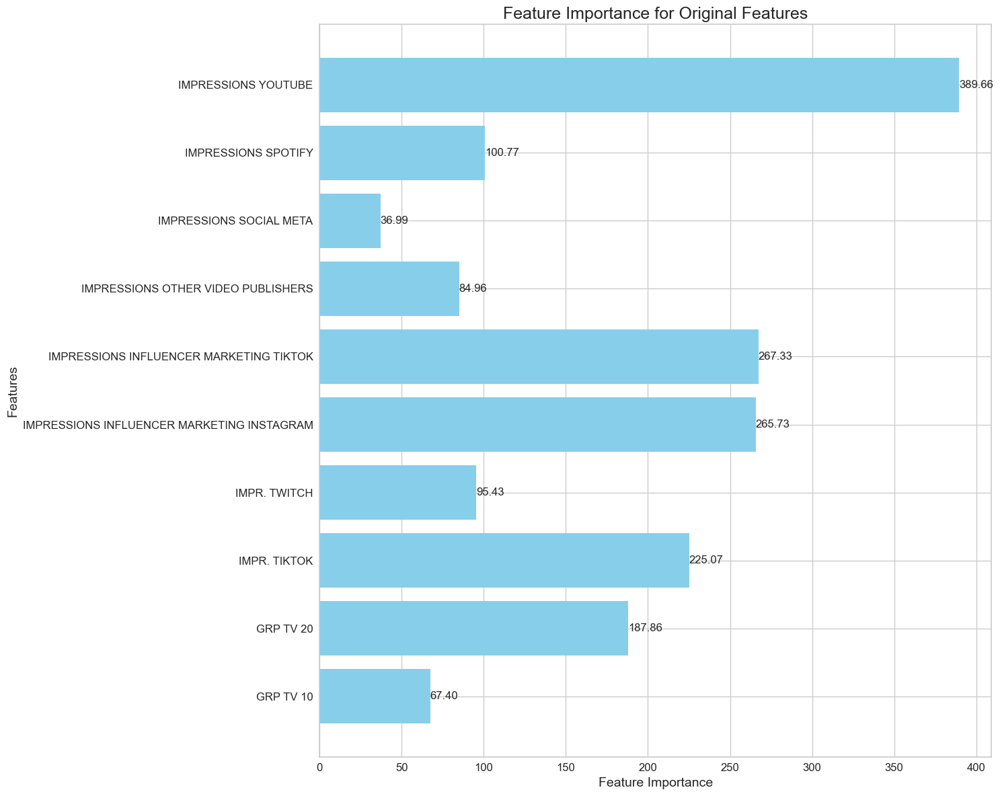

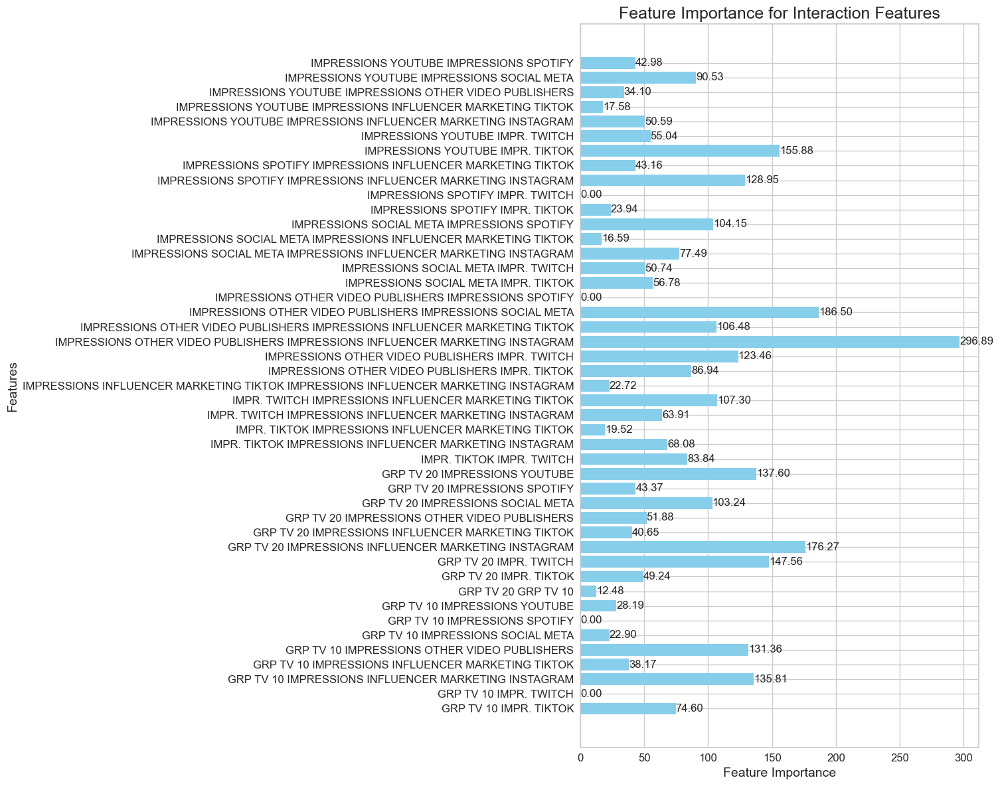

In [558]:
X = impressions_tv.drop(['TV+Digital'], axis=1)
y = impressions_tv['TV+Digital']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model_bayes, y_pred_bayes, r2_train_bayes, r2_test_bayes, feature_importance_bayes = perform_regression(
    X_train, X_test, y_train, 
    model_type='BayesianRidge', 
    tune_hyperparameters=False, 
    include_interactions=True, 
    degree=2
)

In [559]:
import pandas as pd

# Assuming your DataFrame is named 'df'
# List of column pairs based on the combinations you provided

column_pairs = [
    # Impressions-related combinations
    ["IMPRESSIONS YOUTUBE", "IMPRESSIONS SPOTIFY"],
    ["IMPRESSIONS YOUTUBE", "IMPRESSIONS SOCIAL META"],
    ["IMPRESSIONS YOUTUBE", "IMPRESSIONS OTHER VIDEO PUBLISHERS"],
    ["IMPRESSIONS YOUTUBE", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPRESSIONS YOUTUBE", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPRESSIONS YOUTUBE", "IMPR. TWITCH"],
    ["IMPRESSIONS YOUTUBE", "IMPR. TIKTOK"],
    ["IMPRESSIONS SPOTIFY", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPRESSIONS SPOTIFY", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPRESSIONS SPOTIFY", "IMPR. TWITCH"],
    ["IMPRESSIONS SPOTIFY", "IMPR. TIKTOK"],
    ["IMPRESSIONS SOCIAL META", "IMPRESSIONS SPOTIFY"],
    ["IMPRESSIONS SOCIAL META", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPRESSIONS SOCIAL META", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPRESSIONS SOCIAL META", "IMPR. TWITCH"],
    ["IMPRESSIONS SOCIAL META", "IMPR. TIKTOK"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPRESSIONS SPOTIFY"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPRESSIONS SOCIAL META"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPR. TWITCH"],
    ["IMPRESSIONS OTHER VIDEO PUBLISHERS", "IMPR. TIKTOK"],
    ["IMPRESSIONS INFLUENCER MARKETING TIKTOK", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPR. TWITCH", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPR. TWITCH", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPR. TIKTOK", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["IMPR. TIKTOK", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["IMPR. TIKTOK", "IMPR. TWITCH"],

    # GRP TV-related combinations
    ["GRP TV 20", "IMPRESSIONS YOUTUBE"],
    ["GRP TV 20", "IMPRESSIONS SPOTIFY"],
    ["GRP TV 20", "IMPRESSIONS SOCIAL META"],
    ["GRP TV 20", "IMPRESSIONS OTHER VIDEO PUBLISHERS"],
    ["GRP TV 20", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["GRP TV 20", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["GRP TV 20", "IMPR. TWITCH"],
    ["GRP TV 20", "IMPR. TIKTOK"],
    ["GRP TV 20", "GRP TV 10"],
    ["GRP TV 10", "IMPRESSIONS YOUTUBE"],
    ["GRP TV 10", "IMPRESSIONS SPOTIFY"],
    ["GRP TV 10", "IMPRESSIONS SOCIAL META"],
    ["GRP TV 10", "IMPRESSIONS OTHER VIDEO PUBLISHERS"],
    ["GRP TV 10", "IMPRESSIONS INFLUENCER MARKETING TIKTOK"],
    ["GRP TV 10", "IMPRESSIONS INFLUENCER MARKETING INSTAGRAM"],
    ["GRP TV 10", "IMPR. TWITCH"],
    ["GRP TV 10", "IMPR. TIKTOK"]
]

# Creating new interaction columns for each pair
for pair in column_pairs:
    col1, col2 = pair
    new_col_name = f"{col1} * {col2}"
    X3_copy[new_col_name] = impressions_tv[col1] * impressions_tv[col2]


In [560]:
X3_copy

,AVERAGE PROMO PRICE,ONLINE REVIEWS,ONLINE RATINGS,Negative Opinions,digital_investments,Sales Value Growth (%),season_Summer,season_Winter,NUMBER OF INFLUENCERS INVOLVED_log_lag_halo,INVESTMENTS TV_log_lag_halo,...,GRP TV 20 * IMPR. TIKTOK,GRP TV 20 * GRP TV 10,GRP TV 10 * IMPRESSIONS YOUTUBE,GRP TV 10 * IMPRESSIONS SPOTIFY,GRP TV 10 * IMPRESSIONS SOCIAL META,GRP TV 10 * IMPRESSIONS OTHER VIDEO PUBLISHERS,GRP TV 10 * IMPRESSIONS INFLUENCER MARKETING TIKTOK,GRP TV 10 * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM,GRP TV 10 * IMPR. TWITCH,GRP TV 10 * IMPR. TIKTOK
0,9.941495,6069.000000,4.673429,0.0,3.093619,0.000000,0,1,0.000000,3.511208,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,9.941495,6297.000000,4.654723,3.0,2.966570,-2.403710,0,1,0.000000,1.755604,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,9.941495,6566.000000,4.656731,2.0,2.801161,-1.932465,0,1,0.000000,4.439213,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,9.941495,6790.000000,4.653559,0.0,2.721618,5.597509,0,1,0.000000,5.725285,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9.941495,7084.000000,4.653488,3.0,4.290006,-3.168608,0,1,0.000000,2.862642,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,8.904765,30780.381756,4.626845,1.0,12.144160,1.877143,0,0,0.982956,0.455526,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
204,9.556374,31159.093424,4.643333,1.0,9.536558,-9.158479,0,0,0.491478,0.227763,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
205,9.540101,31813.634559,4.644802,3.0,16.657405,17.187078,0,1,0.245739,0.113882,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
206,9.147896,30224.935228,4.635054,4.0,34.449157,27.719724,0,1,0.122870,0.056941,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [561]:
import pandas as pd
import numpy as np
from sklearn.linear_model import BayesianRidge, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import RFE
from sklearn.exceptions import ConvergenceWarning
import warnings
from yellowbrick.regressor import ResidualsPlot

# Suppress convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Define the regression function
def perform_regression(X_train: pd.DataFrame, X_test: pd.DataFrame, y_train: pd.Series, 
                       model_type: str = 'OLS', simple: bool = True, alpha: float = 1.0,
                       tune_hyperparameters: bool = False, cv: int = 5, feature_selection: bool = True):
    """
    Perform regression with the specified model type, optionally perform hyperparameter tuning,
    feature selection, and cross-validation, and return the final model and predictions.
    """

    model = None
    y_pred = None
    y_train_pred = None

    # Standardize features if needed
    if model_type in ['BayesianRidge', 'Lasso', 'Ridge']:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        X_train = pd.DataFrame(X_train_scaled, index=X_train.index, columns=X_train.columns)
        X_test = pd.DataFrame(X_test_scaled, index=X_test.index, columns=X_test.columns)

    if model_type == 'OLS':
        # Add a constant to the features for OLS regression
        X_train_const = sm.add_constant(X_train)
        X_test_const = sm.add_constant(X_test)

        # Initialize and fit the model
        model = sm.OLS(y_train, X_train_const)
        results = model.fit()
        y_pred = results.predict(X_test_const)
        y_train_pred = results.predict(X_train_const)

        # Print the summary
        if simple:
            print(results.summary())
        else:
            # Get the p-values of the features
            p_values = results.pvalues

            # Get the features with p-value less than 0.05
            significant_features = p_values[p_values < 0.05].index

            # Perform regression again with the significant features
            X_train_significant = X_train_const[significant_features]
            X_test_significant = X_test_const[significant_features]

            # Initialize and fit the model
            model = sm.OLS(y_train, X_train_significant)
            results = model.fit()

            # Print the summary
            print(results.summary())

            # Make predictions
            y_pred = results.predict(X_test_significant)
            y_train_pred = results.predict(X_train_significant)

    elif model_type == 'BayesianRidge':
        model = BayesianRidge()
        if tune_hyperparameters:
            param_grid = {'alpha_1': [1e-6, 1e-4, 1e-2, 1e0], 'alpha_2': [1e-6, 1e-4, 1e-2, 1e0]}
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Coefficients interpretation
        coef = model.coef_
        selected_features = X_train.columns[np.abs(coef) > 1e-5]
        X_train_selected = sm.add_constant(X_train[selected_features])
        results = sm.OLS(y_train, X_train_selected).fit()
        print(results.summary())

    elif model_type == 'RandomForest':
        model = RandomForestRegressor(n_estimators=1000, random_state=42)
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'max_features': ['auto', 'sqrt', 'log2'],
                'max_depth': [None, 10, 20, 30],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Feature importance
        importance = model.feature_importances_
        sorted_idx = np.argsort(importance)
        plt.barh(X_train.columns[sorted_idx], importance[sorted_idx])
        plt.xlabel("Random Forest Feature Importance")
        plt.show()

    elif model_type == 'GBM':
        model = GradientBoostingRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.05],
                'max_depth': [3, 5, 7],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Feature importance
        importance = model.feature_importances_
        sorted_idx = np.argsort(importance)
        plt.barh(X_train.columns[sorted_idx], importance[sorted_idx])
        plt.xlabel("GBM Feature Importance")
        plt.show()

    elif model_type == 'XGBoost':
        model = XGBRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.2],
                'max_depth': [3, 5, 7],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Feature importance with SHAP
        explainer = shap.Explainer(model, X_train)
        shap_values = explainer(X_train)
        shap.summary_plot(shap_values, X_train, plot_type="bar")

    elif model_type == 'Lasso':
        lasso = Lasso(alpha=alpha, max_iter=10000)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(lasso, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            lasso = grid.best_estimator_
        else:
            lasso.fit(X_train, y_train)
        
        y_pred = lasso.predict(X_test)
        y_train_pred = lasso.predict(X_train)

        # Select features with non-zero coefficients
        selected_features = X_train.columns[lasso.coef_ != 0]
        print("Selected features:", selected_features)

        # Use OLS for interpretability
        X_train_selected = sm.add_constant(X_train[selected_features])
        X_test_selected = sm.add_constant(X_test[selected_features])
    
        ols_model = sm.OLS(y_train, X_train_selected)
        ols_results = ols_model.fit()
        print(ols_results.summary())
        y_pred = ols_results.predict(X_test_selected)
        y_train_pred = ols_results.predict(X_train_selected)

    elif model_type == 'Ridge':
        ridge = Ridge(alpha=alpha)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(ridge, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            ridge = grid.best_estimator_
        else:
            ridge.fit(X_train, y_train)
        
        y_pred = ridge.predict(X_test)
        y_train_pred = ridge.predict(X_train)

        # Select features with coefficients above a certain threshold
        threshold = 1e-5  # Define a threshold for significance
        selected_features = X_train.columns[np.abs(ridge.coef_) > threshold]
        print("Selected features for Ridge:", selected_features)
    
        # Use OLS for interpretability
        X_train_selected = sm.add_constant(X_train[selected_features])
        X_test_selected = sm.add_constant(X_test[selected_features])
    
        ols_model = sm.OLS(y_train, X_train_selected)
        ols_results = ols_model.fit()
        print(ols_results.summary())
        y_pred = ols_results.predict(X_test_selected)
        y_train_pred = ols_results.predict(X_train_selected)
    
    else:
        raise ValueError(f"Unsupported model type: {model_type}")

    # Cross-Validation (Optional)
    if model_type not in ['OLS'] and not simple:
        cv_scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='r2')
        print(f"Cross-Validation R2 Score: {np.mean(cv_scores)} ± {np.std(cv_scores)}")

    # Calculate and print R2 scores
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_pred)
    print(f"R2 Score (Train): {r2_train}")
    print(f"R2 Score (Test): {r2_test}")

    return model, y_pred


                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.924
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     26.58
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           3.94e-44
Time:                        00:28:15   Log-Likelihood:                -1476.2
No. Observations:                 166   AIC:                             3058.
Df Residuals:                     113   BIC:                             3223.
Df Model:                          52                                         
Covariance Type:            nonrobust                                         
                                                                                           coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

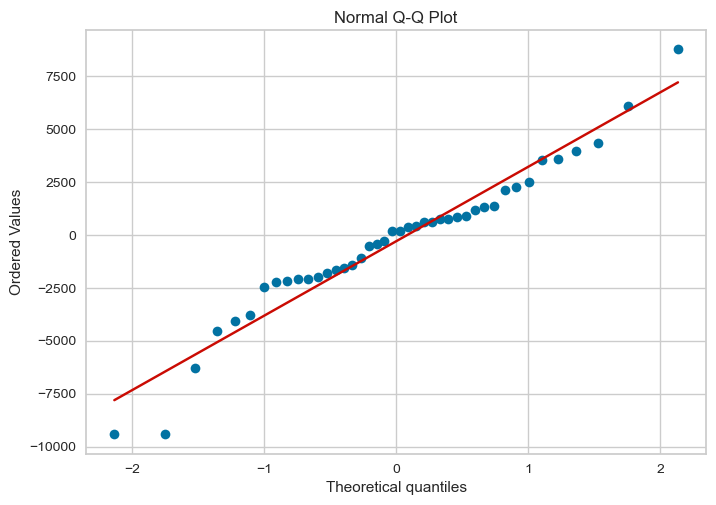


Actual vs Predicted:


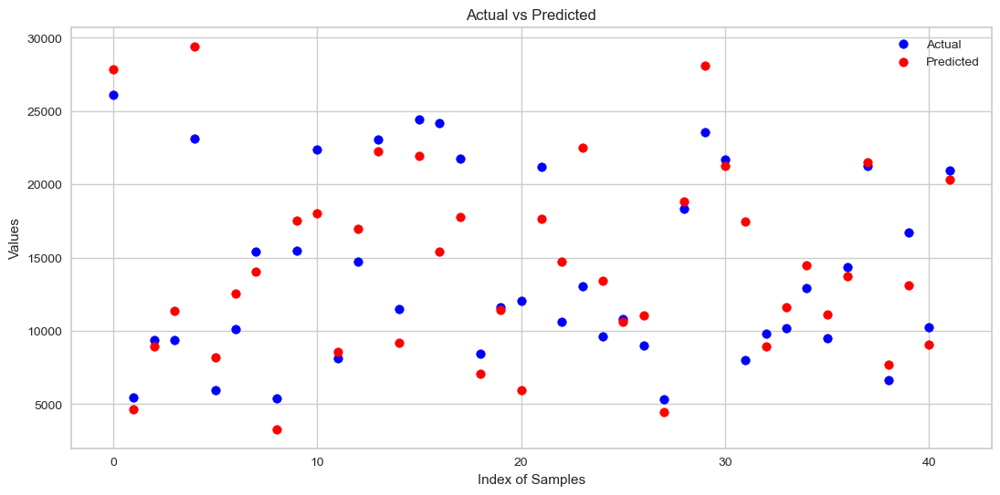

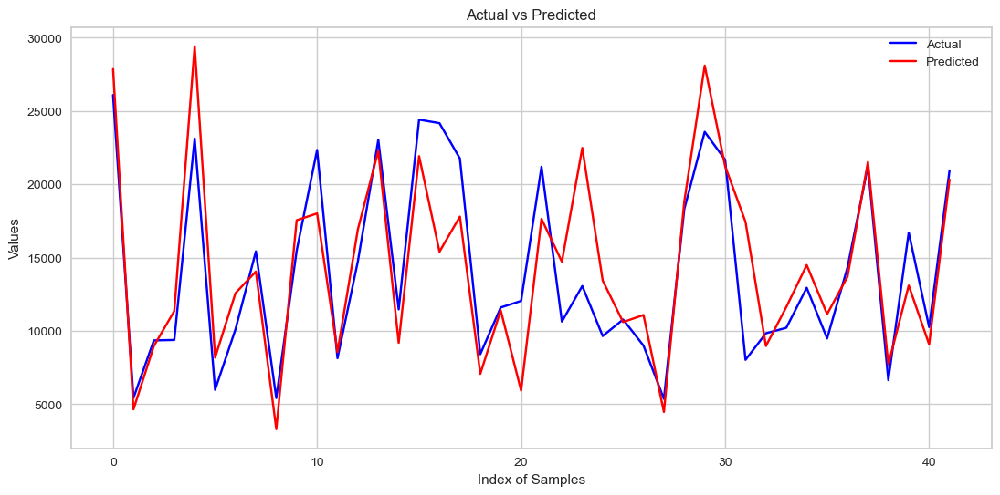

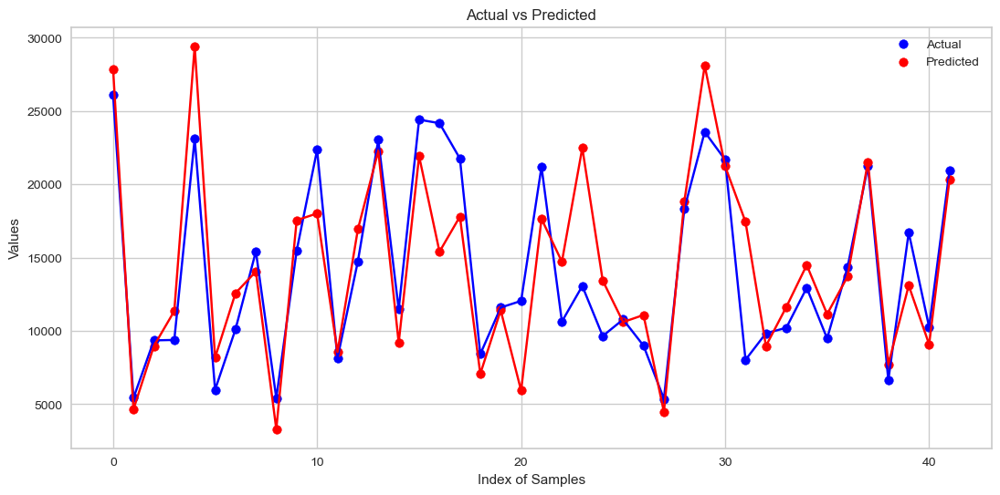


Residuals Scatter Plot:


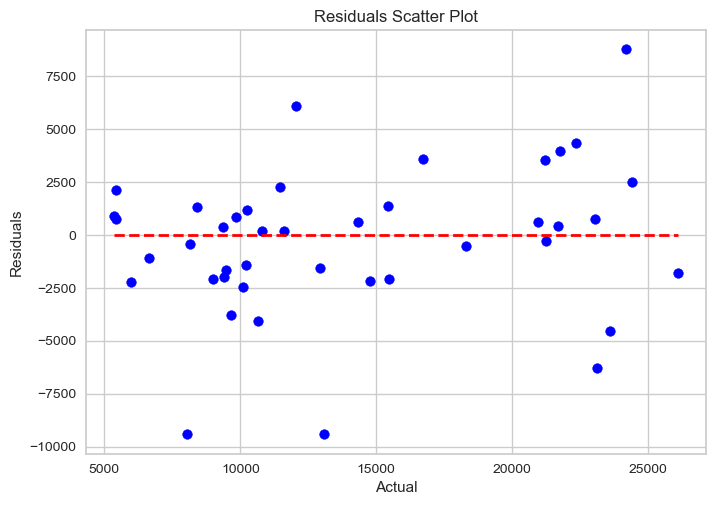


Residuals Histogram:


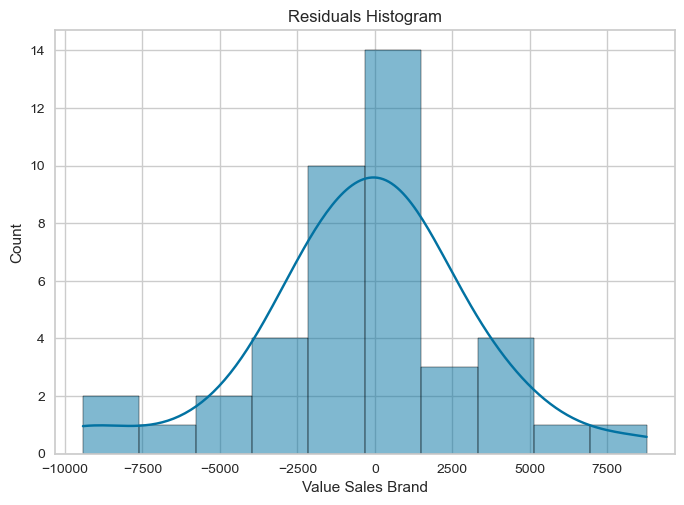

In [562]:
# Assuming dframe1 is your dataframe
X3_copy
y3_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X3_copy, y3_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.912
Model:                            OLS   Adj. R-squared:                  0.885
Method:                 Least Squares   F-statistic:                     33.56
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           5.01e-50
Time:                        00:28:15   Log-Likelihood:                -1488.7
No. Observations:                 166   AIC:                             3057.
Df Residuals:                     126   BIC:                             3182.
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                                                                                           coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

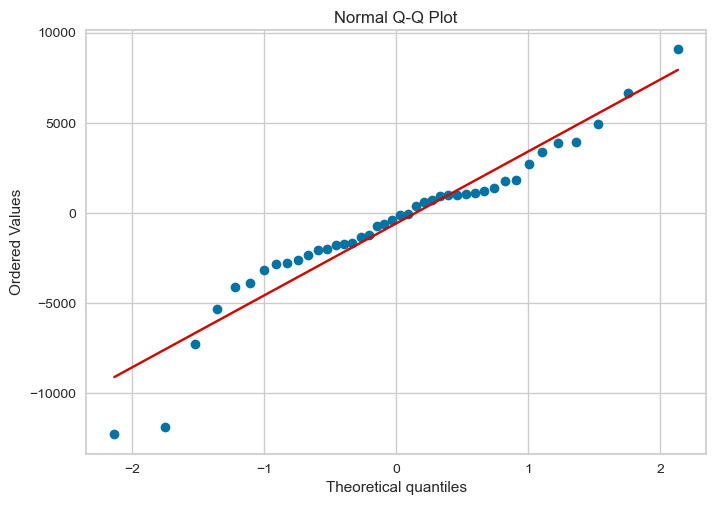


Actual vs Predicted:


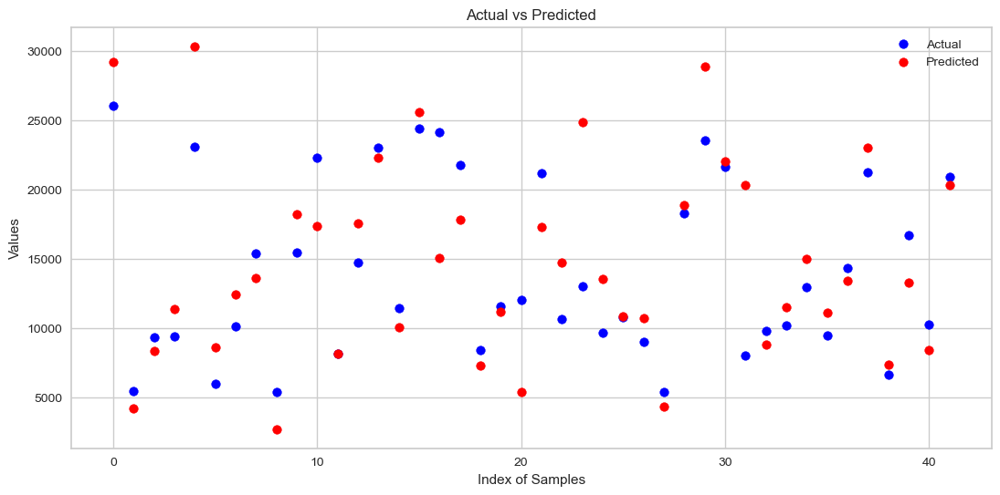

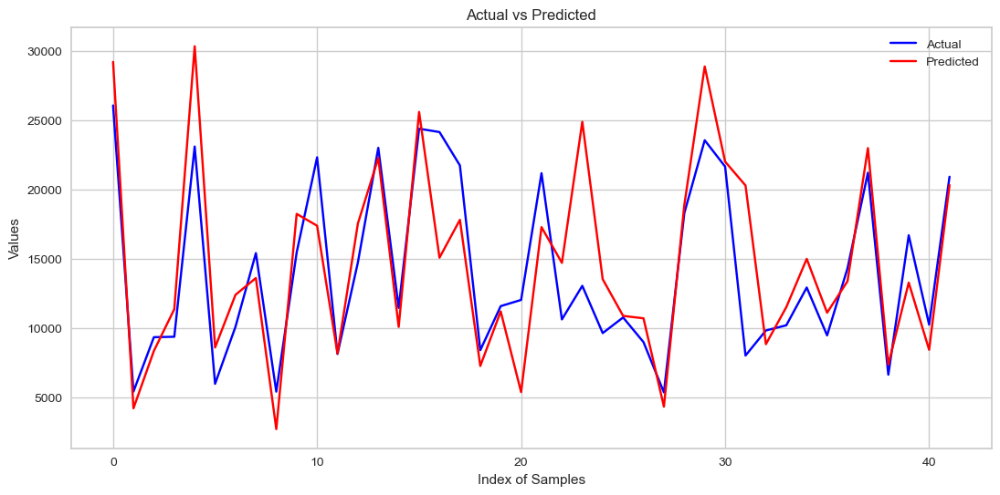

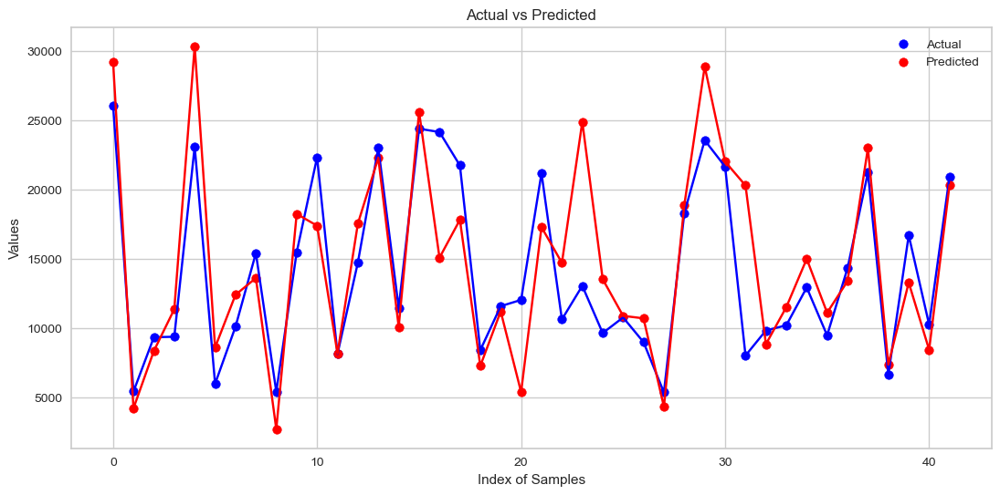


Residuals Scatter Plot:


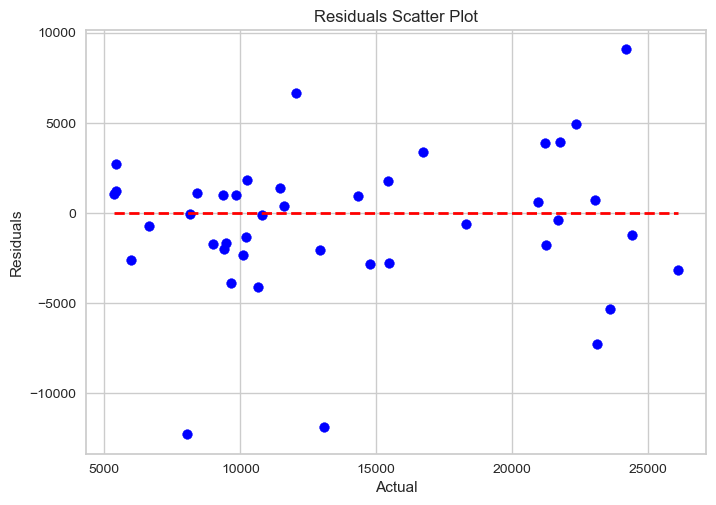


Residuals Histogram:


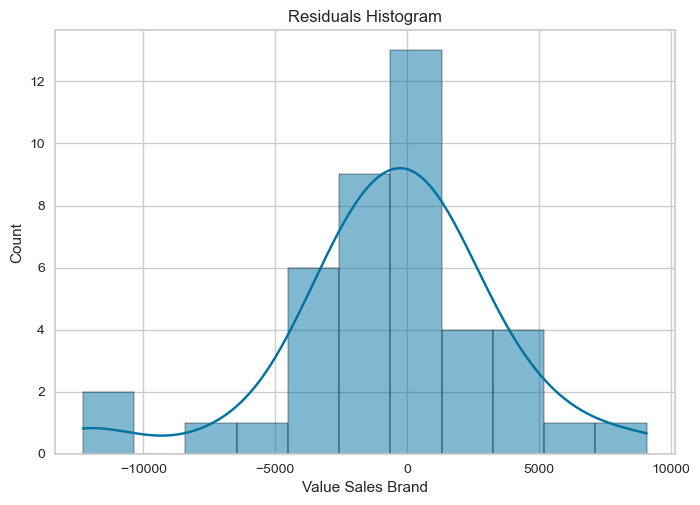

In [563]:
# Assuming dframe1 is your dataframe
X4_copy = X3_copy.drop([    'NUMBER OF INFLUENCERS INVOLVED_log_lag_halo',
    'IMPRESSIONS YOUTUBE * IMPRESSIONS OTHER VIDEO PUBLISHERS',
    'IMPRESSIONS YOUTUBE * IMPRESSIONS INFLUENCER MARKETING TIKTOK',
    'IMPRESSIONS YOUTUBE * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM',
    'IMPRESSIONS YOUTUBE * IMPR. TWITCH',
    'IMPRESSIONS YOUTUBE * IMPR. TIKTOK',
    'IMPRESSIONS SPOTIFY * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM',
    'IMPRESSIONS SOCIAL META * IMPR. TWITCH',
    'IMPRESSIONS OTHER VIDEO PUBLISHERS * IMPRESSIONS INFLUENCER MARKETING TIKTOK',
    'IMPRESSIONS OTHER VIDEO PUBLISHERS * IMPR. TWITCH',
    'IMPRESSIONS OTHER VIDEO PUBLISHERS * IMPR. TIKTOK',
    'IMPR. TWITCH * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM',
    'IMPR. TIKTOK * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM'], axis = 1)
y4_copy = y3_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X4_copy, y4_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.911
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     42.79
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           2.20e-55
Time:                        00:28:16   Log-Likelihood:                -1489.4
No. Observations:                 166   AIC:                             3045.
Df Residuals:                     133   BIC:                             3147.
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                                                                                           coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

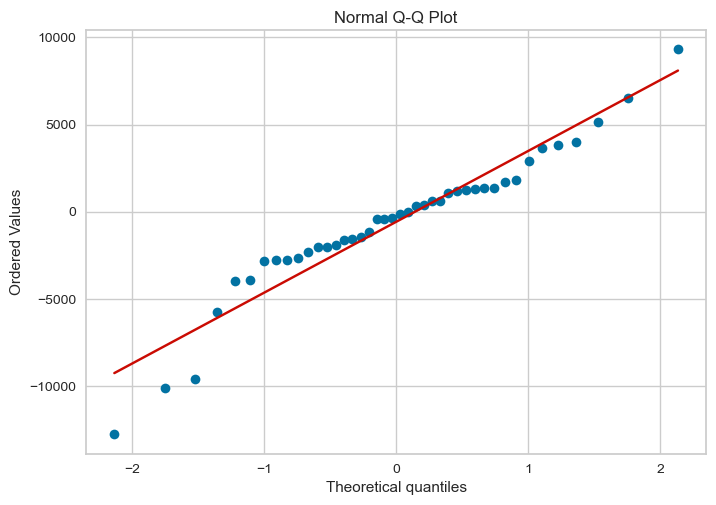


Actual vs Predicted:


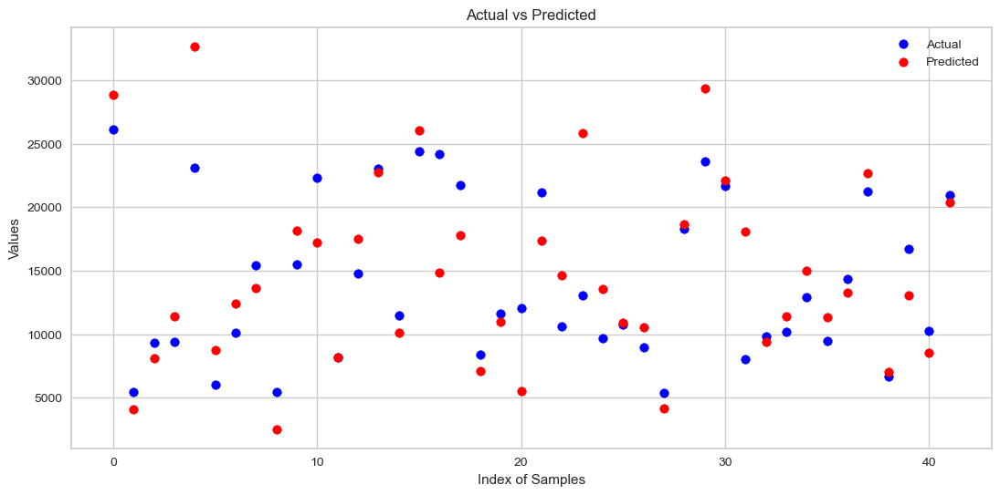

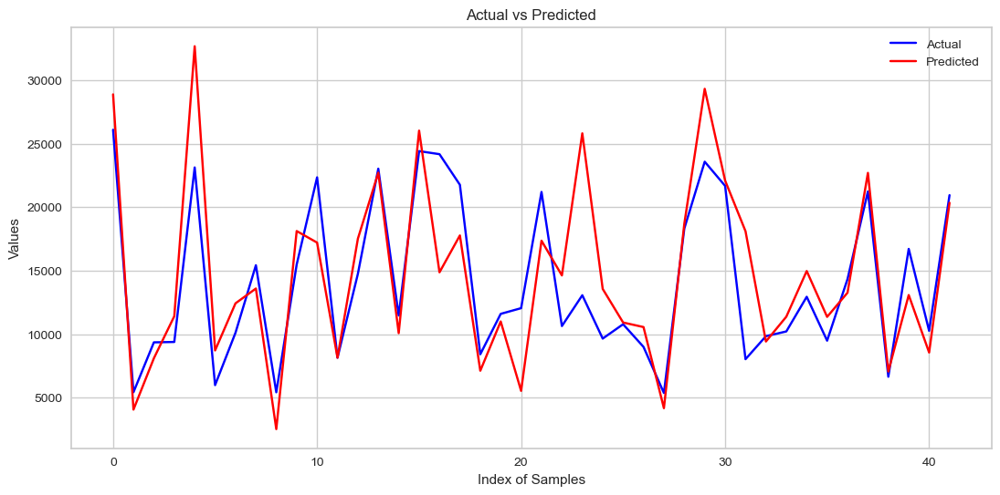

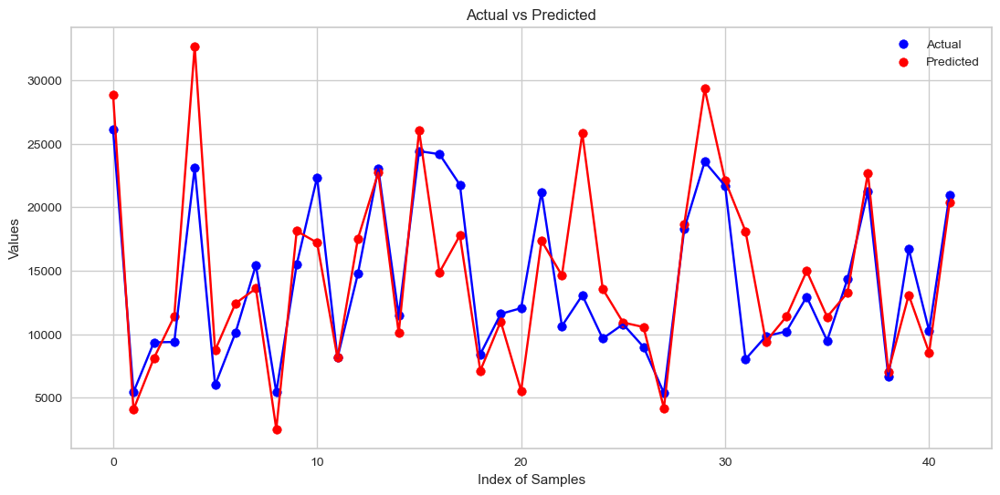


Residuals Scatter Plot:


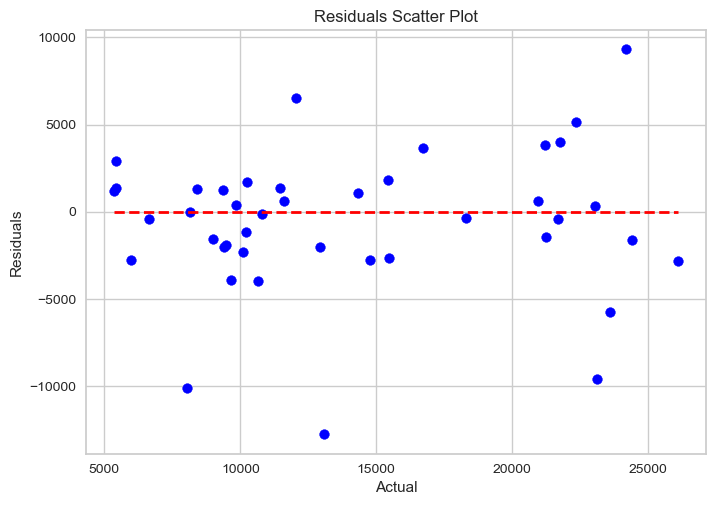


Residuals Histogram:


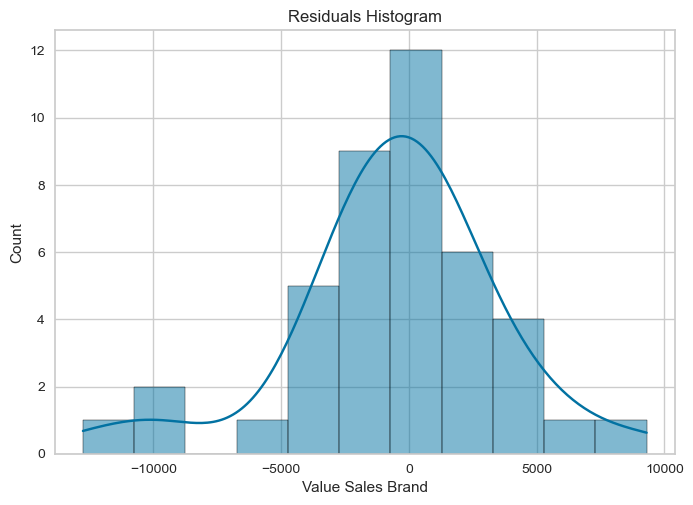

In [564]:
# Assuming dframe1 is your dataframe
X5_copy = X4_copy.drop(['IMPRESSIONS SPOTIFY * IMPRESSIONS INFLUENCER MARKETING TIKTOK',
                        'Negative Opinions', 'GRP TV 20 * IMPRESSIONS SPOTIFY', 'GRP TV 20 * IMPRESSIONS SOCIAL META',
                        'GRP TV 20 * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM', 'GRP TV 10 * IMPRESSIONS YOUTUBE', 'GRP TV 10 * IMPR. TIKTOK'], axis = 1)
y5_copy = y4_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X5_copy, y5_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.910
Model:                            OLS   Adj. R-squared:                  0.892
Method:                 Least Squares   F-statistic:                     49.59
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           2.45e-58
Time:                        00:28:16   Log-Likelihood:                -1490.5
No. Observations:                 166   AIC:                             3039.
Df Residuals:                     137   BIC:                             3129.
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                                                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

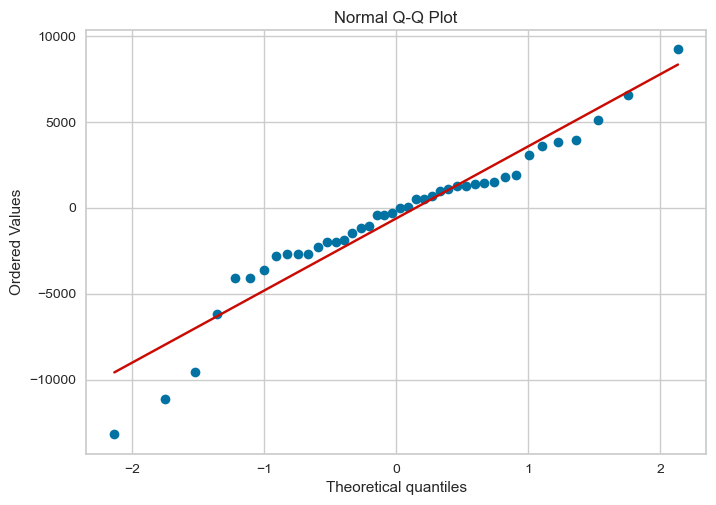


Actual vs Predicted:


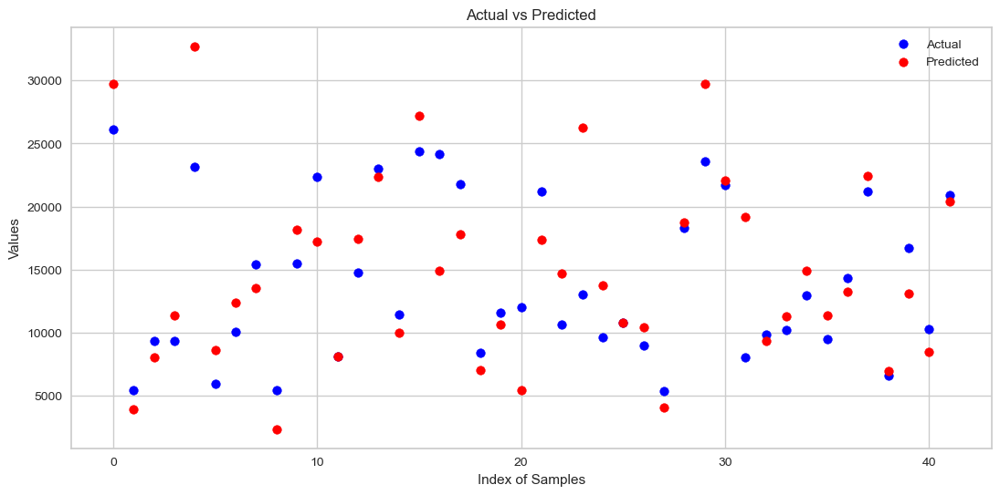

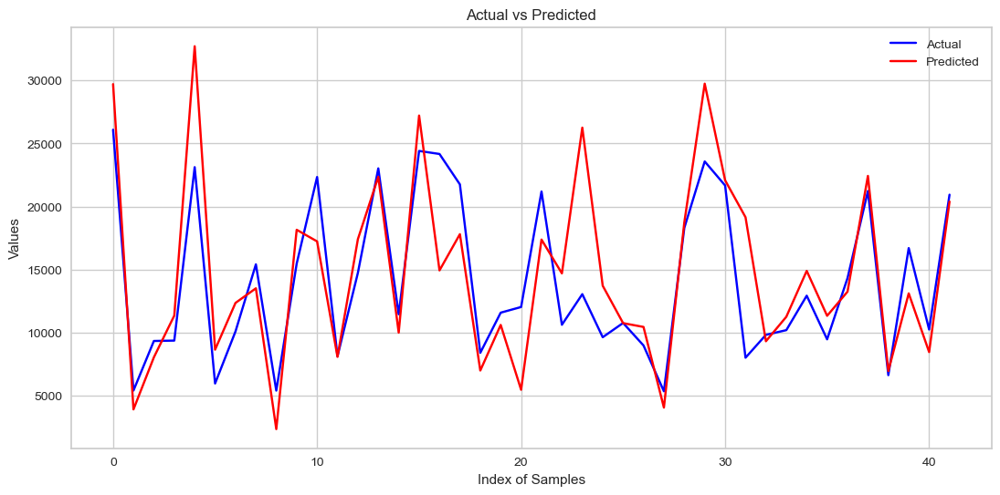

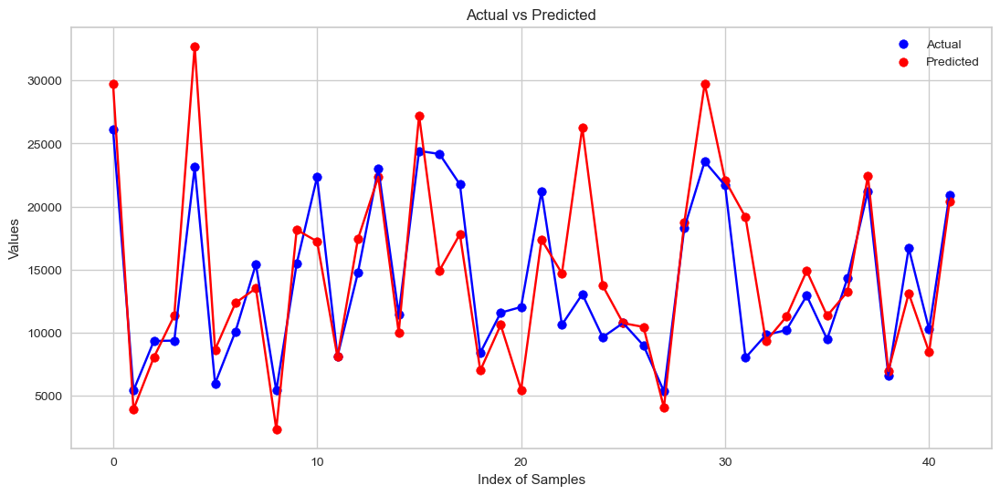


Residuals Scatter Plot:


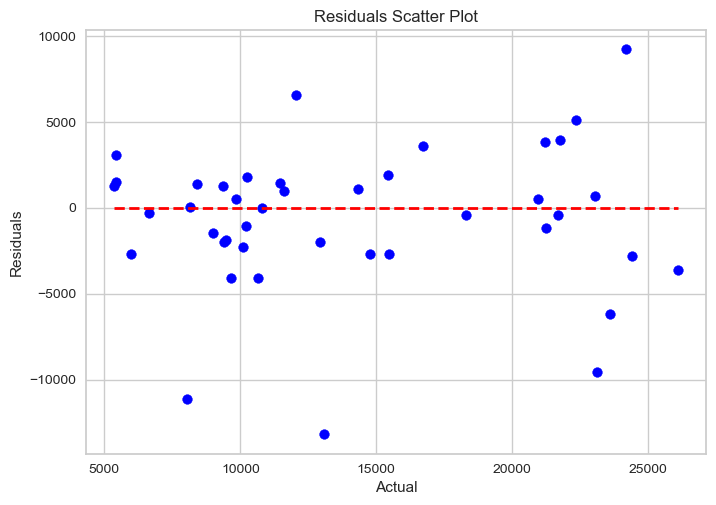


Residuals Histogram:


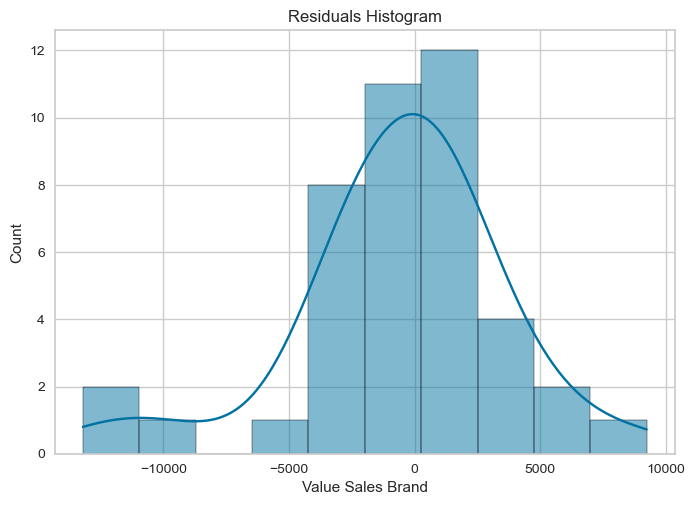

In [565]:
# Assuming dframe1 is your dataframe
X6_copy = X5_copy.drop(['GRP TV 10 * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM', 'GRP TV 20 * IMPR. TWITCH',
                        'IMPRESSIONS INFLUENCER MARKETING TIKTOK * IMPRESSIONS INFLUENCER MARKETING INSTAGRAM',
                        'GRP TV 10 * IMPRESSIONS SOCIAL META'], axis = 1)
y6_copy = y5_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X6_copy, y6_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.906
Model:                            OLS   Adj. R-squared:                  0.889
Method:                 Least Squares   F-statistic:                     56.30
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           2.58e-60
Time:                        00:28:17   Log-Likelihood:                -1494.8
No. Observations:                 166   AIC:                             3040.
Df Residuals:                     141   BIC:                             3117.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                                                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

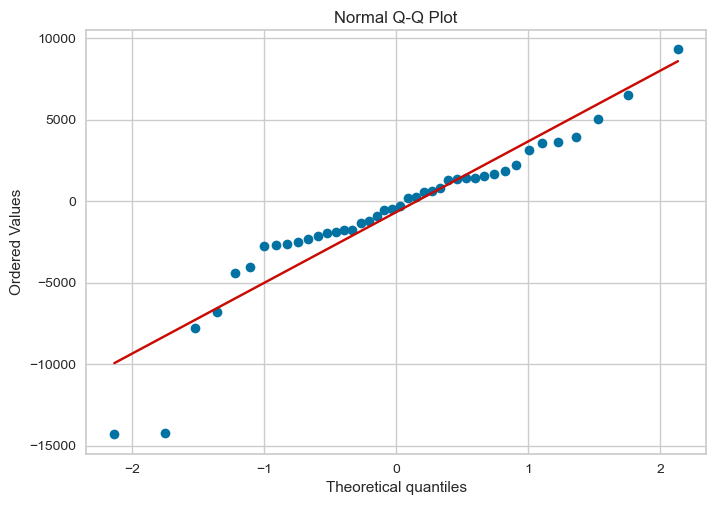


Actual vs Predicted:


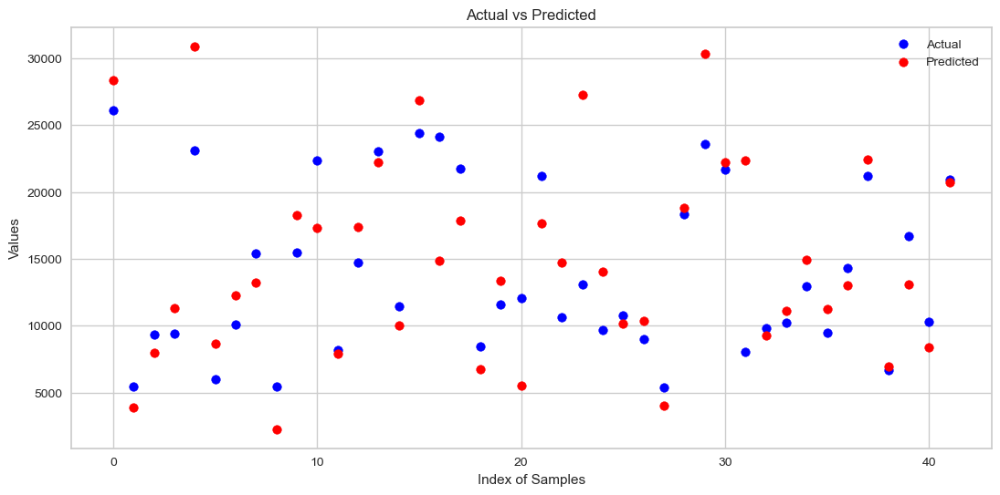

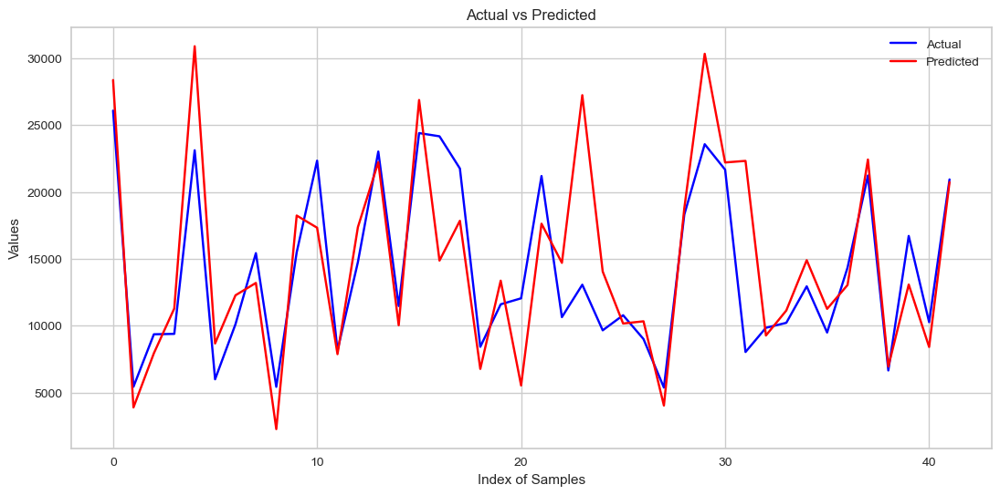

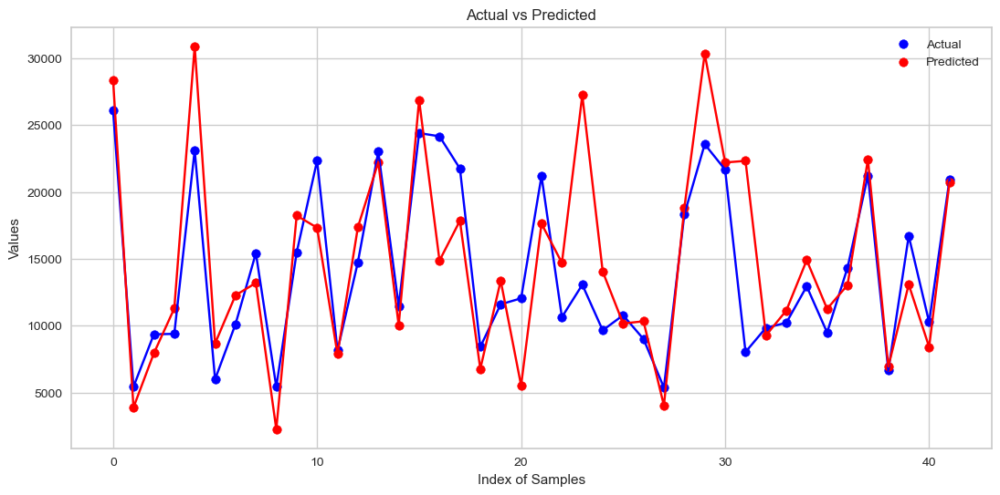


Residuals Scatter Plot:


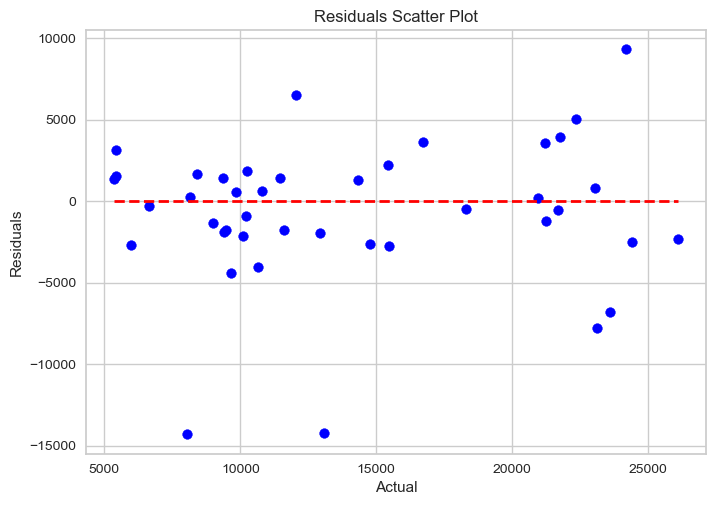


Residuals Histogram:


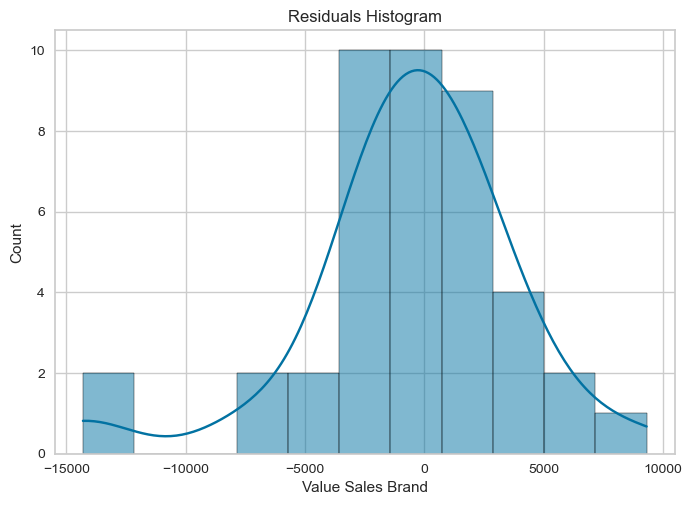

In [566]:
# Assuming dframe1 is your dataframe
X7_copy = X6_copy.drop(['GRP TV 20 * GRP TV 10', 'IMPR. TIKTOK * IMPRESSIONS INFLUENCER MARKETING TIKTOK', 
                        'GRP TV 10 * IMPRESSIONS INFLUENCER MARKETING TIKTOK', 'GRP TV 10 * IMPRESSIONS OTHER VIDEO PUBLISHERS'], axis = 1)
y7_copy = y6_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X7_copy, y7_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.905
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     58.96
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           4.14e-61
Time:                        00:28:17   Log-Likelihood:                -1495.0
No. Observations:                 166   AIC:                             3038.
Df Residuals:                     142   BIC:                             3113.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

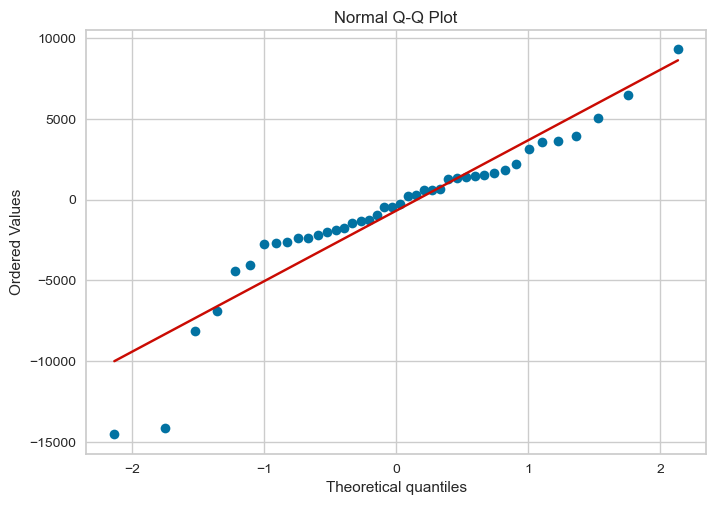


Actual vs Predicted:


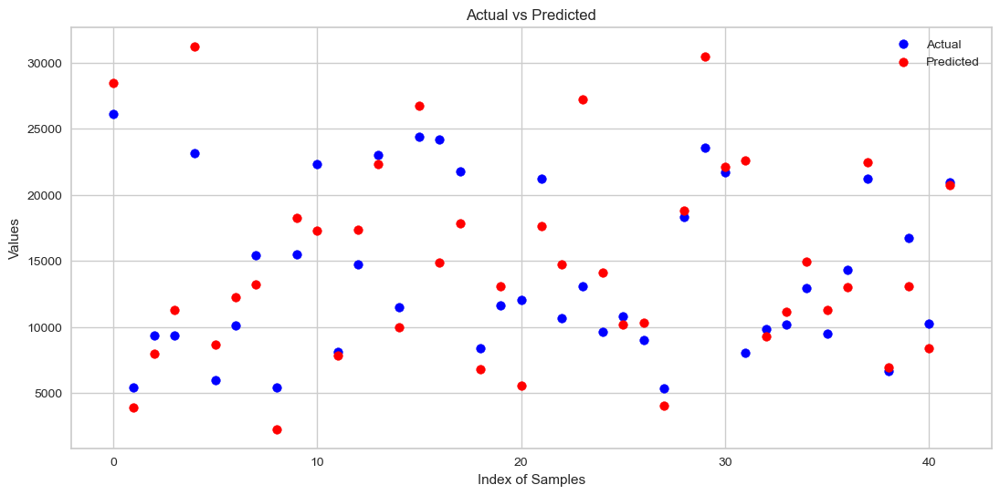

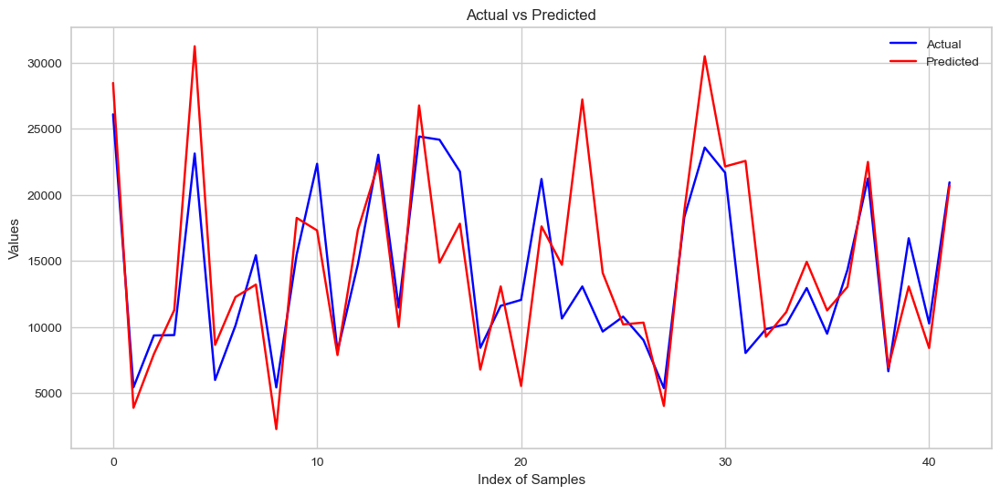

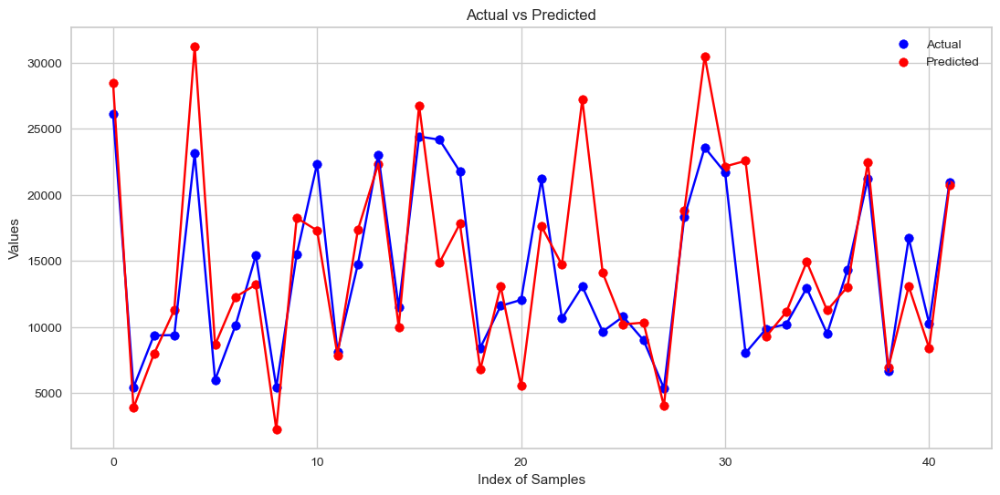


Residuals Scatter Plot:


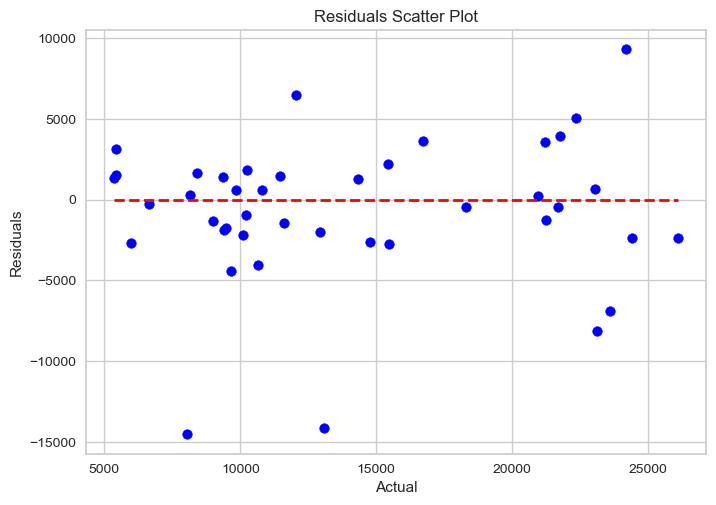


Residuals Histogram:


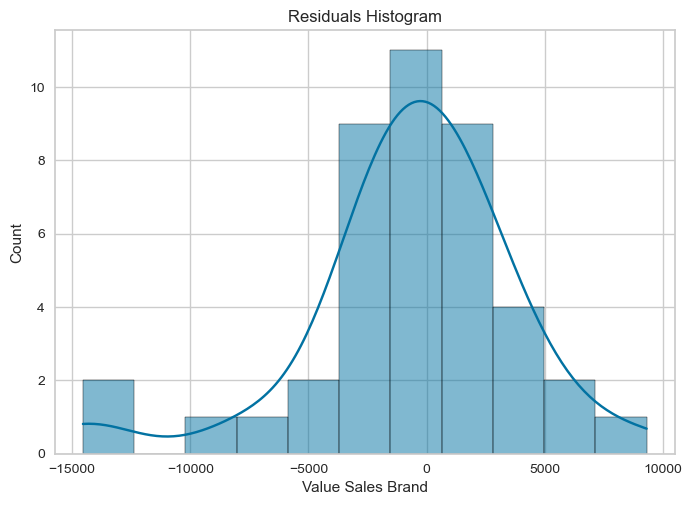

In [567]:
# Assuming dframe1 is your dataframe
X8_copy = X7_copy.drop(['GRP TV 20 * IMPR. TIKTOK'], axis = 1)
y8_copy = y7_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X8_copy, y8_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)